# Separate runs by HKLE due to size limits ( 

# Positions rounded to 10,000

In [1]:
data="TCGA/focused.10000.T.csv.gz"

In [2]:
hkle='HERVK113'

['HERVK113', 'SVA_A', 'SVA_B', 'SVA_C', 'SVA_D', 'SVA_E', 'SVA_F']

Number of insertions detected needed to call insertion present

In [3]:
threshold=2   # 1

In [4]:
import numpy as np
np.__version__

'1.20.3'

In [5]:
import pandas as pd
pd.__version__

'1.2.4'

In [6]:
import matplotlib
matplotlib.__version__

'3.4.2'

In [7]:
import matplotlib.pyplot as plt

In [8]:
# Adjust plot size
#options(repr.plot.width=16, repr.plot.height=6)

# For some reason, if this is in the same cell as the import command, it doesn't work.
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [9]:
import scipy
scipy.__version__

'1.6.3'

In [10]:
from scipy import stats

In [11]:
import seaborn as sns
sns.__version__

'0.11.1'

In [12]:
from datetime import datetime

In [13]:
default_max_columns=pd.get_option('display.max_columns')

In [14]:
default_max_rows=pd.get_option('display.max_rows')

In [15]:
default_precision=pd.get_option('display.precision')

In [16]:
pd.set_option('display.precision', 2)

In [17]:
#default_threshold=np.get_printoptions()['threshold']

In [18]:
#np.set_printoptions(threshold=10000000)

# Read Metadata 1

In [19]:
mt1=pd.read_csv("TCGA/metadata.cart.TCGA.GBM-LGG.WGS.bam.2020-07-17.csv",header=None,
 names=['submitter','days_to_death','gender','disease_type','center_name'])

In [20]:
mt1.shape

(127, 5)

In [21]:
mt1.rename(columns={"submitter": "subject"},inplace=True)
mt1.rename(columns={"gender": "gender1"},inplace=True)

In [22]:
mt1.head()

,subject,days_to_death,gender1,disease_type,center_name
0,02-2483,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
1,02-2485,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
2,06-0125,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
3,06-0152,375.0,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
4,06-0157,97.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard


In [23]:
list(mt1)

['subject', 'days_to_death', 'gender1', 'disease_type', 'center_name']

# Read Metadata 2

In [24]:
mt2=pd.read_csv("TCGA/TCGA.Glioma.metadata.tsv",sep="\t")

In [25]:
mt2.shape

(1114, 18)

In [26]:
mt2.head()

,case_submitter_id,project_id,primary_diagnosis,race,ethnicity,gender,RE_names,IDH,x1p19q,TERT,IDH_1p19q_status,WHO_groups,Triple_group,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status
0,TCGA-02-0001,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,44.0,11.76,1.0
1,TCGA-02-0003,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,50.0,4.73,1.0
2,TCGA-02-0004,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,NaN,NaN,IDH-WT:1p19q-NA,NaN,IDH-WT:1p19q-NA:TERT-NA,MD Anderson Cancer Center,NaN,59.0,11.33,1.0
3,TCGA-02-0006,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,56.0,18.33,1.0
4,TCGA-02-0007,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,40.0,23.16,1.0


In [27]:
list(mt2)

['case_submitter_id',
 'project_id',
 'primary_diagnosis',
 'race',
 'ethnicity',
 'gender',
 'RE_names',
 'IDH',
 'x1p19q',
 'TERT',
 'IDH_1p19q_status',
 'WHO_groups',
 'Triple_group',
 'Tissue_sample_location',
 'MGMT',
 'Age',
 'Survival_months',
 'Vital_status']

In [28]:
mt2['subject']=mt2['case_submitter_id'].astype(str).str[5:12]

In [29]:
mt2[['subject','case_submitter_id']].head()

,subject,case_submitter_id
0,02-0001,TCGA-02-0001
1,02-0003,TCGA-02-0003
2,02-0004,TCGA-02-0004
3,02-0006,TCGA-02-0006
4,02-0007,TCGA-02-0007


In [30]:
mt2.drop('case_submitter_id',axis='columns',inplace=True)
mt2.rename(columns={"gender": "gender2"},inplace=True)

In [31]:
list(mt2)

['project_id',
 'primary_diagnosis',
 'race',
 'ethnicity',
 'gender2',
 'RE_names',
 'IDH',
 'x1p19q',
 'TERT',
 'IDH_1p19q_status',
 'WHO_groups',
 'Triple_group',
 'Tissue_sample_location',
 'MGMT',
 'Age',
 'Survival_months',
 'Vital_status',
 'subject']

# Merge Metadata

In [32]:
#meta=mt2.merge(mt1,left_on='subject2',right_on='subject1',suffixes=["_mt2","_mt1"],how='inner')
meta=mt2.merge(mt1,on='subject',suffixes=["_mt2","_mt1"],how='inner')

In [33]:
del mt1
del mt2

In [34]:
meta.head()

,project_id,primary_diagnosis,race,ethnicity,gender2,RE_names,IDH,x1p19q,TERT,IDH_1p19q_status,...,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status,subject,days_to_death,gender1,disease_type,center_name
0,TCGA-GBM,Glioblastoma,asian,not hispanic or latino,male,02-2483-01A-01R-1849-01+1,Mutant,non-codel,WT,IDH-Mutant:1p19q-non-codel,...,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,02-2483,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
1,TCGA-GBM,Glioblastoma,black or african american,not hispanic or latino,male,02-2485-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,MD Anderson Cancer Center,Unmethylated,53.0,15.44,0.0,02-2485,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
2,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,06-0125-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,Henry Ford Hospital,Methylated,63.0,47.57,1.0,06-0125,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
3,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,...,Henry Ford Hospital,NaN,68.0,12.32,1.0,06-0152,375.0,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
4,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,06-0157-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,Henry Ford Hospital,NaN,63.0,3.19,1.0,06-0157,97.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard


In [35]:
meta.drop(meta[(meta['subject']=='CS-6186') & (meta['center_name']=='Harvard Medical School')].index,inplace=True)

In [36]:
meta.drop(meta[(meta['subject']=='DU-5872') & (meta['center_name']=='Harvard Medical School')].index,inplace=True)

In [37]:
meta.columns

Index(['project_id', 'primary_diagnosis', 'race', 'ethnicity', 'gender2',
       'RE_names', 'IDH', 'x1p19q', 'TERT', 'IDH_1p19q_status', 'WHO_groups',
       'Triple_group', 'Tissue_sample_location', 'MGMT', 'Age',
       'Survival_months', 'Vital_status', 'subject', 'days_to_death',
       'gender1', 'disease_type', 'center_name'],
      dtype='object')

In [38]:
meta['primary_diagnosis'].value_counts()

Glioblastoma                     35
Oligodendroglioma, NOS           33
Astrocytoma, anaplastic          24
Mixed glioma                     16
Astrocytoma, NOS                  9
Oligodendroglioma, anaplastic     8
Name: primary_diagnosis, dtype: int64

In [39]:
meta['TERT'].value_counts()

Mutant    68
WT        54
Name: TERT, dtype: int64

In [40]:
meta['IDH'].value_counts()

Mutant    74
WT        50
Name: IDH, dtype: int64

In [41]:
meta['x1p19q'].value_counts()

non-codel    102
codel         23
Name: x1p19q, dtype: int64

In [42]:
meta['disease_type'].value_counts()

Brain Lower Grade Glioma    90
Glioblastoma Multiforme     35
Name: disease_type, dtype: int64

In [43]:
meta['gender1'].value_counts()

male      72
female    53
Name: gender1, dtype: int64

In [44]:
meta['race'].value_counts()

white                        114
black or african american      7
not reported                   3
asian                          1
Name: race, dtype: int64

In [45]:
meta['ethnicity'].value_counts()

not hispanic or latino    108
not reported               11
hispanic or latino          6
Name: ethnicity, dtype: int64

In [46]:
meta['IDH_1p19q_status'].value_counts()

IDH-Mutant:1p19q-non-codel    51
IDH-WT:1p19q-non-codel        50
IDH-Mutant:1p19q-codel        23
IDH-NA:1p19q-non-codel         1
Name: IDH_1p19q_status, dtype: int64

In [47]:
meta['WHO_groups'].value_counts()

glioblastoma:IDH-WT:1p19q-non-codel             29
oligodendroglioma:IDH-Mutant:1p19q-codel        23
astrocytoma:IDH-Mutant:1p19q-non-codel          18
oligodendroglioma:IDH-Mutant:1p19q-non-codel    13
astrocytoma:IDH-WT:1p19q-non-codel              13
oligoastrocytoma:IDH-Mutant:1p19q-non-codel     11
glioblastoma:IDH-Mutant:1p19q-non-codel          5
oligoastrocytoma:IDH-WT:1p19q-non-codel          4
oligodendroglioma:IDH-WT:1p19q-non-codel         4
Name: WHO_groups, dtype: int64

In [48]:
meta['Triple_group'].value_counts()

IDH-Mutant:1p19q-non-codel:TERT-WT        49
IDH-WT:1p19q-non-codel:TERT-Mutant        44
IDH-Mutant:1p19q-codel:TERT-Mutant        22
IDH-WT:1p19q-non-codel:TERT-WT             4
IDH-WT:1p19q-non-codel:TERT-NA             2
IDH-NA:1p19q-non-codel:TERT-Mutant         1
IDH-Mutant:1p19q-non-codel:TERT-Mutant     1
IDH-Mutant:1p19q-codel:TERT-WT             1
IDH-Mutant:1p19q-non-codel:TERT-NA         1
Name: Triple_group, dtype: int64

In [49]:
meta['MGMT'].value_counts()

Methylated      87
Unmethylated    27
Name: MGMT, dtype: int64

In [50]:
meta['center_name'].value_counts()

Broad Institute of MIT and Harvard    75
Harvard Medical School                50
Name: center_name, dtype: int64

## We need a multi-level index to merge with df later so adding an empty index level

In [51]:
meta.columns=[meta.columns,[''] * len(meta.columns)]

In [52]:
#meta.columns.names=['chromosome','position']

In [53]:
meta.columns

MultiIndex([(            'project_id', ''),
            (     'primary_diagnosis', ''),
            (                  'race', ''),
            (             'ethnicity', ''),
            (               'gender2', ''),
            (              'RE_names', ''),
            (                   'IDH', ''),
            (                'x1p19q', ''),
            (                  'TERT', ''),
            (      'IDH_1p19q_status', ''),
            (            'WHO_groups', ''),
            (          'Triple_group', ''),
            ('Tissue_sample_location', ''),
            (                  'MGMT', ''),
            (                   'Age', ''),
            (       'Survival_months', ''),
            (          'Vital_status', ''),
            (               'subject', ''),
            (         'days_to_death', ''),
            (               'gender1', ''),
            (          'disease_type', ''),
            (           'center_name', '')],
           )

# Read raw data and cleanup

In [54]:
#df=pd.read_csv("focused.csv.gz",header=[0,1,2,3],index_col=[0,1])
#df.columns.names=['sample','pup','hkle','q']
#df=df.T
df=pd.read_csv(data,header=[0,1],index_col=[0,1,2,3])

df.reset_index(inplace=True)
df.head()


chromosome       sample     pup      hkle mapq    chr1                  \
position                                       1040000 1190000 1300000   
0           02-2483-01A  paired  HERVK113  Q20       0       0       0   
1           02-2483-01A  paired     SVA_A  Q20       0       0       0   
2           02-2483-01A  paired     SVA_B  Q20       0       0       0   
3           02-2483-01A  paired     SVA_C  Q20       0       0       0   
4           02-2483-01A  paired     SVA_D  Q20       0       0       0   

chromosome                          ...     chrY                             \
position   1400000 1410000 1580000  ... 17180000 18940000 19530000 19690000   
0                4       1       4  ...        0        0        0        2   
1                0       0       0  ...        0        0        0        0   
2                0       0       0  ...        0        0        0        0   
3                0       0       0  ...        0        0        0        0   
4                0       0       0  ...        0        0        0        0   

chromosome                                                        
position   19700000 20550000 20970000 21040000 21210000 21630000  
0                 0        0        0        0        0        0  
1                 0        0        0        0        0        0  
2                 0        0        0        0        0        0  
3                 0        0        0        0        0        0  
4                 0        0        0        0        0        0  

[5 rows x 14541 columns]

In [55]:
df['subject']=df['sample'].str[0:7]
df['subject']

0       02-2483
1       02-2483
2       02-2483
3       02-2483
4       02-2483
         ...   
1913    TQ-A8XE
1914    TQ-A8XE
1915    TQ-A8XE
1916    TQ-A8XE
1917    TQ-A8XE
Name: subject, Length: 1918, dtype: object

In [56]:
df.columns

MultiIndex([( 'sample',         ''),
            (    'pup',         ''),
            (   'hkle',         ''),
            (   'mapq',         ''),
            (   'chr1',  '1040000'),
            (   'chr1',  '1190000'),
            (   'chr1',  '1300000'),
            (   'chr1',  '1400000'),
            (   'chr1',  '1410000'),
            (   'chr1',  '1580000'),
            ...
            (   'chrY', '18940000'),
            (   'chrY', '19530000'),
            (   'chrY', '19690000'),
            (   'chrY', '19700000'),
            (   'chrY', '20550000'),
            (   'chrY', '20970000'),
            (   'chrY', '21040000'),
            (   'chrY', '21210000'),
            (   'chrY', '21630000'),
            ('subject',         '')],
           names=['chromosome', 'position'], length=14542)

In [57]:
df.head()

chromosome       sample     pup      hkle mapq    chr1                  \
position                                       1040000 1190000 1300000   
0           02-2483-01A  paired  HERVK113  Q20       0       0       0   
1           02-2483-01A  paired     SVA_A  Q20       0       0       0   
2           02-2483-01A  paired     SVA_B  Q20       0       0       0   
3           02-2483-01A  paired     SVA_C  Q20       0       0       0   
4           02-2483-01A  paired     SVA_D  Q20       0       0       0   

chromosome                          ...     chrY                             \
position   1400000 1410000 1580000  ... 18940000 19530000 19690000 19700000   
0                4       1       4  ...        0        0        2        0   
1                0       0       0  ...        0        0        0        0   
2                0       0       0  ...        0        0        0        0   
3                0       0       0  ...        0        0        0        0   
4                0       0       0  ...        0        0        0        0   

chromosome                                               subject  
position   20550000 20970000 21040000 21210000 21630000           
0                 0        0        0        0        0  02-2483  
1                 0        0        0        0        0  02-2483  
2                 0        0        0        0        0  02-2483  
3                 0        0        0        0        0  02-2483  
4                 0        0        0        0        0  02-2483  

[5 rows x 14542 columns]

In [58]:
df.set_index(['subject','sample','pup','hkle','mapq'],inplace=True)

In [59]:
df.head()

chromosome                                  chr1                          \
position                                 1040000 1190000 1300000 1400000   
subject sample      pup    hkle     mapq                                   
02-2483 02-2483-01A paired HERVK113 Q20        0       0       0       4   
                           SVA_A    Q20        0       0       0       0   
                           SVA_B    Q20        0       0       0       0   
                           SVA_C    Q20        0       0       0       0   
                           SVA_D    Q20        0       0       0       0   

chromosome                                                                \
position                                 1410000 1580000 2210000 2510000   
subject sample      pup    hkle     mapq                                   
02-2483 02-2483-01A paired HERVK113 Q20        1       4       0       0   
                           SVA_A    Q20        0       0       0       0   
                           SVA_B    Q20        0       0       0       0   
                           SVA_C    Q20        0       0       0       0   
                           SVA_D    Q20        0       0       0       0   

chromosome                                                ...     chrY  \
position                                 2580000 3120000  ... 17180000   
subject sample      pup    hkle     mapq                  ...            
02-2483 02-2483-01A paired HERVK113 Q20        0       0  ...        0   
                           SVA_A    Q20        0       0  ...        0   
                           SVA_B    Q20        0       0  ...        0   
                           SVA_C    Q20        0       0  ...        0   
                           SVA_D    Q20        0       0  ...        0   

chromosome                                                                    \
position                                 18940000 19530000 19690000 19700000   
subject sample      pup    hkle     mapq                                       
02-2483 02-2483-01A paired HERVK113 Q20         0        0        2        0   
                           SVA_A    Q20         0        0        0        0   
                           SVA_B    Q20         0        0        0        0   
                           SVA_C    Q20         0        0        0        0   
                           SVA_D    Q20         0        0        0        0   

chromosome                                                                    \
position                                 20550000 20970000 21040000 21210000   
subject sample      pup    hkle     mapq                                       
02-2483 02-2483-01A paired HERVK113 Q20         0        0        0        0   
                           SVA_A    Q20         0        0        0        0   
                           SVA_B    Q20         0        0        0        0   
                           SVA_C    Q20         0        0        0        0   
                           SVA_D    Q20         0        0        0        0   

chromosome                                         
position                                 21630000  
subject sample      pup    hkle     mapq           
02-2483 02-2483-01A paired HERVK113 Q20         0  
                           SVA_A    Q20         0  
                           SVA_B    Q20         0  
                           SVA_C    Q20         0  
                           SVA_D    Q20         0  

[5 rows x 14537 columns]

In [60]:
df.shape

(1918, 14537)

## Remove "pup" and "q" as they are useless in this dataset.

In [61]:
df=df.droplevel('pup',axis='index').droplevel('mapq',axis='index')

In [62]:
df.head()

chromosome                      chr1                                          \
position                     1040000 1190000 1300000 1400000 1410000 1580000   
subject sample      hkle                                                       
02-2483 02-2483-01A HERVK113       0       0       0       4       1       4   
                    SVA_A          0       0       0       0       0       0   
                    SVA_B          0       0       0       0       0       0   
                    SVA_C          0       0       0       0       0       0   
                    SVA_D          0       0       0       0       0       0   

chromosome                                                    ...     chrY  \
position                     2210000 2510000 2580000 3120000  ... 17180000   
subject sample      hkle                                      ...            
02-2483 02-2483-01A HERVK113       0       0       0       0  ...        0   
                    SVA_A          0       0       0       0  ...        0   
                    SVA_B          0       0       0       0  ...        0   
                    SVA_C          0       0       0       0  ...        0   
                    SVA_D          0       0       0       0  ...        0   

chromosome                                                                 \
position                     18940000 19530000 19690000 19700000 20550000   
subject sample      hkle                                                    
02-2483 02-2483-01A HERVK113        0        0        2        0        0   
                    SVA_A           0        0        0        0        0   
                    SVA_B           0        0        0        0        0   
                    SVA_C           0        0        0        0        0   
                    SVA_D           0        0        0        0        0   

chromosome                                                        
position                     20970000 21040000 21210000 21630000  
subject sample      hkle                                          
02-2483 02-2483-01A HERVK113        0        0        0        0  
                    SVA_A           0        0        0        0  
                    SVA_B           0        0        0        0  
                    SVA_C           0        0        0        0  
                    SVA_D           0        0        0        0  

[5 rows x 14537 columns]

In [63]:
df.shape

(1918, 14537)

## Drop recurrent tumor (-02?)

In [64]:
df.loc[df.index.get_level_values('sample').str.contains("-02.$")].index

MultiIndex([('06-0125', '06-0125-02A', 'HERVK113'),
            ('06-0125', '06-0125-02A',    'SVA_A'),
            ('06-0125', '06-0125-02A',    'SVA_B'),
            ('06-0125', '06-0125-02A',    'SVA_C'),
            ('06-0125', '06-0125-02A',    'SVA_D'),
            ('06-0125', '06-0125-02A',    'SVA_E'),
            ('06-0125', '06-0125-02A',    'SVA_F'),
            ('06-0152', '06-0152-02A', 'HERVK113'),
            ('06-0152', '06-0152-02A',    'SVA_A'),
            ('06-0152', '06-0152-02A',    'SVA_B'),
            ...
            ('TQ-A7RV', 'TQ-A7RV-02A',    'SVA_D'),
            ('TQ-A7RV', 'TQ-A7RV-02A',    'SVA_E'),
            ('TQ-A7RV', 'TQ-A7RV-02A',    'SVA_F'),
            ('TQ-A8XE', 'TQ-A8XE-02A', 'HERVK113'),
            ('TQ-A8XE', 'TQ-A8XE-02A',    'SVA_A'),
            ('TQ-A8XE', 'TQ-A8XE-02A',    'SVA_B'),
            ('TQ-A8XE', 'TQ-A8XE-02A',    'SVA_C'),
            ('TQ-A8XE', 'TQ-A8XE-02A',    'SVA_D'),
            ('TQ-A8XE', 'TQ-A8XE-02A',    'SVA_E

In [65]:
df.drop(df.loc[df.index.get_level_values('sample').str.contains("-02.$")].index,axis='index',inplace=True)

In [66]:
df.loc[df.index.get_level_values('sample').str.contains("-02.$")].index

MultiIndex([], names=['subject', 'sample', 'hkle'])

## Drop solid normal (-11?) (I've seen a couple)

In [67]:
df.loc[df.index.get_level_values('sample').str.contains("-11.$")].index

MultiIndex([('FG-5963', 'FG-5963-11A', 'HERVK113'),
            ('FG-5963', 'FG-5963-11A',    'SVA_A'),
            ('FG-5963', 'FG-5963-11A',    'SVA_B'),
            ('FG-5963', 'FG-5963-11A',    'SVA_C'),
            ('FG-5963', 'FG-5963-11A',    'SVA_D'),
            ('FG-5963', 'FG-5963-11A',    'SVA_E'),
            ('FG-5963', 'FG-5963-11A',    'SVA_F')],
           names=['subject', 'sample', 'hkle'])

In [68]:
df.drop(df.loc[df.index.get_level_values('sample').str.contains("-11.$")].index,axis='index',inplace=True)

In [69]:
df.loc[df.index.get_level_values('sample').str.contains("-11.$")].index

MultiIndex([], names=['subject', 'sample', 'hkle'])

## Drop solitary tumor / normal ( not sure how to do this programmatically )

* FG-5963-01A
* CS-5390-10A

In [70]:
df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index

MultiIndex([('FG-5963', 'FG-5963-01A', 'HERVK113'),
            ('FG-5963', 'FG-5963-01A',    'SVA_A'),
            ('FG-5963', 'FG-5963-01A',    'SVA_B'),
            ('FG-5963', 'FG-5963-01A',    'SVA_C'),
            ('FG-5963', 'FG-5963-01A',    'SVA_D'),
            ('FG-5963', 'FG-5963-01A',    'SVA_E'),
            ('FG-5963', 'FG-5963-01A',    'SVA_F')],
           names=['subject', 'sample', 'hkle'])

In [71]:
df.drop(df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index,axis='index',inplace=True)

In [72]:
df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index

MultiIndex([], names=['subject', 'sample', 'hkle'])

In [73]:
df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index

MultiIndex([('CS-5390', 'CS-5390-10A', 'HERVK113'),
            ('CS-5390', 'CS-5390-10A',    'SVA_A'),
            ('CS-5390', 'CS-5390-10A',    'SVA_B'),
            ('CS-5390', 'CS-5390-10A',    'SVA_C'),
            ('CS-5390', 'CS-5390-10A',    'SVA_D'),
            ('CS-5390', 'CS-5390-10A',    'SVA_E'),
            ('CS-5390', 'CS-5390-10A',    'SVA_F')],
           names=['subject', 'sample', 'hkle'])

In [74]:
df.drop(df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index,axis='index',inplace=True)

In [75]:
df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index

MultiIndex([], names=['subject', 'sample', 'hkle'])

# Match earlier HERVK113 notebook counts
* CS-5390-10A - 553
* FG-5963-01A - 68
* CS-6186-01A - 1100
* CS-6186-10A - 950
* DU-5872-01A - 1108
* DU-5872-10A - 776
* 02-2483-01A - 568
* 02-2483-10A - 557
* 02-2485-01A - 587
* 02-2485-10A - 498
* 06-0125-01A - 734

In [76]:
df[df[df.columns]>0].count(axis='columns')['CS-6186','CS-6186-01A']

hkle
HERVK113     895
SVA_A       1836
SVA_B       1835
SVA_C       1850
SVA_D       1871
SVA_E       1851
SVA_F       1548
dtype: int64

In [77]:
df[df[df.columns]>0].count(axis='columns')['CS-6186','CS-6186-10A']

hkle
HERVK113     786
SVA_A       1663
SVA_B       1621
SVA_C       1604
SVA_D       1615
SVA_E       1585
SVA_F       1340
dtype: int64

In [78]:
df[df[df.columns]>0].count(axis='columns')['DU-5872','DU-5872-01A']

hkle
HERVK113     892
SVA_A       2168
SVA_B       2174
SVA_C       2140
SVA_D       2150
SVA_E       2139
SVA_F       1883
dtype: int64

In [79]:
df[df[df.columns]>0].count(axis='columns')['DU-5872','DU-5872-10A']

hkle
HERVK113     639
SVA_A       1669
SVA_B       1672
SVA_C       1641
SVA_D       1649
SVA_E       1628
SVA_F       1360
dtype: int64

## Keep only Broad and drop Harvard Medical School

### Harvard's samples were really low coverage?

In [80]:
meta[meta['center_name'] == 'Broad Institute of MIT and Harvard']['subject'].unique()


array(['02-2483', '02-2485', '06-0125', '06-0152', '06-0157', '06-0171',
       '06-0190', '06-0210', '06-0211', '06-0214', '06-0221', '06-0686',
       '06-0744', '06-0745', '06-2557', '06-2570', '06-5411', '06-5415',
       '14-1034', '14-1402', '14-1823', '14-2554', '15-1444', '19-1389',
       '19-2620', '19-2624', '19-2629', '19-5960', '26-5132', '26-5135',
       '27-1831', '27-2523', '27-2528', '32-1970', '41-5651', 'CS-5390',
       'CS-5395', 'CS-6186', 'CS-6665', 'CS-6668', 'CS-6669', 'DB-5278',
       'DH-A669', 'DU-5870', 'DU-5872', 'DU-5874', 'DU-6397', 'DU-6401',
       'DU-6404', 'DU-6407', 'DU-7009', 'DU-7013', 'DU-7301', 'DU-7304',
       'E1-5318', 'E1-5319', 'EZ-7264', 'FG-5964', 'FG-5965', 'FG-7643',
       'FG-8182', 'FG-A4MT', 'HT-7602', 'HT-7689', 'HT-7695', 'HT-8104',
       'HT-A5R7', 'HT-A61B', 'HW-7486', 'HW-7487', 'IK-7675', 'TM-A7CF',
       'TQ-A7RK', 'TQ-A7RV', 'TQ-A8XE'], dtype=object)

In [81]:
df.index.get_level_values('subject')


Index(['02-2483', '02-2483', '02-2483', '02-2483', '02-2483', '02-2483',
       '02-2483', '02-2483', '02-2483', '02-2483',
       ...
       'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE',
       'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE'],
      dtype='object', name='subject', length=1708)

In [82]:
df.index.get_level_values('subject').isin(
    meta[meta['center_name'] == 'Broad Institute of MIT and Harvard']['subject'].unique())


array([ True,  True,  True, ...,  True,  True,  True])

In [83]:
df=df[df.index.get_level_values('subject').isin(
    meta[meta['center_name'] == 'Broad Institute of MIT and Harvard']['subject'].unique())]
df.head()


chromosome                      chr1                                          \
position                     1040000 1190000 1300000 1400000 1410000 1580000   
subject sample      hkle                                                       
02-2483 02-2483-01A HERVK113       0       0       0       4       1       4   
                    SVA_A          0       0       0       0       0       0   
                    SVA_B          0       0       0       0       0       0   
                    SVA_C          0       0       0       0       0       0   
                    SVA_D          0       0       0       0       0       0   

chromosome                                                    ...     chrY  \
position                     2210000 2510000 2580000 3120000  ... 17180000   
subject sample      hkle                                      ...            
02-2483 02-2483-01A HERVK113       0       0       0       0  ...        0   
                    SVA_A          0       0       0       0  ...        0   
                    SVA_B          0       0       0       0  ...        0   
                    SVA_C          0       0       0       0  ...        0   
                    SVA_D          0       0       0       0  ...        0   

chromosome                                                                 \
position                     18940000 19530000 19690000 19700000 20550000   
subject sample      hkle                                                    
02-2483 02-2483-01A HERVK113        0        0        2        0        0   
                    SVA_A           0        0        0        0        0   
                    SVA_B           0        0        0        0        0   
                    SVA_C           0        0        0        0        0   
                    SVA_D           0        0        0        0        0   

chromosome                                                        
position                     20970000 21040000 21210000 21630000  
subject sample      hkle                                          
02-2483 02-2483-01A HERVK113        0        0        0        0  
                    SVA_A           0        0        0        0  
                    SVA_B           0        0        0        0  
                    SVA_C           0        0        0        0  
                    SVA_D           0        0        0        0  

[5 rows x 14537 columns]

In [84]:
df.shape

(1022, 14537)

## Search for the presence of HKLE insertions with positions unique to tumor or normal

### Copy raw dataframe, remove sample level and clear out the values

compdf2=df.copy()
compdf2.drop(compdf2.loc[compdf2.index.get_level_values('sample').str.contains("-10.$")].index,axis='index',inplace=True)
compdf2=compdf2.droplevel('sample',axis='index')
compdf2.loc[:,:] = 0
compdf2.head(10)

## Ok. This is some dark magic I think. Gotta be a better, cleaner way to do this.

* Loop over the subjects and hkles. (Loops aren't really pythony.)
* Do an "XOR-AND" for the first (tumor 01) and second (normal 10) samples.
* This returns a Boolean mask
* Change it to 0/1
* Subtract the tumor array from the normal array and assign it to the subject/hkle

### This will create a dataframe of positions representing "tumor - normal" so with values of only

* -1 : normal only
*  0 : both or neither
* +1 : tumor only


for subject in df.index.get_level_values('subject').unique():
    for hkle in df.index.get_level_values('hkle').unique():
        tm=(((  df.loc[subject,:,hkle].iloc[0]>0)^(
                df.loc[subject,:,hkle].iloc[1]>0))&(
                df.loc[subject,:,hkle].iloc[0]>0))
        tm.replace([False,True],[0,1],inplace=True)
        nm=(((  df.loc[subject,:,hkle].iloc[0]>0)^(
                df.loc[subject,:,hkle].iloc[1]>0))&(
                df.loc[subject,:,hkle].iloc[1]>0))
        nm.replace([False,True],[0,1],inplace=True)
        compdf2.loc[subject,hkle]=tm.values-nm.values

compdf.equals(compdf2)

# New technique. Separate the tumor and normal counts.
### Remove the sample column
### DO NOT RESHAPE

In [85]:
n=df.copy()    # NORMAL
t=df.copy()    # TUMOR

In [86]:
n.drop(n.loc[n.index.get_level_values('sample').str.contains("-01.$")].index,axis='index',inplace=True)
t.drop(t.loc[t.index.get_level_values('sample').str.contains("-10.$")].index,axis='index',inplace=True)

In [87]:
n=n.droplevel('sample',axis='index')
t=t.droplevel('sample',axis='index')

In [88]:
n.head()

chromosome          chr1                                                  \
position         1040000 1190000 1300000 1400000 1410000 1580000 2210000   
subject hkle                                                               
02-2483 HERVK113       0       0       0       2       3       3       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   

chromosome                                ...     chrY                    \
position         2510000 2580000 3120000  ... 17180000 18940000 19530000   
subject hkle                              ...                              
02-2483 HERVK113       0       0       0  ...        0        0        0   
        SVA_A          0       0       0  ...        0        0        0   
        SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   

chromosome                                                              \
position         19690000 19700000 20550000 20970000 21040000 21210000   
subject hkle                                                             
02-2483 HERVK113        1        1        0        0        0        0   
        SVA_A           0        0        0        0        0        0   
        SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   

chromosome                 
position         21630000  
subject hkle               
02-2483 HERVK113        0  
        SVA_A           0  
        SVA_B           0  
        SVA_C           0  
        SVA_D           0  

[5 rows x 14537 columns]

In [89]:
t.head()

chromosome          chr1                                                  \
position         1040000 1190000 1300000 1400000 1410000 1580000 2210000   
subject hkle                                                               
02-2483 HERVK113       0       0       0       4       1       4       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   

chromosome                                ...     chrY                    \
position         2510000 2580000 3120000  ... 17180000 18940000 19530000   
subject hkle                              ...                              
02-2483 HERVK113       0       0       0  ...        0        0        0   
        SVA_A          0       0       0  ...        0        0        0   
        SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   

chromosome                                                              \
position         19690000 19700000 20550000 20970000 21040000 21210000   
subject hkle                                                             
02-2483 HERVK113        2        0        0        0        0        0   
        SVA_A           0        0        0        0        0        0   
        SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   

chromosome                 
position         21630000  
subject hkle               
02-2483 HERVK113        0  
        SVA_A           0  
        SVA_B           0  
        SVA_C           0  
        SVA_D           0  

[5 rows x 14537 columns]

In [90]:
n_index=n.index
t_index=t.index

### Compare the indexes. An empty array shows that the indexes are the same. Yay.

In [91]:
n_index[n_index != t_index]

MultiIndex([], names=['subject', 'hkle'])

In [92]:
ngtet=(n>=threshold)
tgtet=(t>=threshold)

compdf=((((ngtet)^(tgtet))&(tgtet)).replace([False,True],[0,1]) - 
        (((ngtet)^(tgtet))&(ngtet)).replace([False,True],[0,1]))

In [93]:
compdf

chromosome          chr1                                                  \
position         1040000 1190000 1300000 1400000 1410000 1580000 2210000   
subject hkle                                                               
02-2483 HERVK113       0       0       0       0      -1       0       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   
...                  ...     ...     ...     ...     ...     ...     ...   
TQ-A8XE SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   
        SVA_E          0       0       0       0       0       0       0   
        SVA_F          0       0       0       0       0       0       0   

chromosome                                ...     chrY                    \
position         2510000 2580000 3120000  ... 17180000 18940000 19530000   
subject hkle                              ...                              
02-2483 HERVK113       0       0       0  ...        0        0        0   
        SVA_A          0       0       0  ...        0        0        0   
        SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   
...                  ...     ...     ...  ...      ...      ...      ...   
TQ-A8XE SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   
        SVA_E          0       0       0  ...        0        0        0   
        SVA_F          0       0       0  ...        0        0        0   

chromosome                                                              \
position         19690000 19700000 20550000 20970000 21040000 21210000   
subject hkle                                                             
02-2483 HERVK113        1        0        0        0        0        0   
        SVA_A           0        0        0        0        0        0   
        SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   
...                   ...      ...      ...      ...      ...      ...   
TQ-A8XE SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   
        SVA_E           0        0        0        0        0        0   
        SVA_F           0        0        0        0        0        0   

chromosome                 
position         21630000  
subject hkle               
02-2483 HERVK113        0  
        SVA_A           0  
        SVA_B           0  
        SVA_C           0  
        SVA_D           0  
...                   ...  
TQ-A8XE SVA_B           0  
        SVA_C           0  
        SVA_D           0  
        SVA_E           0  
        SVA_F           0  

[511 rows x 14537 columns]

This is cleaner, faster and more pythonic than what follows for compdf.


In [94]:
compdf.head()

chromosome          chr1                                                  \
position         1040000 1190000 1300000 1400000 1410000 1580000 2210000   
subject hkle                                                               
02-2483 HERVK113       0       0       0       0      -1       0       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   

chromosome                                ...     chrY                    \
position         2510000 2580000 3120000  ... 17180000 18940000 19530000   
subject hkle                              ...                              
02-2483 HERVK113       0       0       0  ...        0        0        0   
        SVA_A          0       0       0  ...        0        0        0   
        SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   

chromosome                                                              \
position         19690000 19700000 20550000 20970000 21040000 21210000   
subject hkle                                                             
02-2483 HERVK113        1        0        0        0        0        0   
        SVA_A           0        0        0        0        0        0   
        SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   

chromosome                 
position         21630000  
subject hkle               
02-2483 HERVK113        0  
        SVA_A           0  
        SVA_B           0  
        SVA_C           0  
        SVA_D           0  

[5 rows x 14537 columns]

In [95]:
compdf.shape

(511, 14537)

### Keep only positions with any sample with something other than 0

### We lose over 3000 positions

In [96]:
compdf=compdf.loc[:, (compdf != 0).any(axis=0)]

In [97]:
compdf.shape

(511, 3861)

In [98]:
compdf

chromosome          chr1                                                  \
position         1400000 1410000 1580000 3310000 5570000 6300000 6710000   
subject hkle                                                               
02-2483 HERVK113       0      -1       0       0       0       0       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   
...                  ...     ...     ...     ...     ...     ...     ...   
TQ-A8XE SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   
        SVA_E          0       0       0       0       0       0       0   
        SVA_F          0       0       0       0       0       0       1   

chromosome                                ...     chrY                    \
position         7600000 7950000 8500000  ... 12460000 12870000 13100000   
subject hkle                              ...                              
02-2483 HERVK113       0       0       0  ...        0        0        0   
        SVA_A          0       0       0  ...        0       -1        0   
        SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   
...                  ...     ...     ...  ...      ...      ...      ...   
TQ-A8XE SVA_B          1       1       0  ...        0        0        0   
        SVA_C          1       1       0  ...        0        0        0   
        SVA_D          1       1       0  ...        0        0        0   
        SVA_E          1       1       0  ...        0        0        0   
        SVA_F          1       1       0  ...        0        0        0   

chromosome                                                              \
position         15770000 19530000 19690000 19700000 20550000 20970000   
subject hkle                                                             
02-2483 HERVK113        0        0        1        0        0        0   
        SVA_A           0        0        0        0        0        0   
        SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   
...                   ...      ...      ...      ...      ...      ...   
TQ-A8XE SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   
        SVA_E           0        0        0        0        0        0   
        SVA_F           0        0        0        0        0        0   

chromosome                 
position         21210000  
subject hkle               
02-2483 HERVK113        0  
        SVA_A           0  
        SVA_B           0  
        SVA_C           0  
        SVA_D           0  
...                   ...  
TQ-A8XE SVA_B           0  
        SVA_C           0  
        SVA_D           0  
        SVA_E           0  
        SVA_F           0  

[511 rows x 3861 columns]

### Get the chromosome columns for analysis after merging with the metadata

In [99]:
chromosome_columns=compdf.columns[compdf.columns.get_level_values('chromosome').str.contains("^chr")]
chromosome_columns

MultiIndex([('chr1',  '1400000'),
            ('chr1',  '1410000'),
            ('chr1',  '1580000'),
            ('chr1',  '3310000'),
            ('chr1',  '5570000'),
            ('chr1',  '6300000'),
            ('chr1',  '6710000'),
            ('chr1',  '7600000'),
            ('chr1',  '7950000'),
            ('chr1',  '8500000'),
            ...
            ('chrY', '12460000'),
            ('chrY', '12870000'),
            ('chrY', '13100000'),
            ('chrY', '15770000'),
            ('chrY', '19530000'),
            ('chrY', '19690000'),
            ('chrY', '19700000'),
            ('chrY', '20550000'),
            ('chrY', '20970000'),
            ('chrY', '21210000')],
           names=['chromosome', 'position'], length=3861)

### Merge with the metadata for later grouping

In [100]:
compdf.reset_index(inplace=True)
compdf=compdf.merge(meta,on='subject')
compdf.set_index(['subject','hkle'],inplace=True)
compdf.head()

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/pandas/core/generic.py:4153: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


chromosome          chr1                                                  \
position         1400000 1410000 1580000 3310000 5570000 6300000 6710000   
subject hkle                                                               
02-2483 HERVK113       0      -1       0       0       0       0       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   

chromosome                                ...  \
position         7600000 7950000 8500000  ...   
subject hkle                              ...   
02-2483 HERVK113       0       0       0  ...   
        SVA_A          0       0       0  ...   
        SVA_B          0       0       0  ...   
        SVA_C          0       0       0  ...   
        SVA_D          0       0       0  ...   

chromosome                              Triple_group  \
position                                               
subject hkle                                           
02-2483 HERVK113  IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_A     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_B     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_C     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_D     IDH-Mutant:1p19q-non-codel:TERT-WT   

chromosome           Tissue_sample_location        MGMT   Age Survival_months  \
position                                                                        
subject hkle                                                                    
02-2483 HERVK113  MD Anderson Cancer Center  Methylated  43.0           15.31   
        SVA_A     MD Anderson Cancer Center  Methylated  43.0           15.31   
        SVA_B     MD Anderson Cancer Center  Methylated  43.0           15.31   
        SVA_C     MD Anderson Cancer Center  Methylated  43.0           15.31   
        SVA_D     MD Anderson Cancer Center  Methylated  43.0           15.31   

chromosome       Vital_status days_to_death gender1             disease_type  \
position                                                                       
subject hkle                                                                   
02-2483 HERVK113          0.0           NaN    male  Glioblastoma Multiforme   
        SVA_A             0.0           NaN    male  Glioblastoma Multiforme   
        SVA_B             0.0           NaN    male  Glioblastoma Multiforme   
        SVA_C             0.0           NaN    male  Glioblastoma Multiforme   
        SVA_D             0.0           NaN    male  Glioblastoma Multiforme   

chromosome                               center_name  
position                                              
subject hkle                                          
02-2483 HERVK113  Broad Institute of MIT and Harvard  
        SVA_A     Broad Institute of MIT and Harvard  
        SVA_B     Broad Institute of MIT and Harvard  
        SVA_C     Broad Institute of MIT and Harvard  
        SVA_D     Broad Institute of MIT and Harvard  

[5 rows x 3882 columns]

### More dark magic here. 

* Select all subjects and HERVK113 on the y-axis and all the chromosome columns on the x-axis.
* We will count all the incidence of each of the previously computed "tumor-normal" values
* Then we will transpose and sort descending by "-1". This will put the highest occurence of normal at the top.


In [101]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210525 20:35:28'

In [102]:
compdf.loc[pd.IndexSlice[:,hkle],chromosome_columns].apply(
    pd.Series.value_counts, axis=0).T.sort_values(by=[-1],ascending=False).head(10)


-1     0     1
chromosome position                   
chr4       164900000  19.0  33.0  21.0
chr3       125890000  18.0  39.0  16.0
chr10      102450000  18.0  44.0  11.0
chr1       73130000   18.0  38.0  17.0
           75380000   18.0  31.0  24.0
chr19      28130000   18.0  41.0  14.0
chr6       2920000    17.0  41.0  15.0
chr15      58830000   17.0  36.0  20.0
chr10      6830000    17.0  38.0  18.0
chr1       73120000   17.0  36.0  20.0

In [103]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210525 20:35:31'

### We see that the unique normal positions aren't really that unique.

### If we do the same, but sort by tumor ...

In [104]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210525 20:35:31'

In [105]:
compdf.loc[pd.IndexSlice[:,hkle],chromosome_columns].apply(
    pd.Series.value_counts, axis=0).T.sort_values(by=[1],ascending=False).head(10)


,,-1,0,1
chromosome,position,,,
chr9,136790000,7.0,36.0,30.0
chr7,54670000,6.0,37.0,30.0
chr9,63680000,16.0,27.0,30.0
chr12,32090000,10.0,34.0,29.0
chr19,48930000,16.0,28.0,29.0
chr21,13820000,12.0,34.0,27.0
chr8,143850000,11.0,35.0,27.0
chr4,150000,9.0,37.0,27.0
chr2,129960000,15.0,32.0,26.0


In [106]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210525 20:35:34'

### These values seem to be a bit more lopsided.

### Further analysis forthcoming.

compdf.loc[pd.IndexSlice[:,'HERVK113'],chromosome_columns].apply(
    pd.Series.value_counts, axis=0).T.sort_values(by=[1],ascending=False).head(10)


Index(['project_id', 'primary_diagnosis', 'race', 'ethnicity', 'gender2',
       'RE_names', 'IDH', 'x1p19q', 'TERT', 'IDH_1p19q_status', 'WHO_groups',
       'Triple_group', 'Tissue_sample_location', 'MGMT', 'Age',
       'Survival_months', 'Vital_status', 'subject', 'days_to_death',
       'gender1', 'disease_type', 'center_name'],

In [107]:
def ttests_boxplots_and_heatmaps(localdf,columns,group_column,box_p=0.05,heat_p=0.15):
    select_p_values=[]
    groups=localdf[group_column].unique().tolist()
    print("T-Testing")
    for col in columns:
        if ( col not in localdf.columns ):
            continue
        for group in groups:
            others = groups.copy()
            others.remove(group)
            for other in others:
                t,p = stats.ttest_ind(
                    localdf[localdf[group_column]==group][col],
                    localdf[localdf[group_column]==other][col])
                #if(p<0.1):
                #    print(col,group,other,t,p)
                if(( p > 0 ) and ( p < heat_p )):
                    select_p_values.append([abs(t),p,col])

    pdf = pd.DataFrame(select_p_values, columns=['t','p','col'])                        
    pdf=pdf.drop_duplicates().sort_values('p')
    print("Boxplotting")
    for index, row in pdf.iterrows():
        if(( row['p'] > 0 ) and ( row['p'] < box_p )):
            print(" p : "+str(row['p'])+"  ( t : "+str(row['t'])+" ) :  "+str(row['col']))
            
            localdf.boxplot(column=row['col'],by=[group_column])
            plt.title(str(row['col']))
            plt.xticks(rotation=75,ha='right')
            plt.show()                            

    print("Clustermapping")

    selected=['subject',group_column]
    selected=np.append(selected,pdf['col'])
    selected=np.unique(selected)
    print(selected)
    
    #['Lab kit' 'NR_029609.1' 'trimmer' 'diag' 'idh' 'sample' 'subject']
    #['IDH_1p19q_status' 'chrY 7711000' 'subject']
    if len(selected) > 3: #7:
        tmp=localdf[selected].copy()
        tmp.set_index(['subject',group_column],inplace=True)

        #tmp-=tmp.min() # This may almost always be 0 now.
#        tmp/=tmp.max() # given that there should be no NAs now, coule let clustermap do this
        # ...
        #standard_scale int or None, optional
        #Either 0 (rows) or 1 (columns).
        #Whether or not to standardize that dimension, meaning for each row or column,
        #subtract the minimum and divide each by its maximum.
        # how would that deal with 0s or empty cells

        tmp=tmp.fillna(0) # Somehow, some scaled values become NaN so keep this

        tmp.reset_index(inplace=True)

        tmp=tmp.sort_values([group_column])
        tmp.set_index(['subject'],inplace=True)

        diagnoses=tmp.pop(group_column)
        tmp=tmp.T

        network_pal = sns.cubehelix_palette(len(diagnoses.unique()),
                            light=.9, dark=.1, reverse=True,
                            start=1, rot=-2)
        #print(network_pal)
        network_pal
        #print('lut')
        network_lut = dict(zip(diagnoses.unique(), network_pal))
        #print(network_lut)
        #print('labels')
        # Convert the palette to vectors that will be drawn on the side of the matrix
        network_labels = diagnoses
        #print(network_labels)
        network_colors = pd.Series(network_labels, index=tmp.columns).map(network_lut)                
        #print('colors')
        #print(network_colors)

#        print(tmp)

        g=sns.clustermap(tmp,col_cluster=False,figsize=(15,20),cmap="Spectral",
                         col_colors=network_colors,xticklabels=True)
        g.fig.suptitle("Clustermap 1 : " + group_column)
        plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

        # Draw the legend bar for the classes                 
        for label in network_labels.unique():
            g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                    label=label, linewidth=0)
        g.ax_col_dendrogram.legend(loc="center", ncol=4)

        # Adjust the postion of the main colorbar for the heatmap
        #g.cax.set_position([.97, .2, .03, .45])
        g.cax.set_position([0, .15, .005, .6])
        plt.show()

        g=sns.clustermap(tmp,figsize=(15,20),cmap="Spectral",
                         col_colors=network_colors,xticklabels=True)
        g.fig.suptitle("Clustermap 2 : " + group_column)
        plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

        # Draw the legend bar for the classes                 
        for label in network_labels.unique():
            g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                    label=label, linewidth=0)
        g.ax_col_dendrogram.legend(loc="center", ncol=4)

        # Adjust the postion of the main colorbar for the heatmap
        # [dist from left,dist from bottom?,width?,height?]
        g.cax.set_position([0, .15, .005, .6])
        plt.show()  
    else:
        print("Not enough data to produce cluster maps")
        

In [108]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210525 20:35:34'

### Flatten the multi-level column names

In [109]:
compdf.columns= [' '.join(col).strip() for col in compdf.columns.values]
compdf.head()

chr1 1400000  chr1 1410000  chr1 1580000  chr1 3310000  \
subject hkle                                                               
02-2483 HERVK113             0            -1             0             0   
        SVA_A                0             0             0             0   
        SVA_B                0             0             0             0   
        SVA_C                0             0             0             0   
        SVA_D                0             0             0             0   

                  chr1 5570000  chr1 6300000  chr1 6710000  chr1 7600000  \
subject hkle                                                               
02-2483 HERVK113             0             0             0             0   
        SVA_A                0             0             0             0   
        SVA_B                0             0             0             0   
        SVA_C                0             0             0             0   
        SVA_D                0             0             0             0   

                  chr1 7950000  chr1 8500000  ...  \
subject hkle                                  ...   
02-2483 HERVK113             0             0  ...   
        SVA_A                0             0  ...   
        SVA_B                0             0  ...   
        SVA_C                0             0  ...   
        SVA_D                0             0  ...   

                                        Triple_group  \
subject hkle                                           
02-2483 HERVK113  IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_A     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_B     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_C     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_D     IDH-Mutant:1p19q-non-codel:TERT-WT   

                     Tissue_sample_location        MGMT   Age  \
subject hkle                                                    
02-2483 HERVK113  MD Anderson Cancer Center  Methylated  43.0   
        SVA_A     MD Anderson Cancer Center  Methylated  43.0   
        SVA_B     MD Anderson Cancer Center  Methylated  43.0   
        SVA_C     MD Anderson Cancer Center  Methylated  43.0   
        SVA_D     MD Anderson Cancer Center  Methylated  43.0   

                  Survival_months  Vital_status  days_to_death  gender1  \
subject hkle                                                              
02-2483 HERVK113            15.31           0.0            NaN     male   
        SVA_A               15.31           0.0            NaN     male   
        SVA_B               15.31           0.0            NaN     male   
        SVA_C               15.31           0.0            NaN     male   
        SVA_D               15.31           0.0            NaN     male   

                             disease_type                         center_name  
subject hkle                                                                   
02-2483 HERVK113  Glioblastoma Multiforme  Broad Institute of MIT and Harvard  
        SVA_A     Glioblastoma Multiforme  Broad Institute of MIT and Harvard  
        SVA_B     Glioblastoma Multiforme  Broad Institute of MIT and Harvard  
        SVA_C     Glioblastoma Multiforme  Broad Institute of MIT and Harvard  
        SVA_D     Glioblastoma Multiforme  Broad Institute of MIT and Harvard  

[5 rows x 3882 columns]

### Reset Index

In [110]:
compdf.reset_index(inplace=True)
compdf.head()

,subject,hkle,chr1 1400000,chr1 1410000,chr1 1580000,chr1 3310000,chr1 5570000,chr1 6300000,chr1 6710000,chr1 7600000,...,Triple_group,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status,days_to_death,gender1,disease_type,center_name
0,02-2483,HERVK113,0,-1,0,0,0,0,0,0,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
1,02-2483,SVA_A,0,0,0,0,0,0,0,0,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
2,02-2483,SVA_B,0,0,0,0,0,0,0,0,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
3,02-2483,SVA_C,0,0,0,0,0,0,0,0,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
4,02-2483,SVA_D,0,0,0,0,0,0,0,0,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard


In [111]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210525 20:35:34'

In [112]:
#for chromosome in sorted(
#    df.columns[df.columns.get_level_values(
#        'chromosome').str.contains("^chr")].get_level_values('chromosome').unique()):
#    print(chromosome)
#    for column in 'primary_diagnosis','IDH','x1p19q','TERT','disease_type','IDH_1p19q_status','WHO_groups','Triple_group','MGMT','gender1':
#        print(column)
#        ttests_boxplots_and_heatmaps(compdf[compdf['hkle']==hkle],
#            compdf.columns[compdf.columns.str.contains("^"+chromosome+" ")],column,box_p=0.0000001,heat_p=0.1)

In [113]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210525 20:35:34'

race
T-Testing


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['chr1 10020000' 'chr1 104130000' 'chr1 10420000' ... 'chrY 7710000'
 'race' 'subject']


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


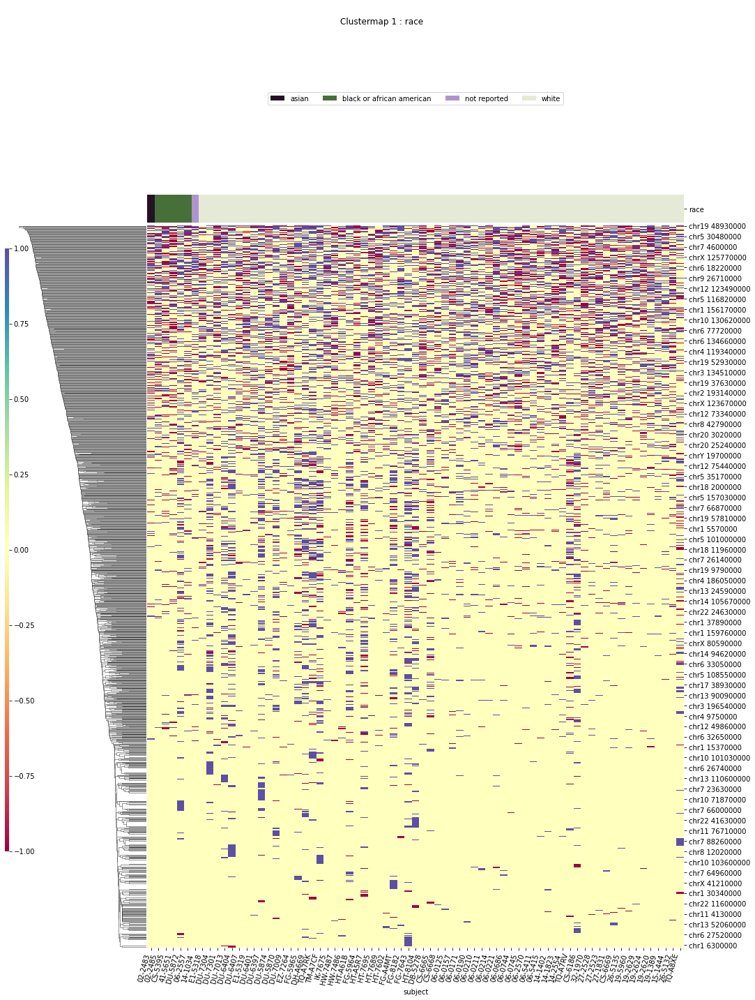

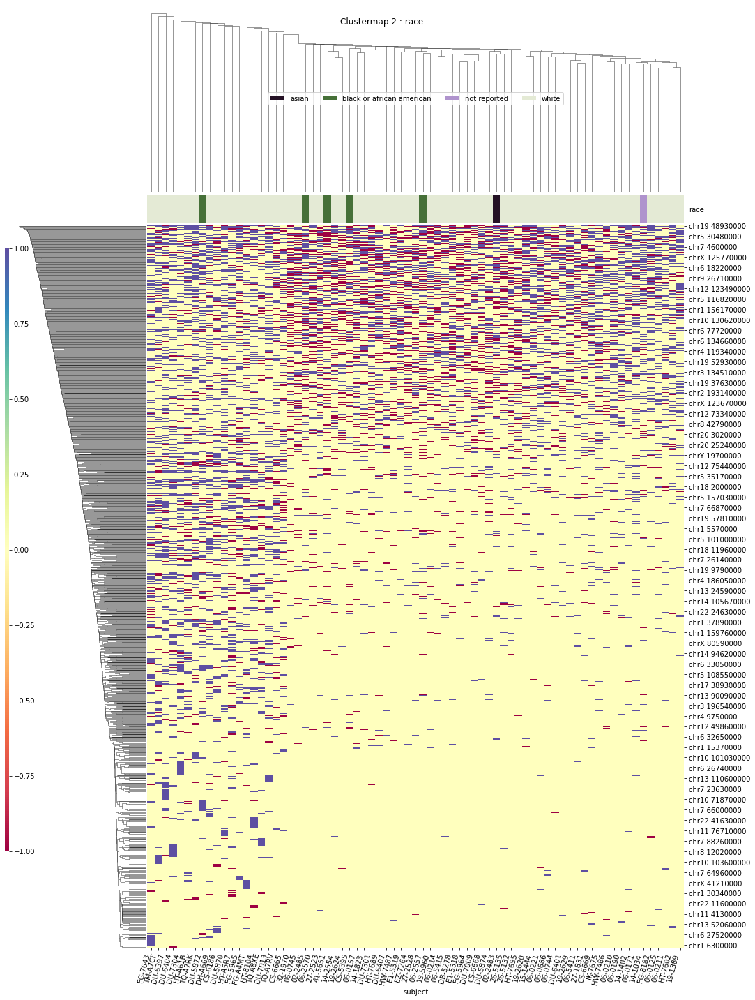

ethnicity
T-Testing
Boxplotting
Clustermapping
['chr1 10020000' 'chr1 104130000' 'chr1 10420000' ... 'chrY 7710000'
 'ethnicity' 'subject']


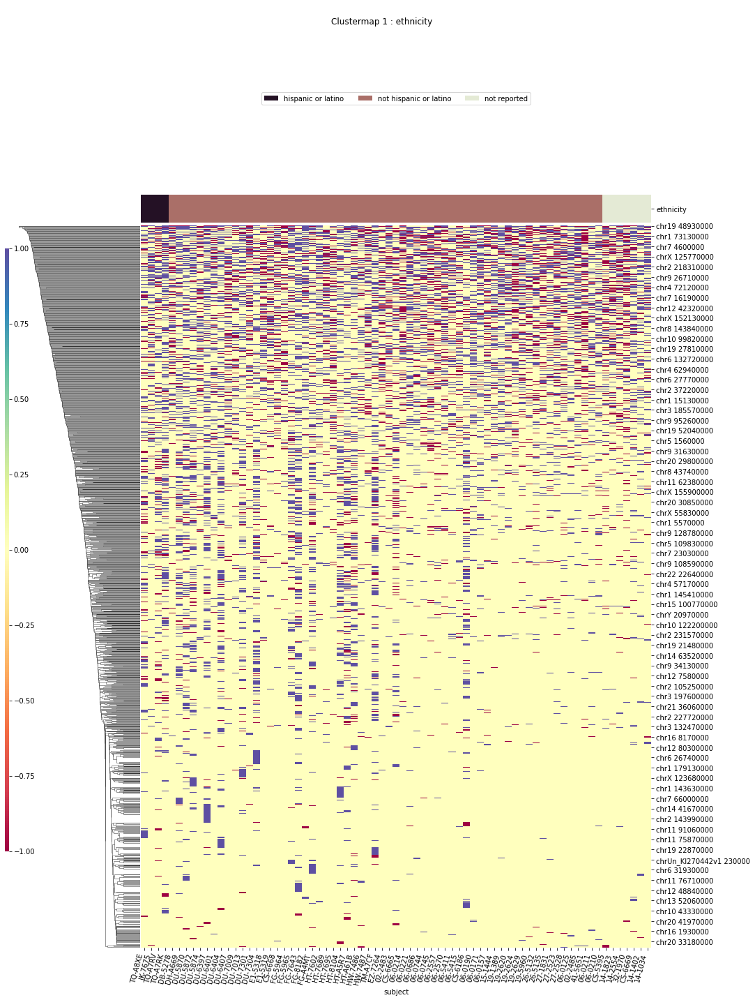

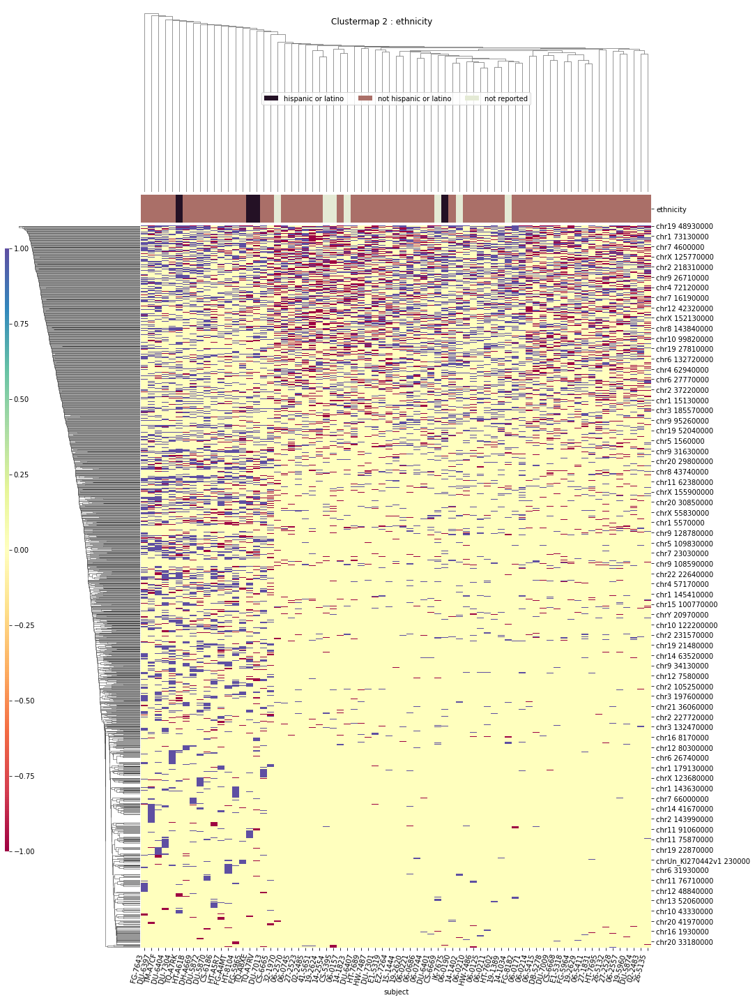

primary_diagnosis
T-Testing
Boxplotting
 p : 2.948014870353662e-15  ( t : 12.708265027138834 ) :  chr19 38360000


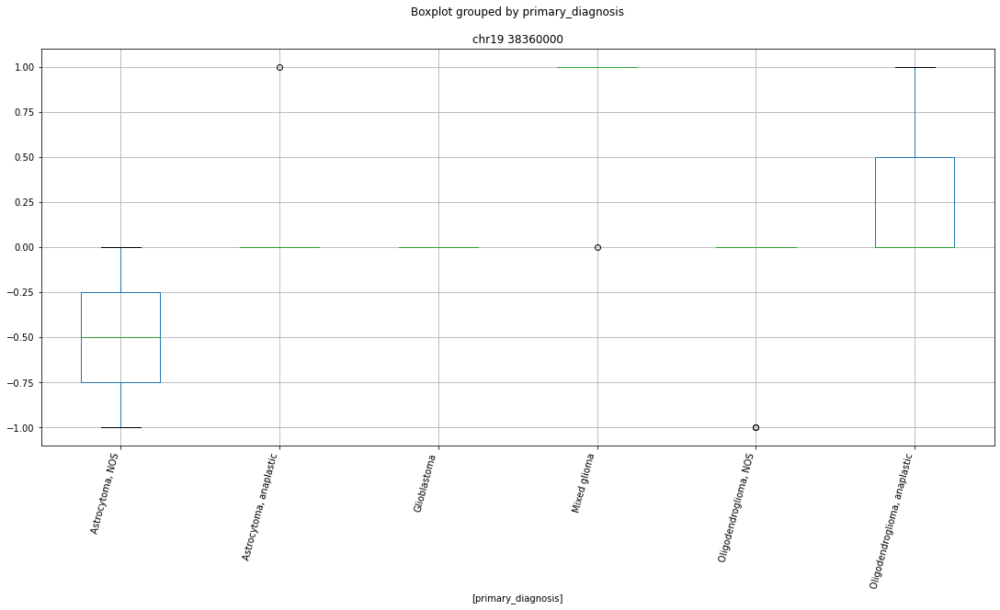

 p : 1.2735213637763784e-13  ( t : 11.358945418727963 ) :  chr20 30850000


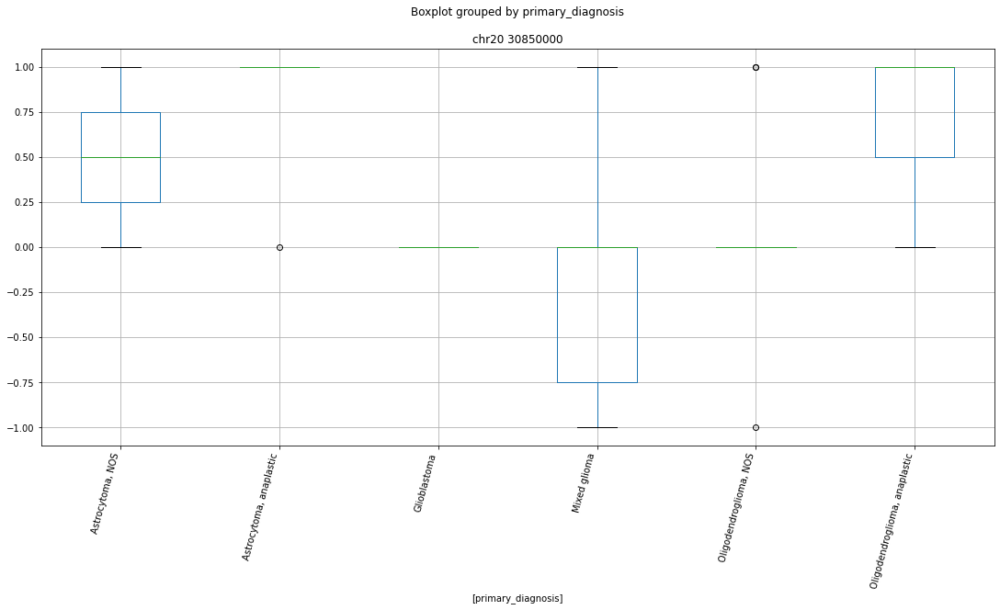

 p : 1.2735213637763784e-13  ( t : 11.358945418727963 ) :  chr1 148130000


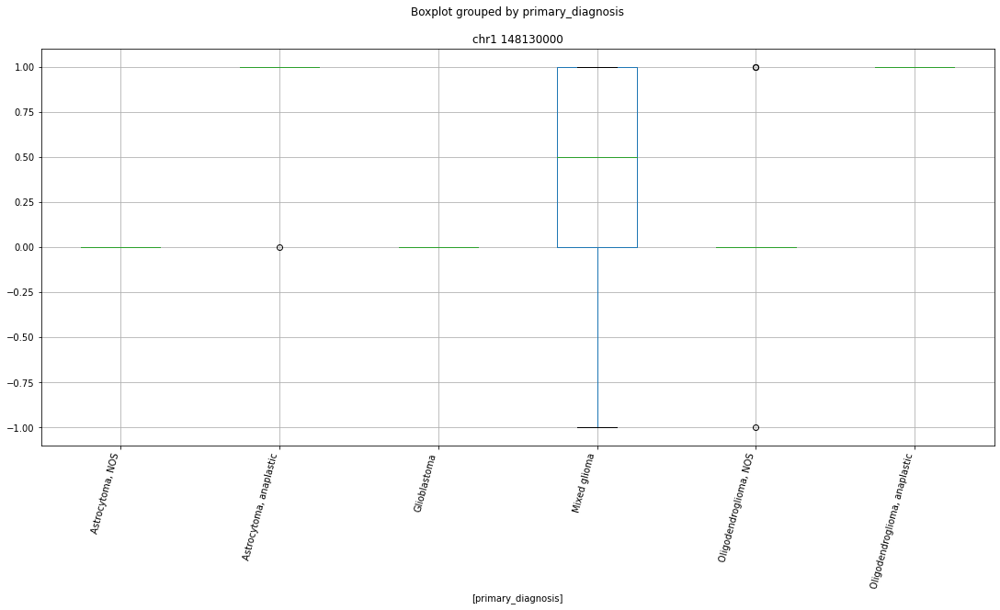

 p : 4.271448158247069e-12  ( t : 10.263721564032236 ) :  chr6 80630000


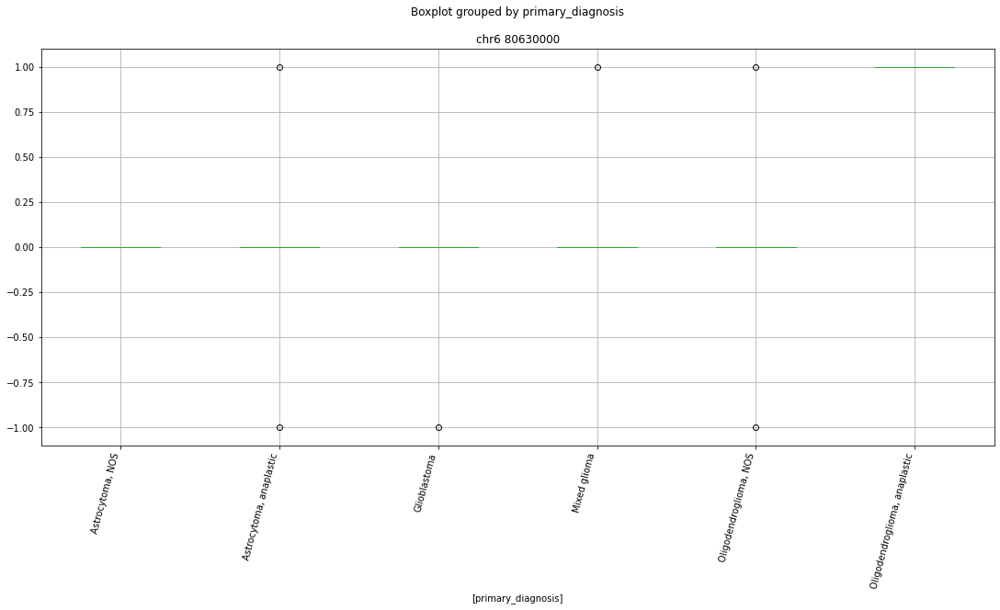

 p : 1.9864071913231304e-11  ( t : 9.677223188944682 ) :  chr15 100770000


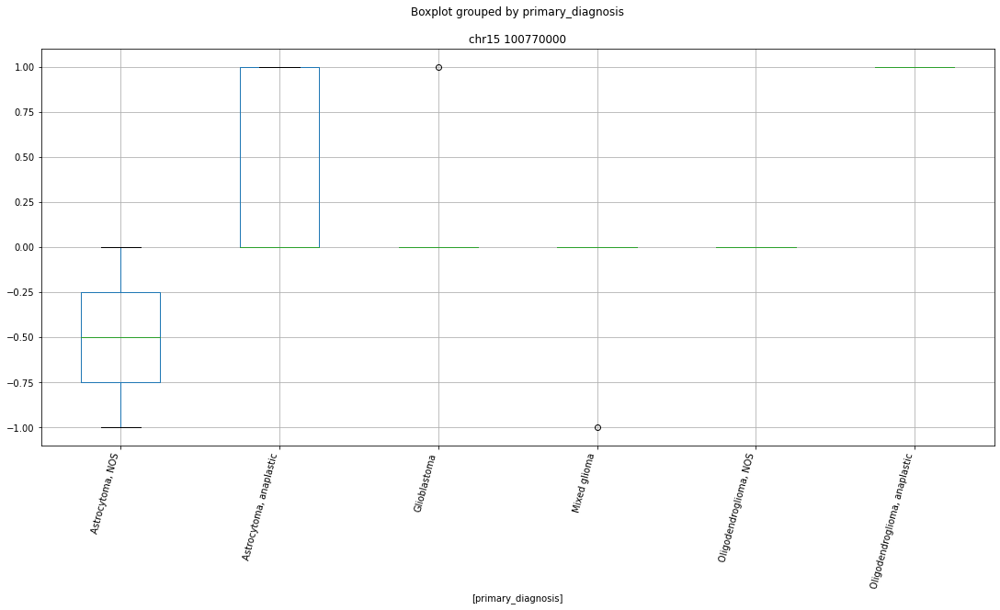

 p : 6.936790260584568e-11  ( t : 8.942327291667665 ) :  chr10 19510000


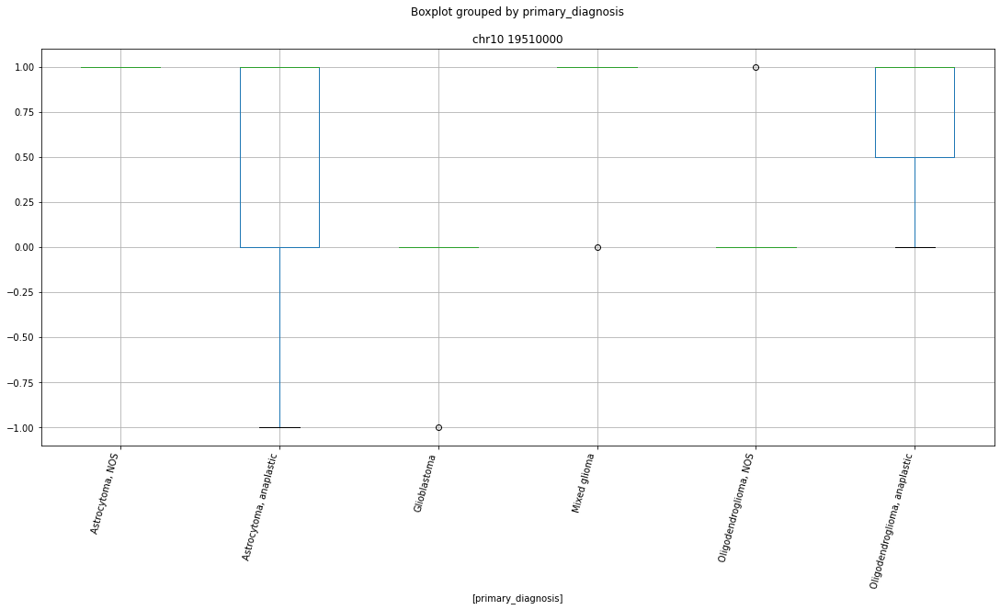

Clustermapping
['chr1 10020000' 'chr1 104130000' 'chr1 10420000' ... 'chrY 7710000'
 'primary_diagnosis' 'subject']


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


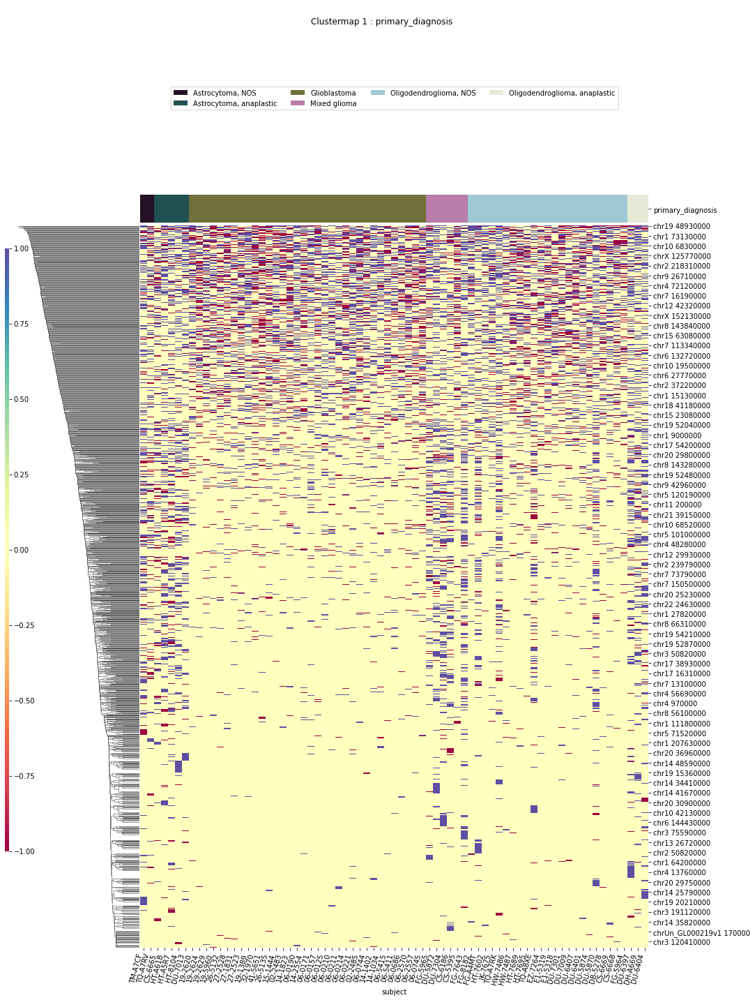

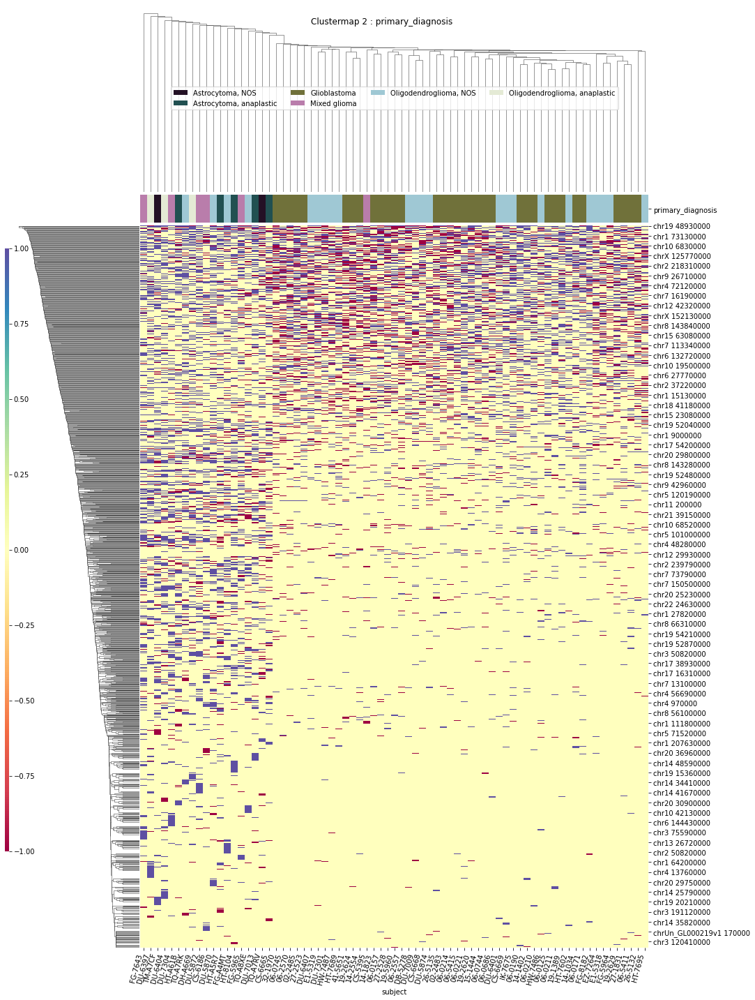

IDH
T-Testing
Boxplotting
Clustermapping
['IDH' 'chr1 10020000' 'chr1 104130000' ... 'chrY 7180000' 'chrY 7710000'
 'subject']


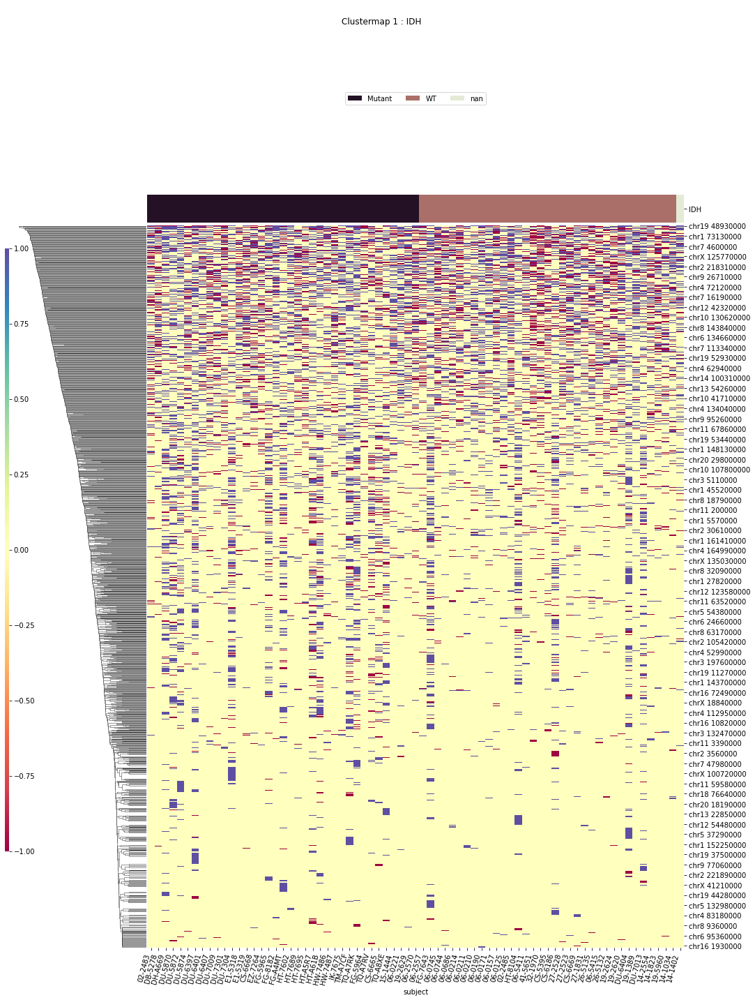

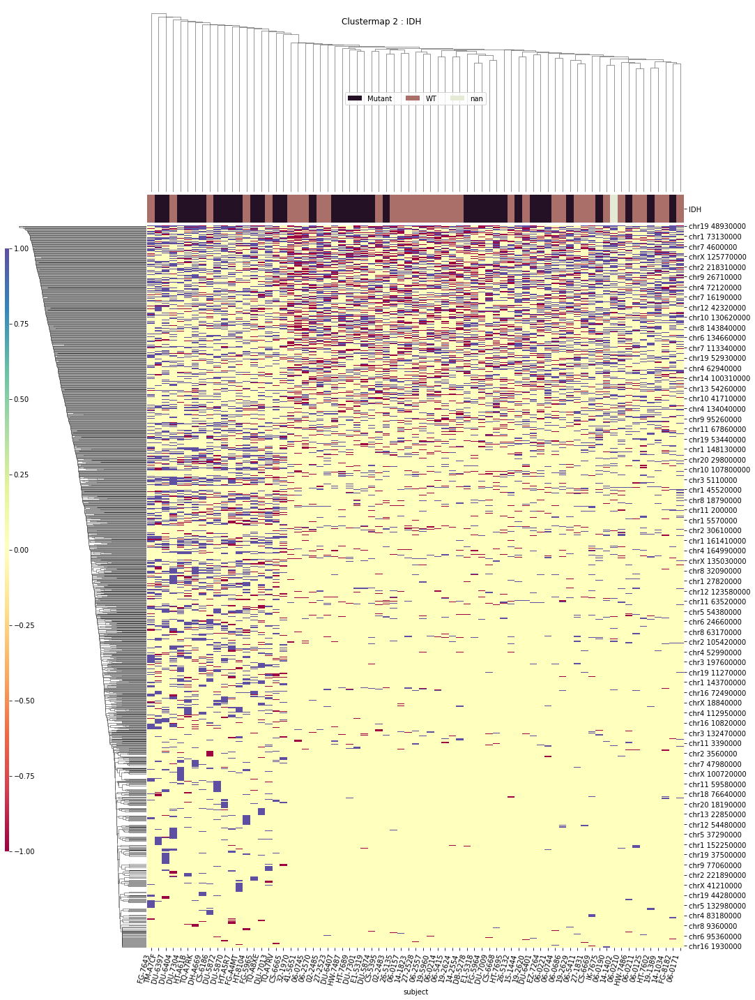

x1p19q
T-Testing
Boxplotting
Clustermapping
['chr1 10020000' 'chr1 104130000' 'chr1 10420000' ... 'chrY 7710000'
 'subject' 'x1p19q']


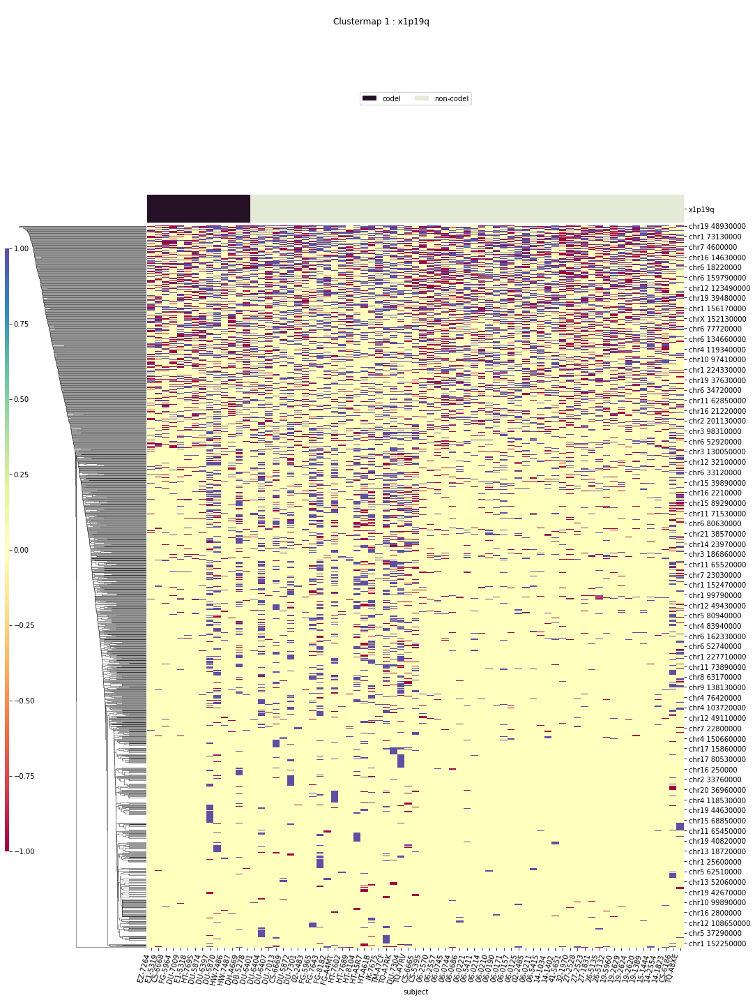

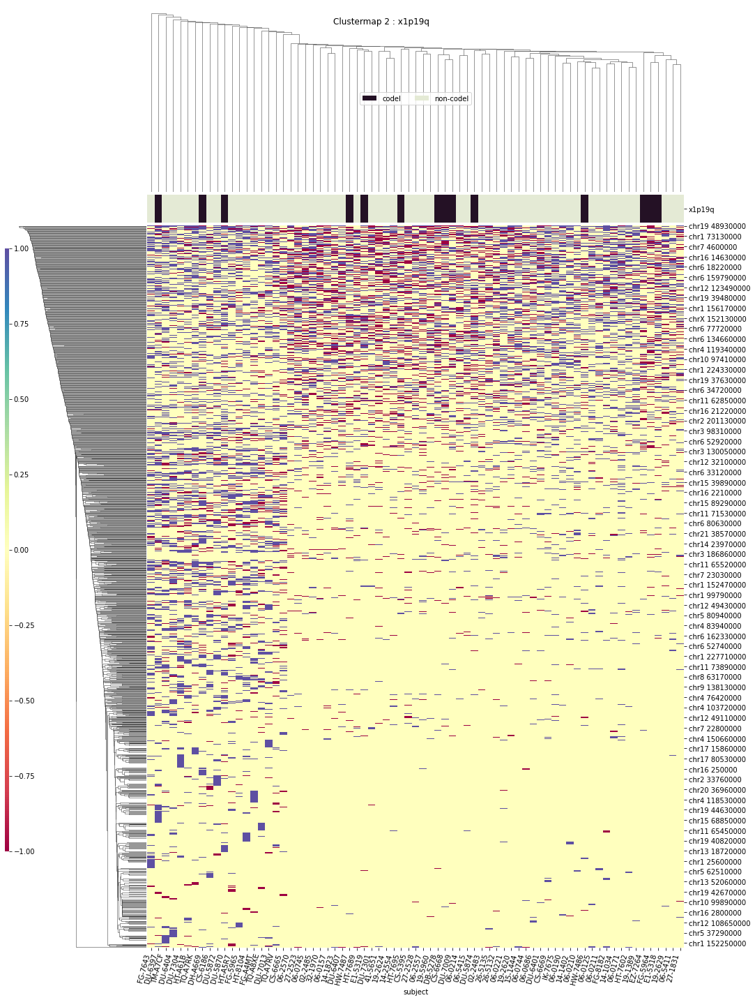

TERT
T-Testing
Boxplotting
Clustermapping
['TERT' 'chr1 10020000' 'chr1 104130000' ... 'chrY 7180000' 'chrY 7710000'
 'subject']


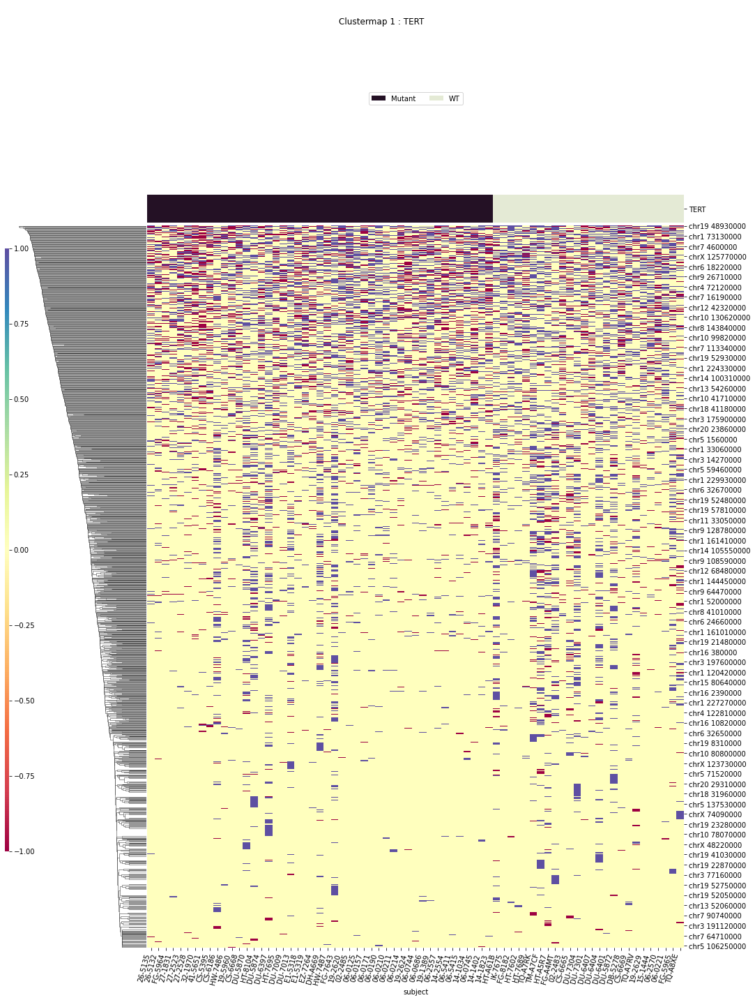

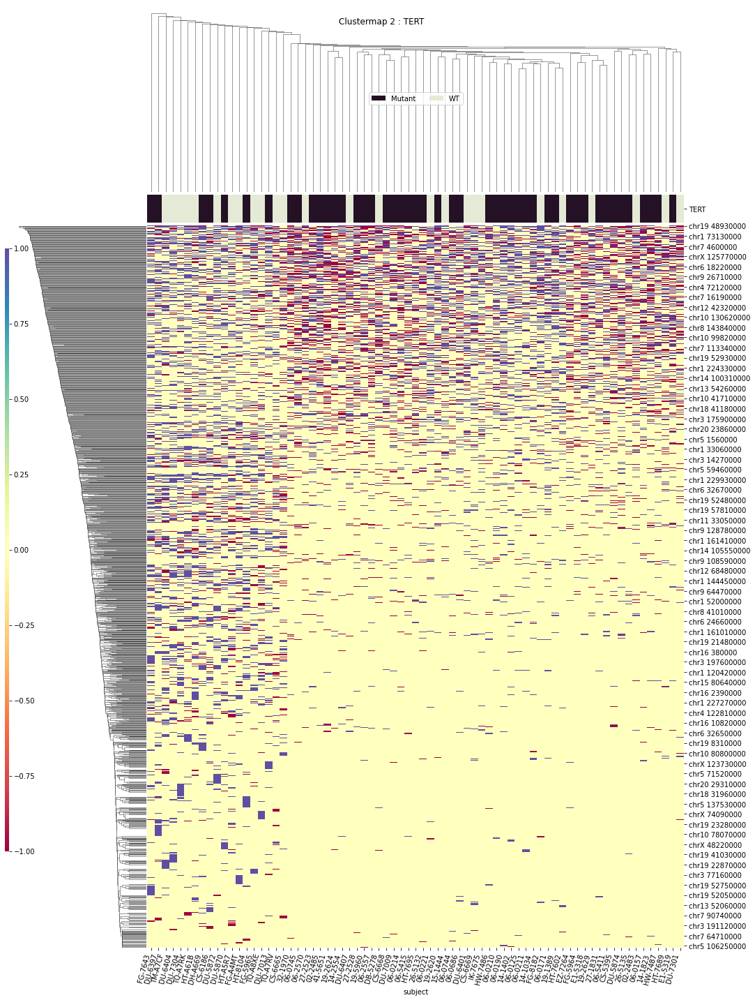

disease_type
T-Testing
Boxplotting
Clustermapping
['chr1 10020000' 'chr1 104130000' 'chr1 10420000' ... 'chrY 7710000'
 'disease_type' 'subject']


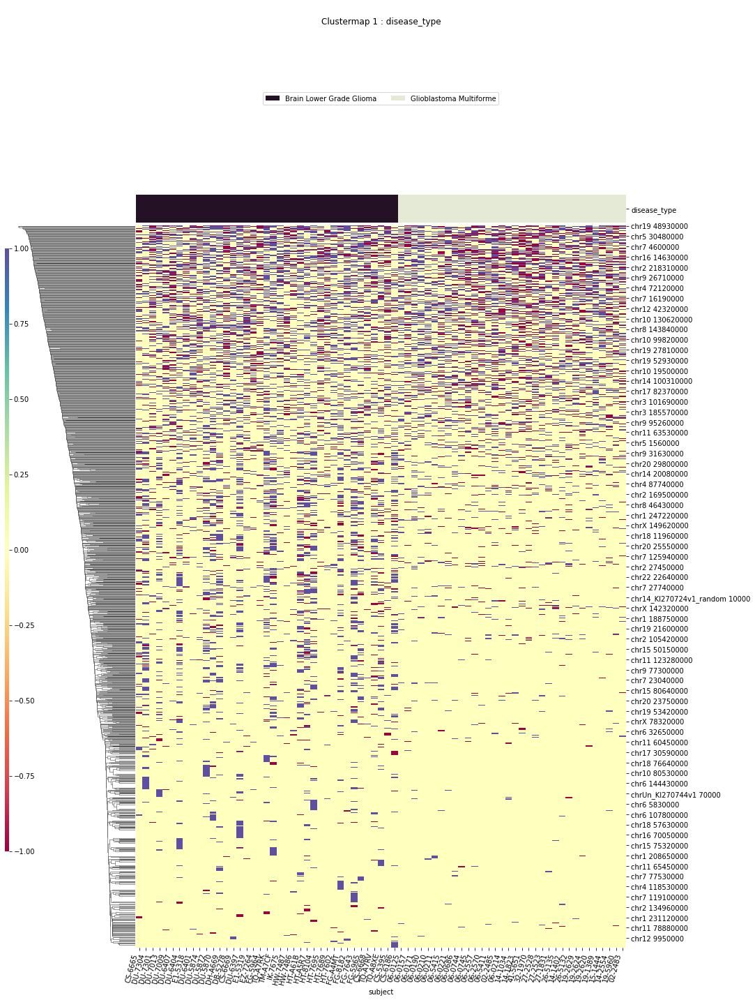

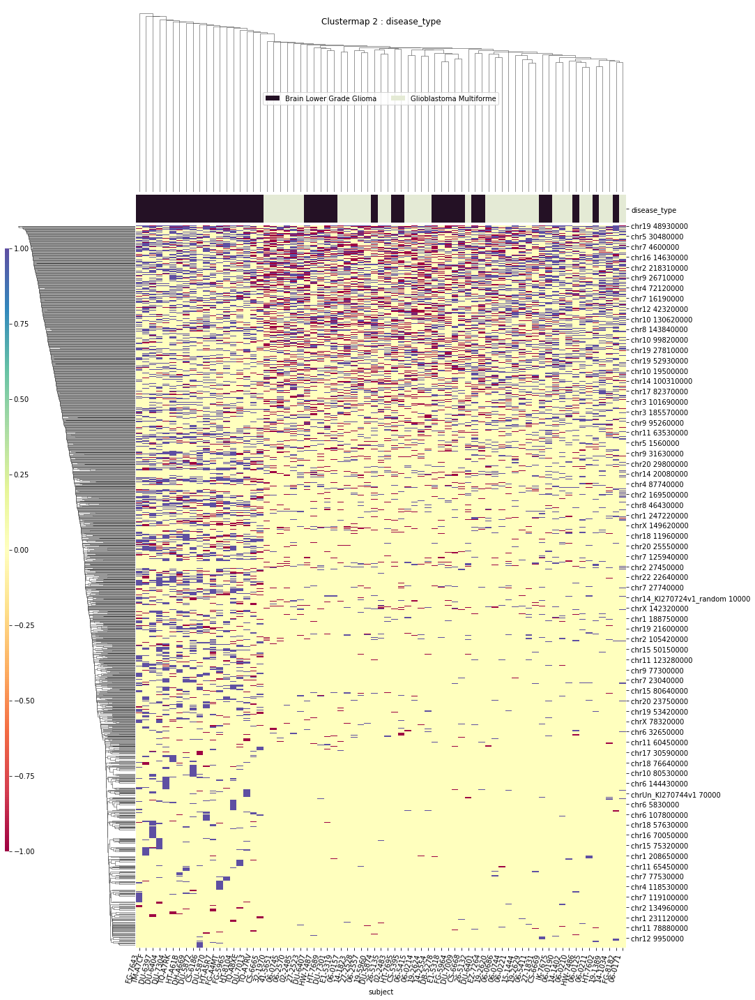

IDH_1p19q_status
T-Testing


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['IDH_1p19q_status' 'chr1 10020000' 'chr1 104130000' ... 'chrY 7180000'
 'chrY 7710000' 'subject']


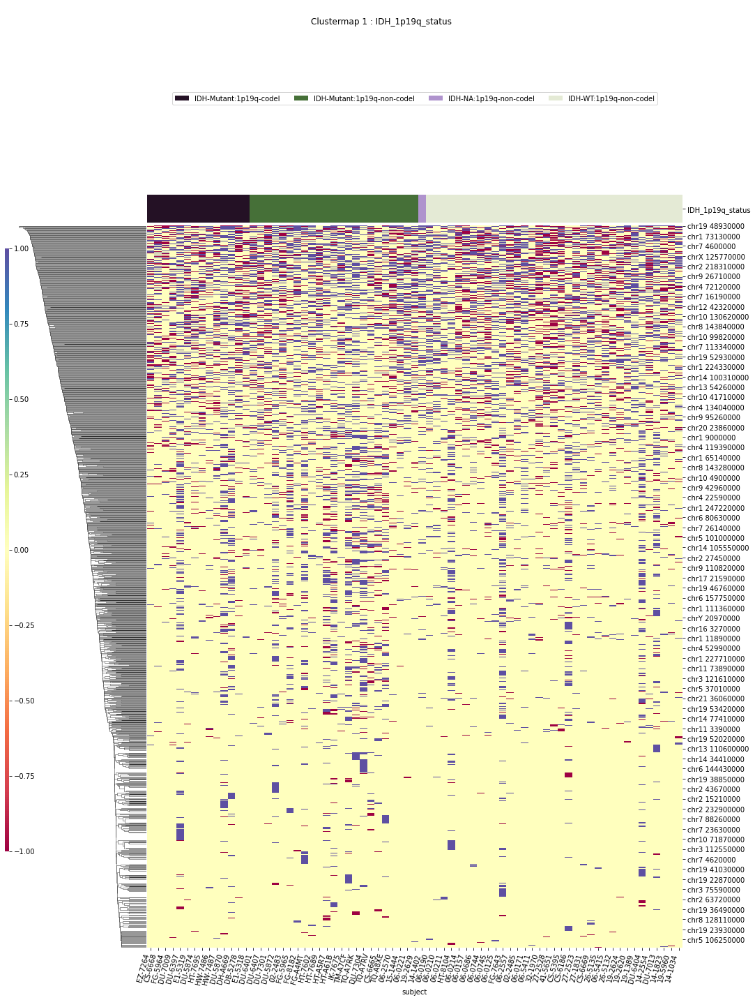

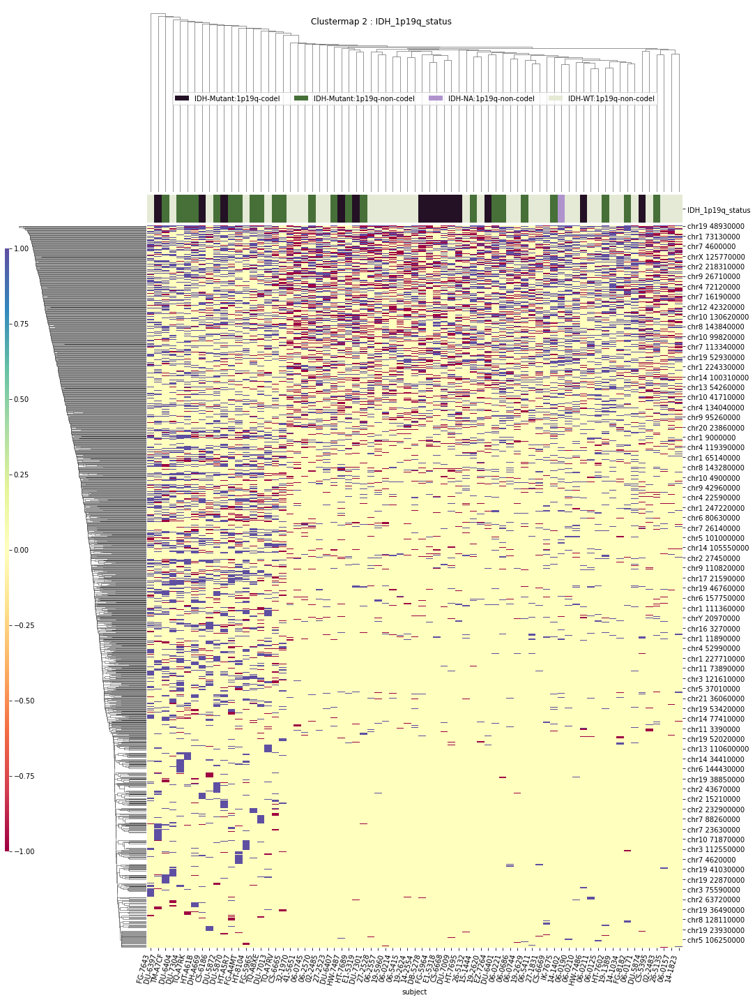

WHO_groups
T-Testing
Boxplotting
Clustermapping
['WHO_groups' 'chr1 10020000' 'chr1 104130000' ... 'chrY 7180000'
 'chrY 7710000' 'subject']


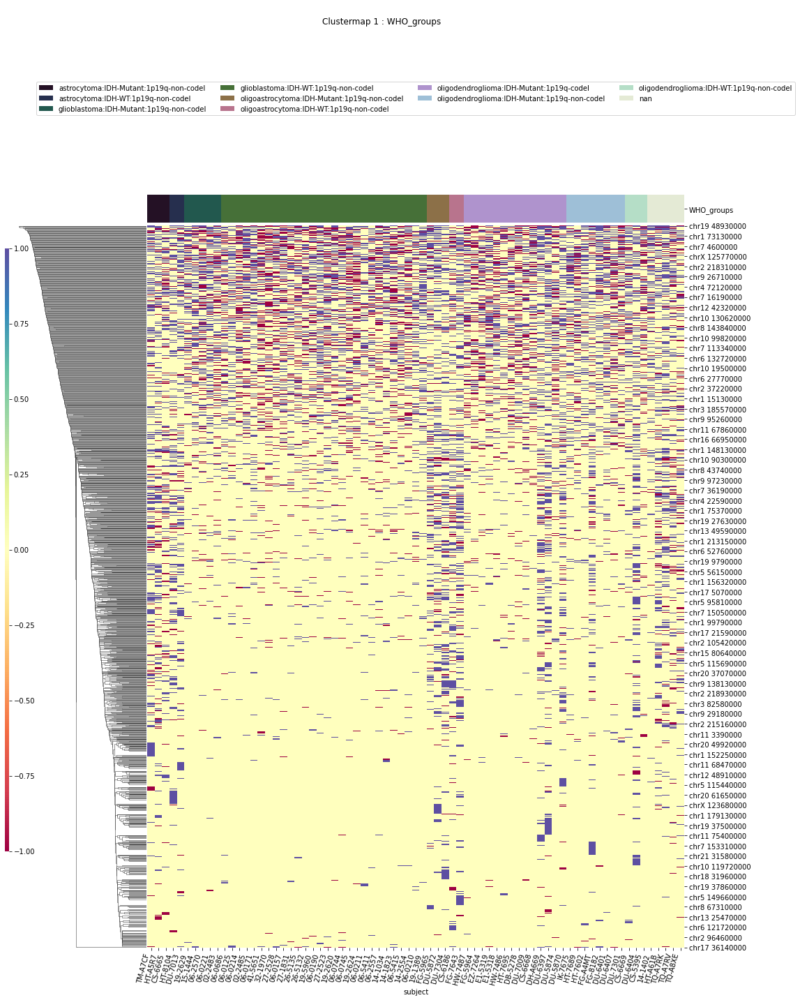

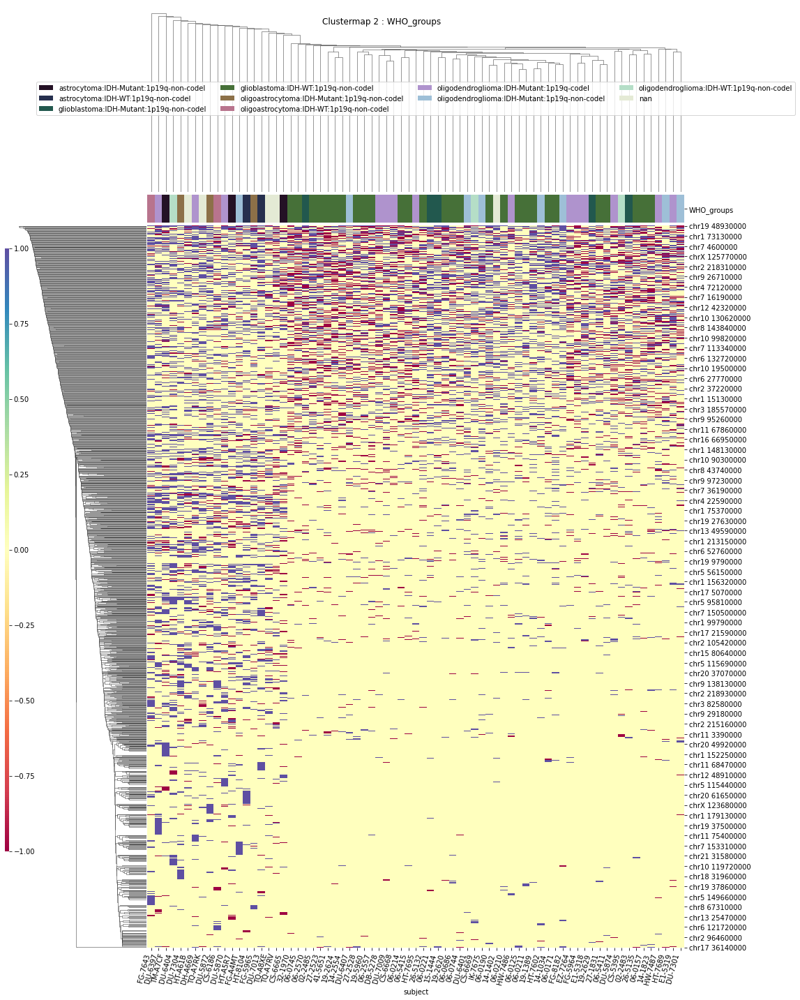

Triple_group
T-Testing
Boxplotting
Clustermapping
['Triple_group' 'chr1 10020000' 'chr1 104130000' ... 'chrY 7180000'
 'chrY 7710000' 'subject']


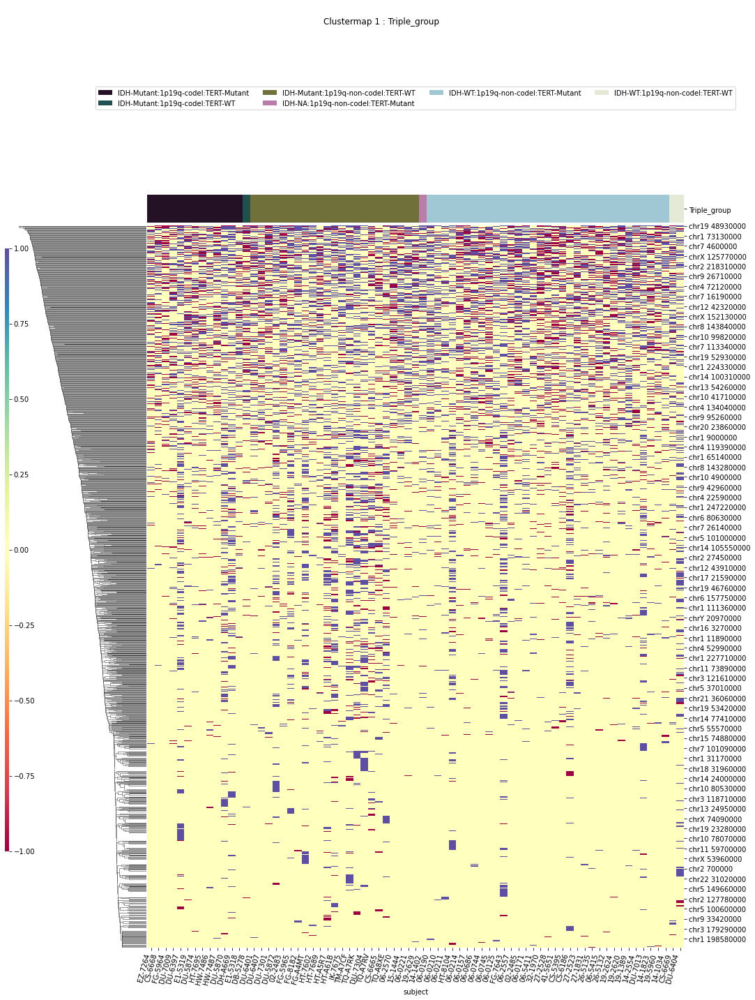

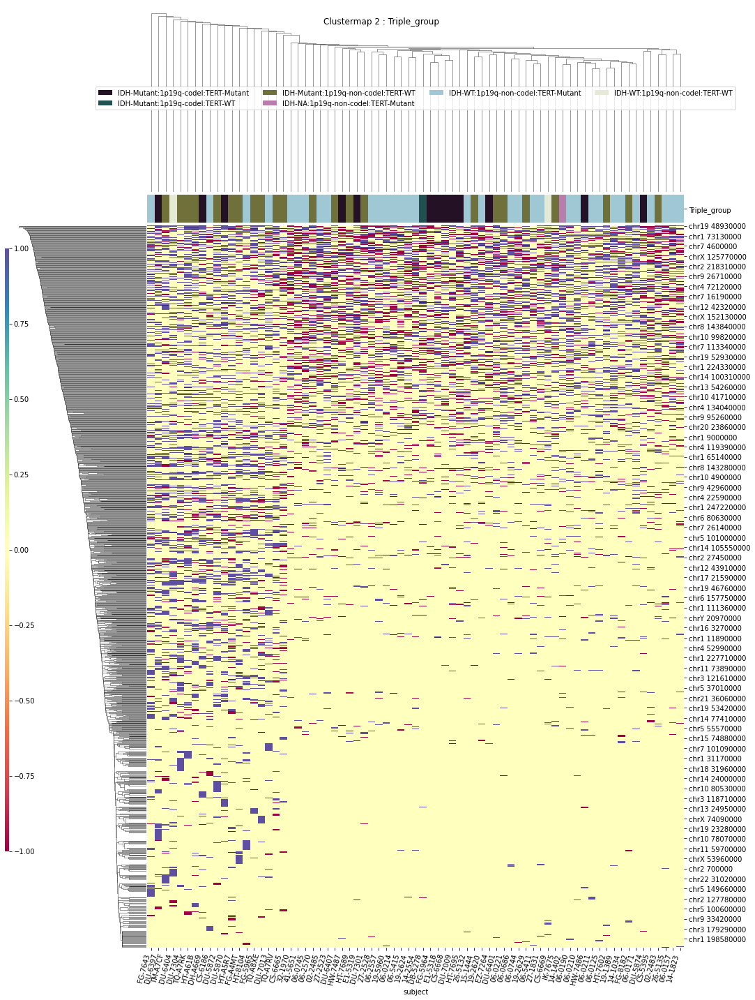

MGMT
T-Testing
Boxplotting
Clustermapping
['MGMT' 'chr1 10020000' 'chr1 104130000' ... 'chrY 7170000' 'chrY 7710000'
 'subject']


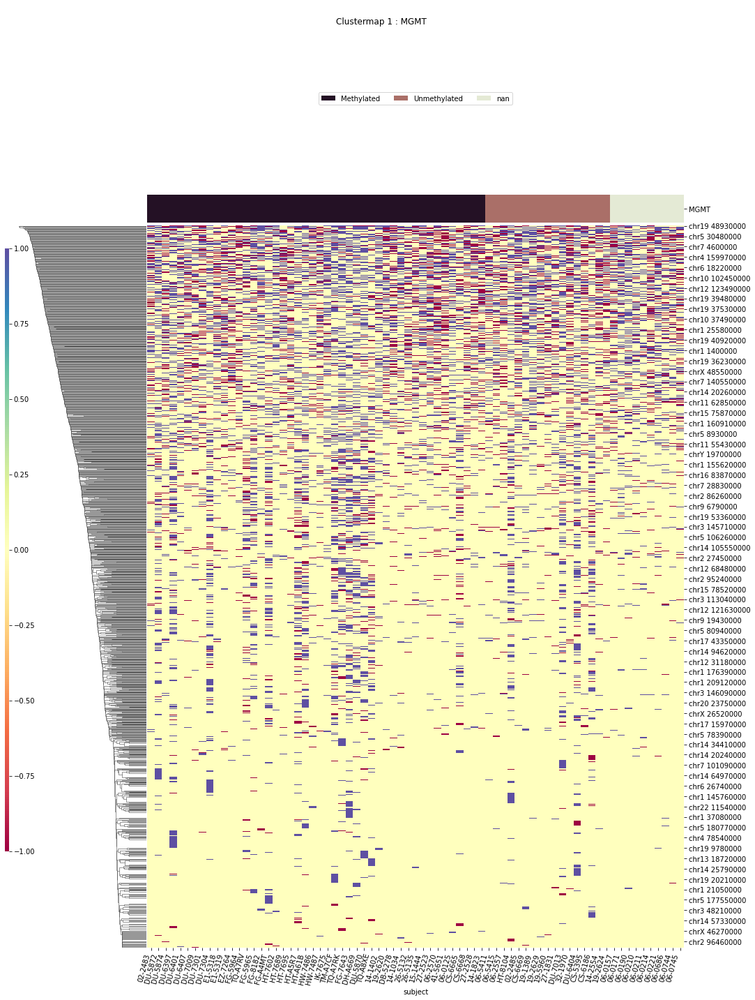

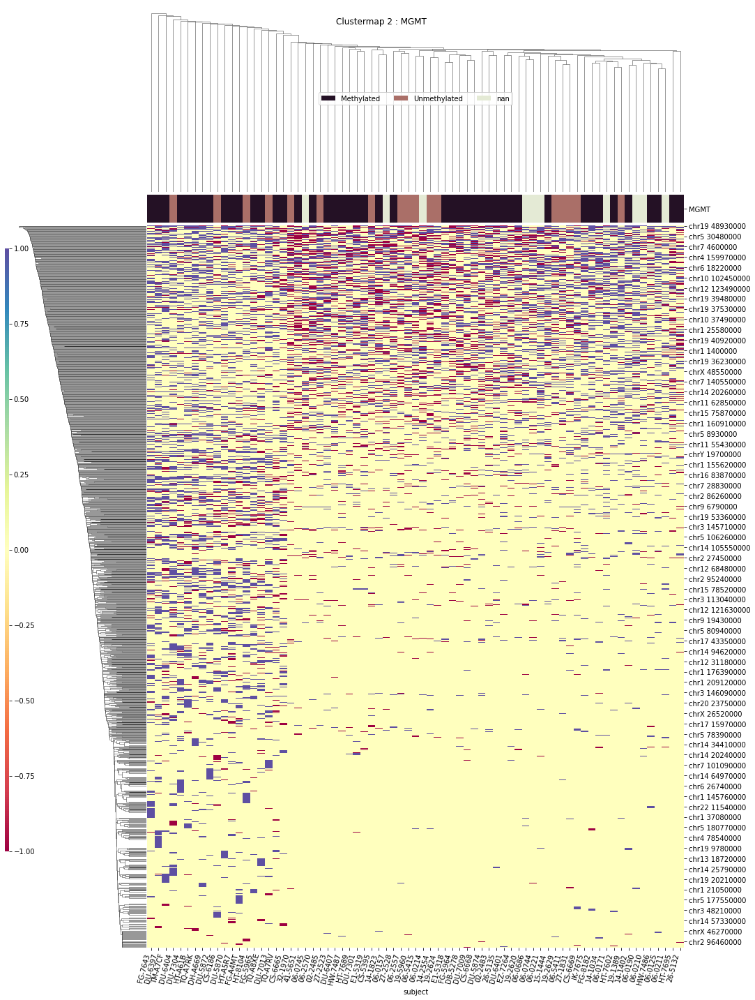

gender1
T-Testing
Boxplotting
Clustermapping
['chr1 10020000' 'chr1 104130000' 'chr1 10420000' ... 'chrY 7710000'
 'gender1' 'subject']


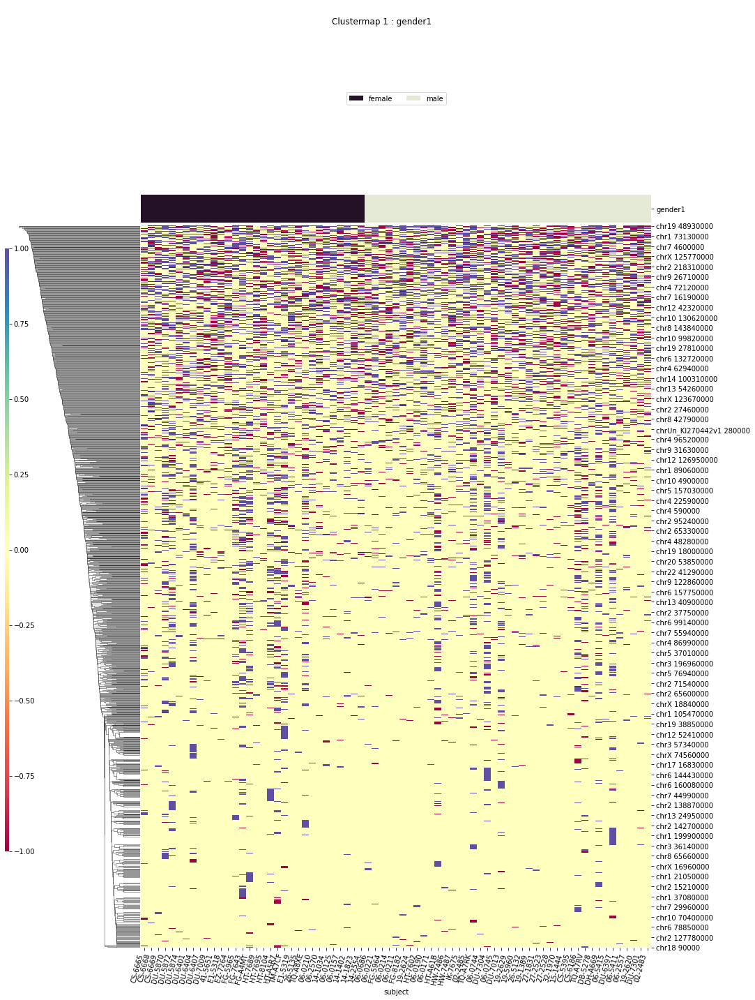

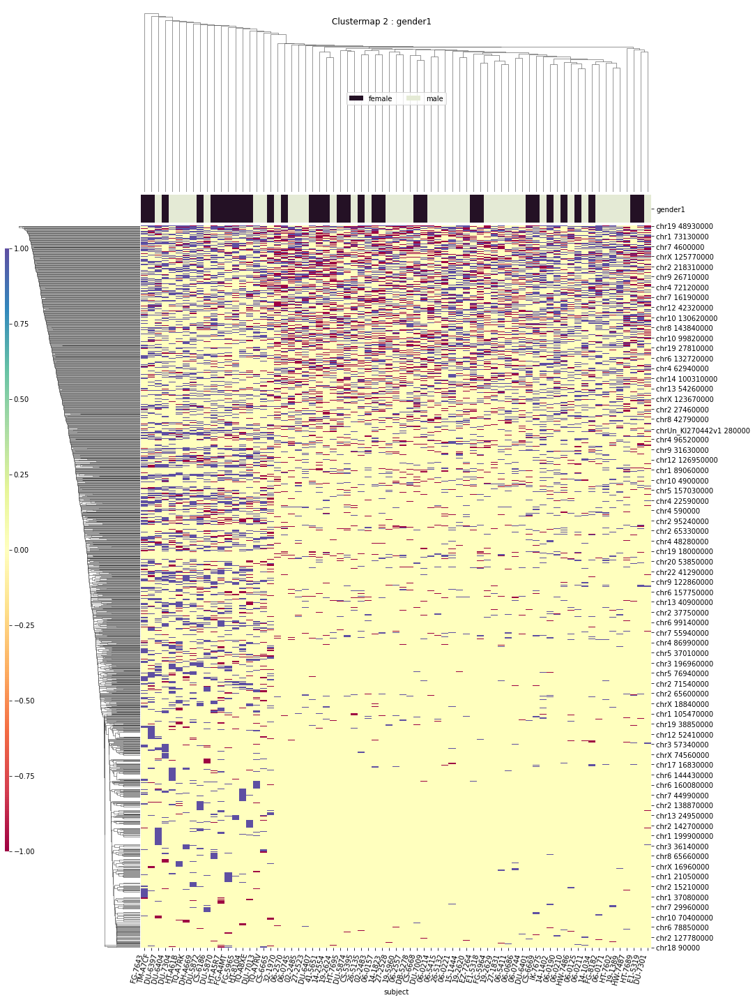

In [114]:
for column in 'race','ethnicity','primary_diagnosis','IDH','x1p19q','TERT','disease_type','IDH_1p19q_status','WHO_groups','Triple_group','MGMT','gender1':
    print(column)
    ttests_boxplots_and_heatmaps(compdf[compdf['hkle']==hkle],
        compdf.columns[compdf.columns.str.contains("^chr")],column,box_p=1e-10,heat_p=1)

In [115]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210525 20:57:44'

race
T-Testing
Boxplotting
Clustermapping
['chr1 104130000' 'chr1 105470000' 'chr1 11890000' 'chr1 145760000'
 'chr1 147730000' 'chr1 160910000' 'chr1 168830000' 'chr1 245770000'
 'chr1 65140000' 'chr1 75370000' 'chr1 77980000' 'chr1 86890000'
 'chr10 101030000' 'chr10 19500000' 'chr10 65400000' 'chr10 6830000'
 'chr10 80530000' 'chr11 24440000' 'chr11 33040000' 'chr11 59580000'
 'chr11 61650000' 'chr11 67750000' 'chr12 10390000' 'chr12 10570000'
 'chr12 123490000' 'chr12 123580000' 'chr12 34610000' 'chr12 43910000'
 'chr12 4720000' 'chr12 48720000' 'chr12 49110000' 'chr12 51450000'
 'chr12 58330000' 'chr12 58540000' 'chr12 93070000' 'chr13 69610000'
 'chr13 90090000' 'chr14 106440000' 'chr14 41670000' 'chr14 64970000'
 'chr14 77630000' 'chr14 77790000' 'chr14_KI270724v1_random 10000'
 'chr15 23080000' 'chr15 65220000' 'chr16 250000' 'chr17 80550000'
 'chr19 23720000' 'chr19 37000000' 'chr19 37530000' 'chr19 37620000'
 'chr19 380000' 'chr19 39480000' 'chr19 51920000' 'chr19 52050000'
 

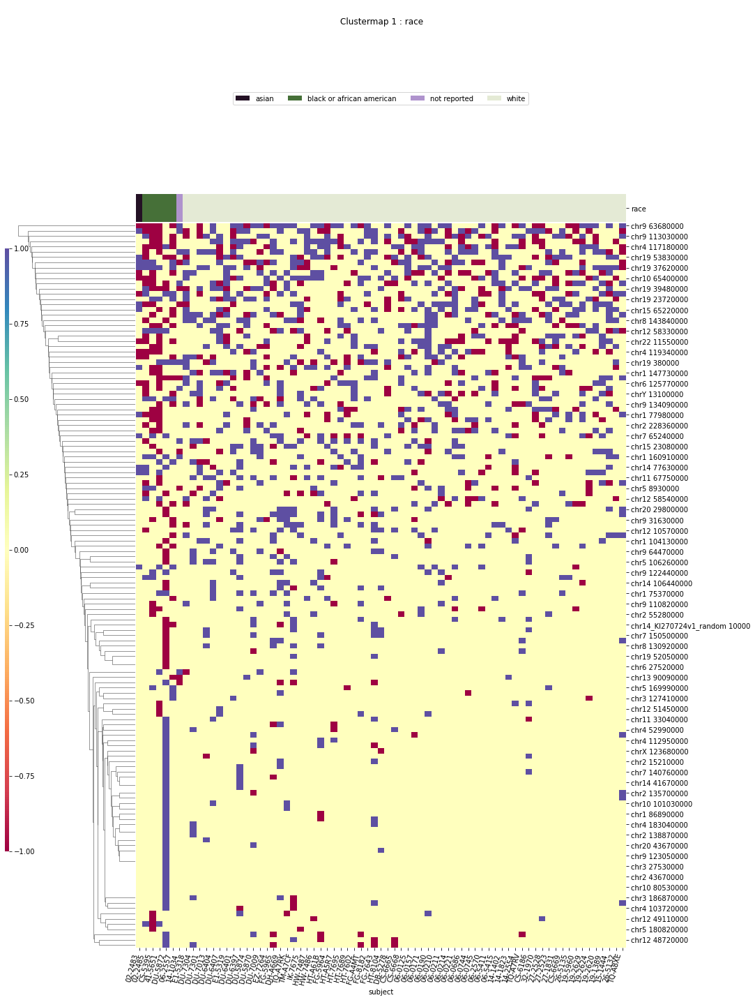

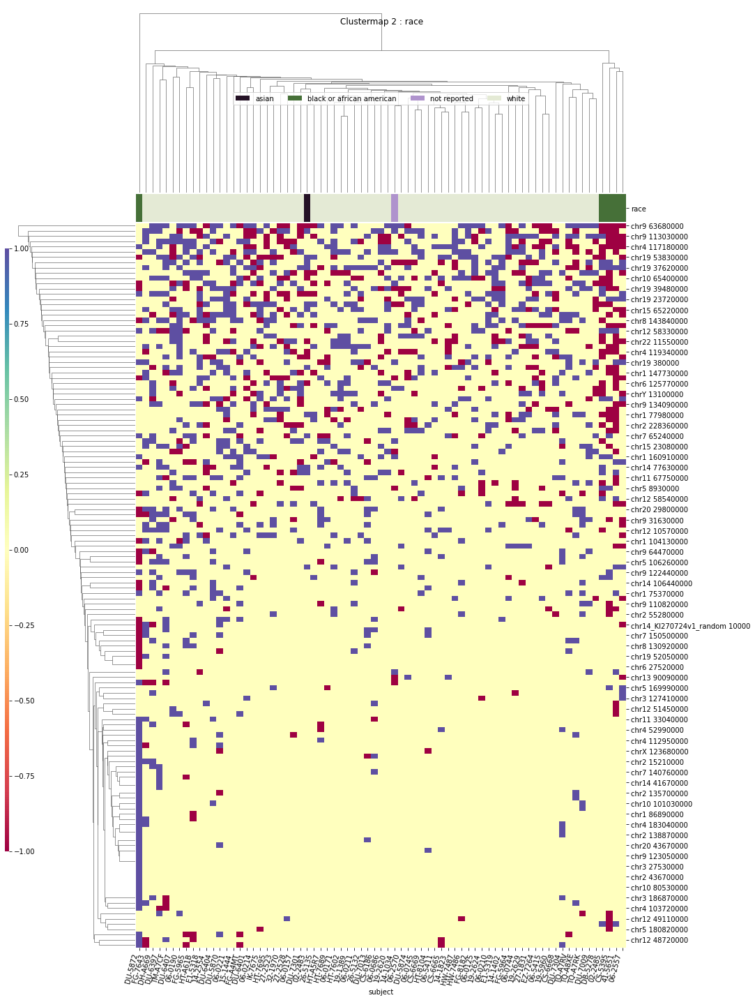

ethnicity
T-Testing
Boxplotting
Clustermapping
['chr1 10020000' 'chr1 10420000' 'chr1 105470000' 'chr1 108530000'
 'chr1 109170000' 'chr1 109760000' 'chr1 111360000' 'chr1 114790000'
 'chr1 13350000' 'chr1 13360000' 'chr1 144450000' 'chr1 147240000'
 'chr1 151870000' 'chr1 153580000' 'chr1 161310000' 'chr1 179130000'
 'chr1 213150000' 'chr1 224330000' 'chr1 227130000' 'chr1 227600000'
 'chr1 227860000' 'chr1 229930000' 'chr1 234010000' 'chr1 245770000'
 'chr1 247010000' 'chr1 247580000' 'chr1 27820000' 'chr1 29350000'
 'chr1 30340000' 'chr1 31170000' 'chr1 37890000' 'chr1 39230000'
 'chr1 40000000' 'chr1 40470000' 'chr1 45520000' 'chr1 46780000'
 'chr1 65130000' 'chr1 65140000' 'chr1 66590000' 'chr1 73120000'
 'chr1 75370000' 'chr1 75380000' 'chr1 77980000' 'chr1 99790000'
 'chr10 101030000' 'chr10 107800000' 'chr10 122200000' 'chr10 125940000'
 'chr10 130620000' 'chr10 19510000' 'chr10 2800000' 'chr10 41710000'
 'chr10 42130000' 'chr10 43330000' 'chr10 45330000' 'chr10 45390000'
 'chr

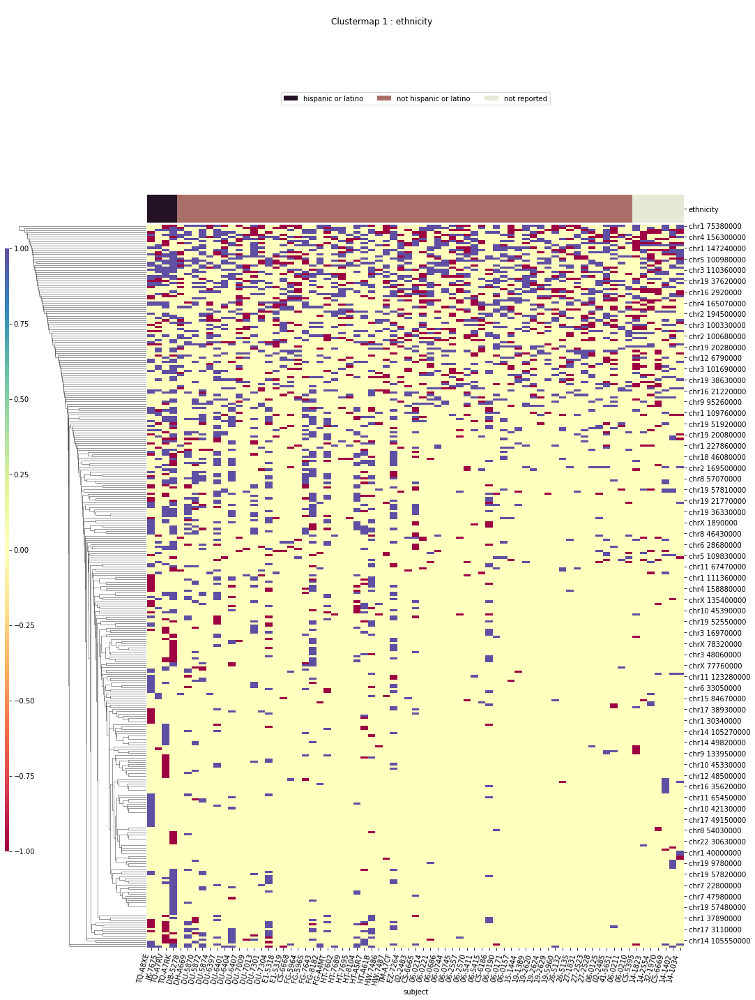

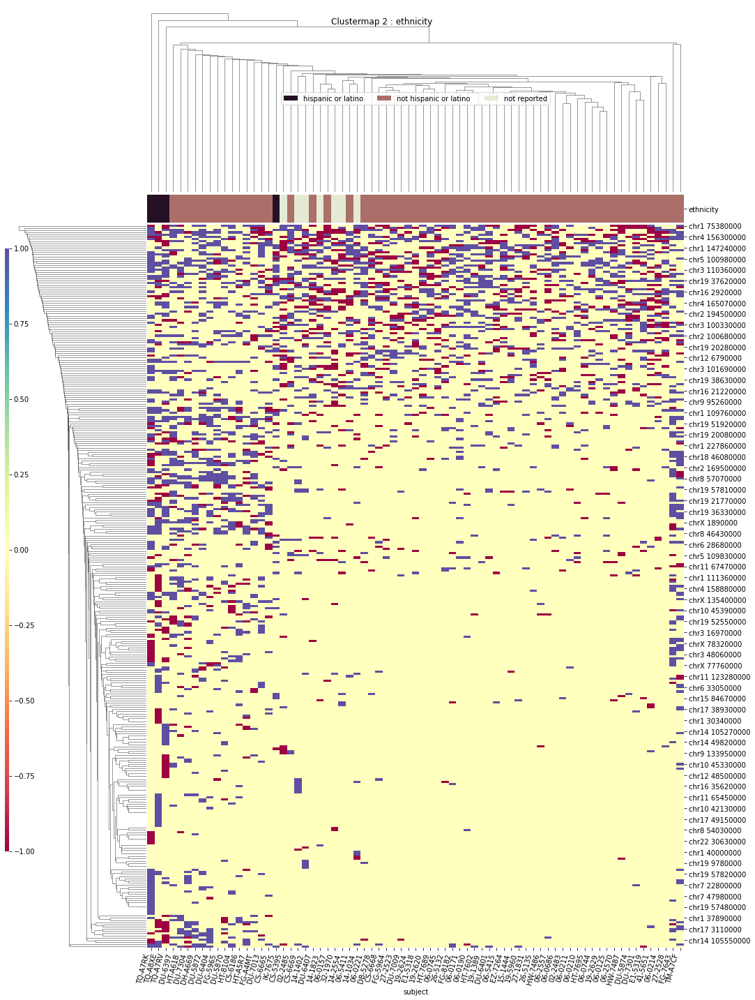

primary_diagnosis
T-Testing
Boxplotting
 p : 2.948014870353662e-15  ( t : 12.708265027138834 ) :  chr19 38360000


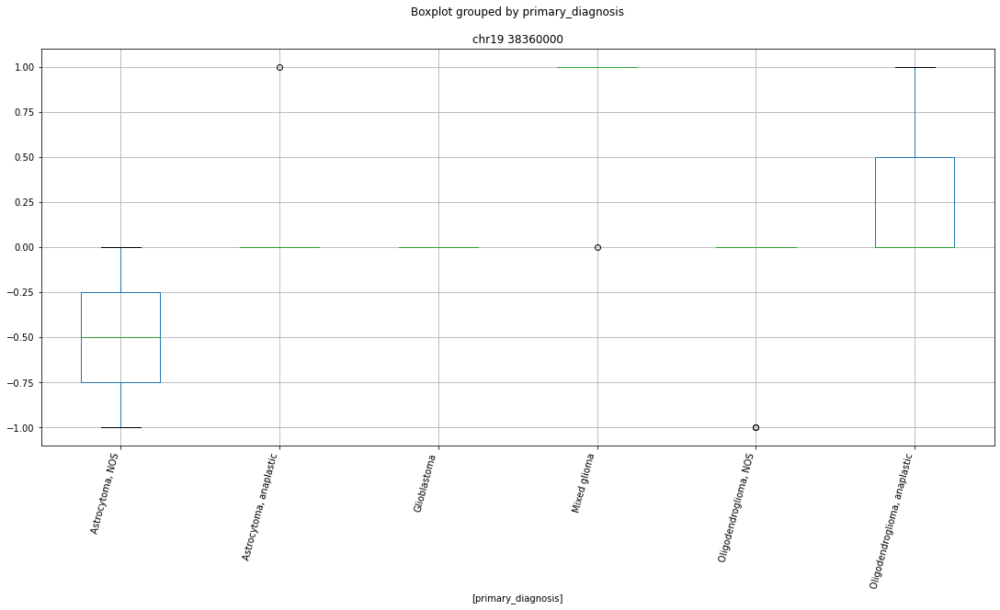

 p : 1.2735213637763784e-13  ( t : 11.358945418727963 ) :  chr20 30850000


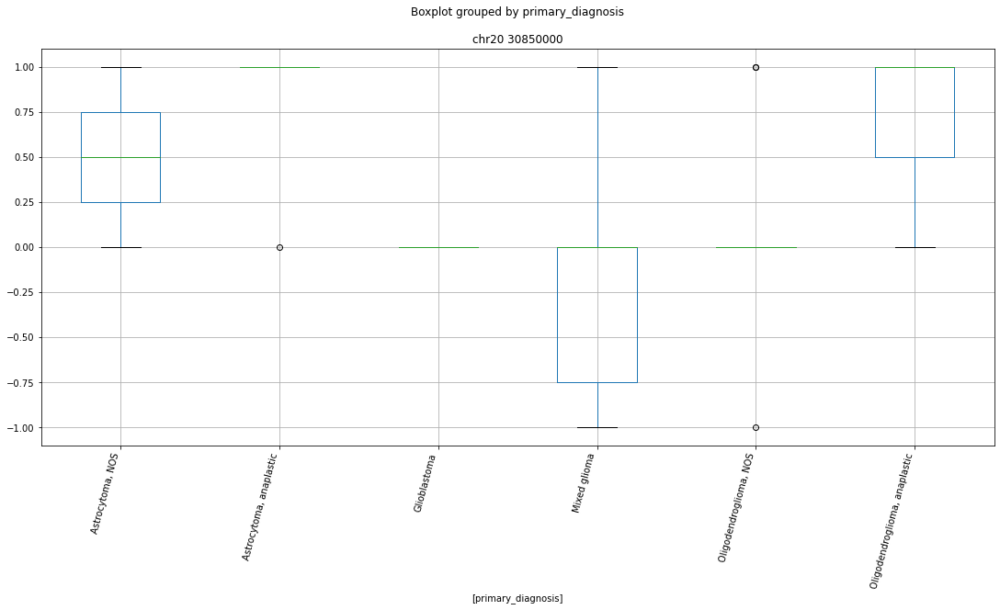

 p : 1.2735213637763784e-13  ( t : 11.358945418727963 ) :  chr1 148130000


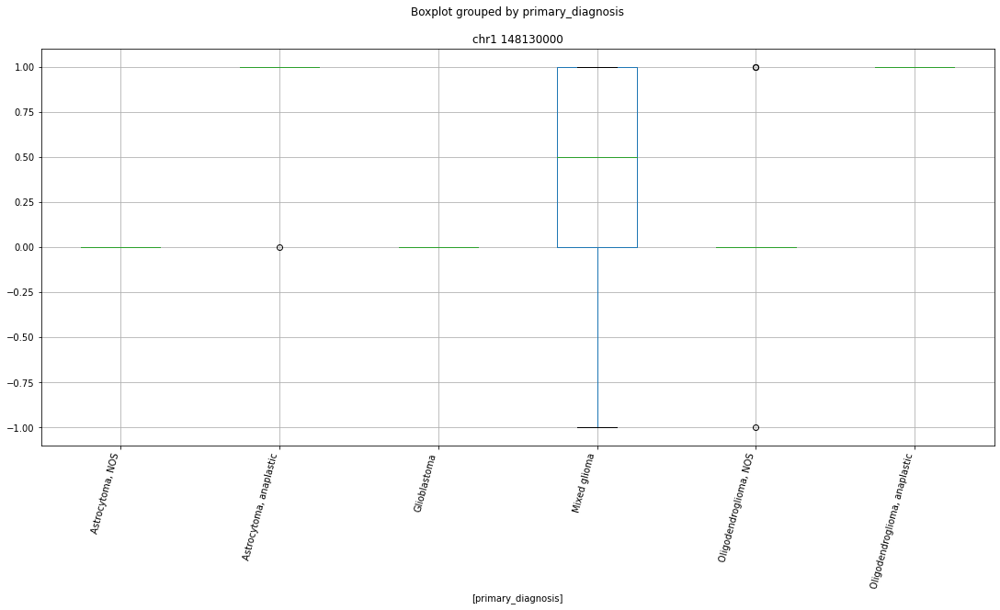

 p : 4.271448158247069e-12  ( t : 10.263721564032236 ) :  chr6 80630000


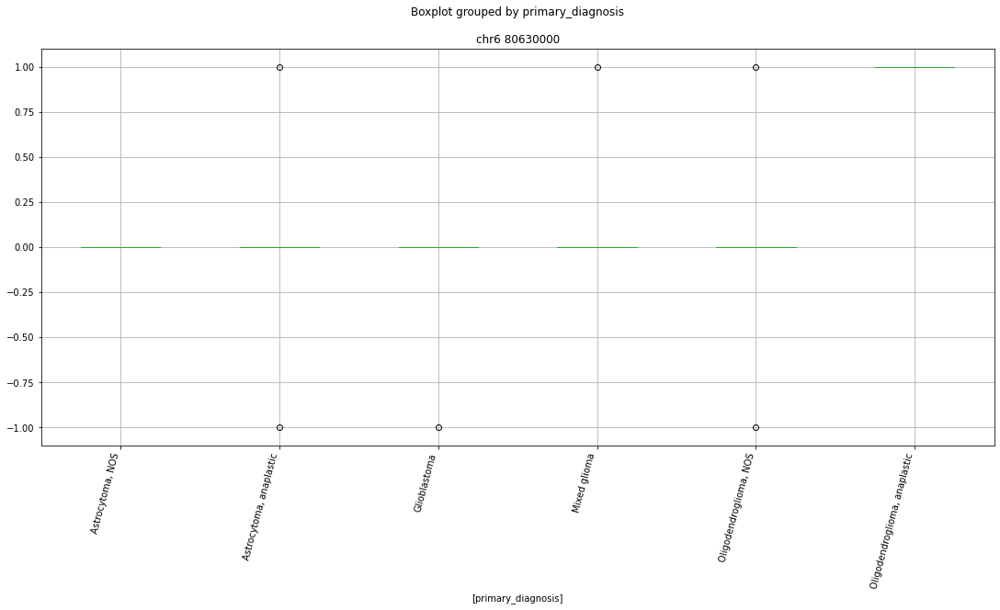

 p : 1.9864071913231304e-11  ( t : 9.677223188944682 ) :  chr15 100770000


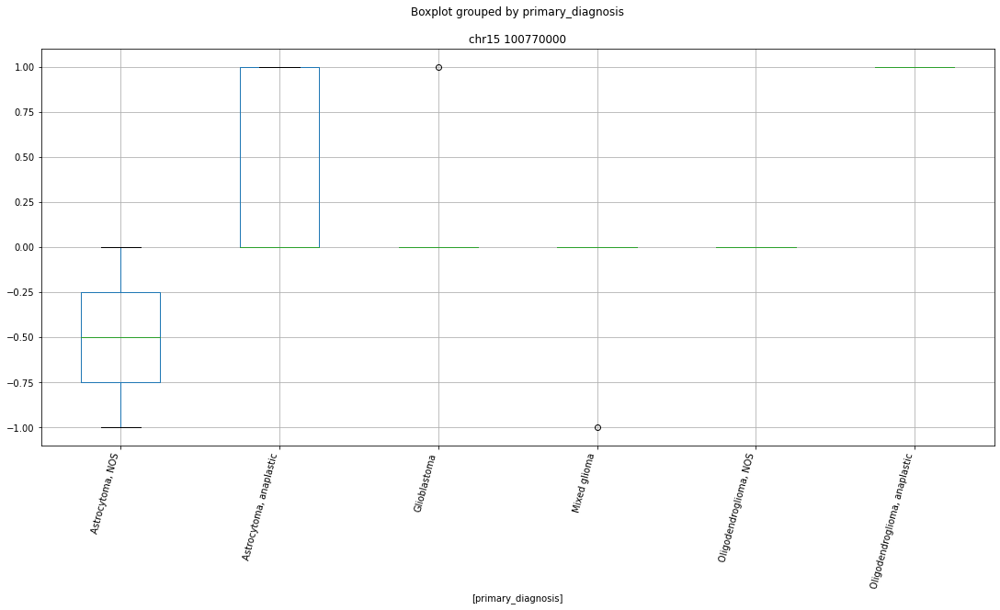

 p : 6.936790260584568e-11  ( t : 8.942327291667665 ) :  chr10 19510000


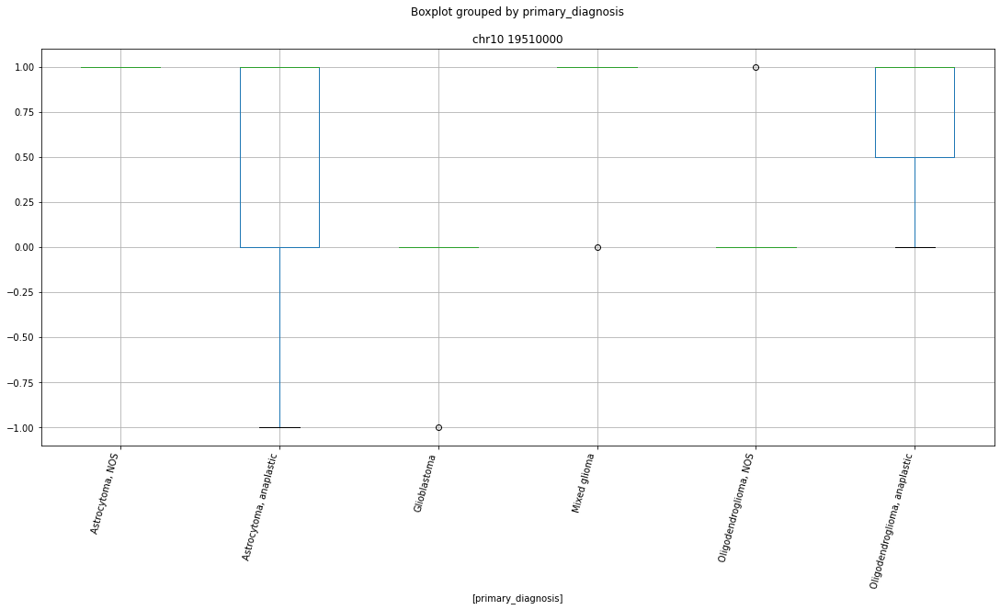

Clustermapping
['chr1 10020000' 'chr1 105470000' 'chr1 108150000' 'chr1 109170000'
 'chr1 111250000' 'chr1 111360000' 'chr1 111520000' 'chr1 111800000'
 'chr1 114790000' 'chr1 11890000' 'chr1 120420000' 'chr1 13360000'
 'chr1 1400000' 'chr1 1410000' 'chr1 143630000' 'chr1 143700000'
 'chr1 144450000' 'chr1 145410000' 'chr1 145760000' 'chr1 146940000'
 'chr1 148130000' 'chr1 149090000' 'chr1 150630000' 'chr1 151870000'
 'chr1 152250000' 'chr1 152450000' 'chr1 152470000' 'chr1 153580000'
 'chr1 154280000' 'chr1 155620000' 'chr1 156170000' 'chr1 156320000'
 'chr1 160650000' 'chr1 160930000' 'chr1 160940000' 'chr1 161010000'
 'chr1 161410000' 'chr1 161430000' 'chr1 166600000' 'chr1 168830000'
 'chr1 176390000' 'chr1 179130000' 'chr1 188750000' 'chr1 197400000'
 'chr1 198120000' 'chr1 199900000' 'chr1 202190000' 'chr1 207630000'
 'chr1 208650000' 'chr1 209120000' 'chr1 209140000' 'chr1 21050000'
 'chr1 211220000' 'chr1 213150000' 'chr1 224330000' 'chr1 224340000'
 'chr1 225960000' 'chr1 227

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


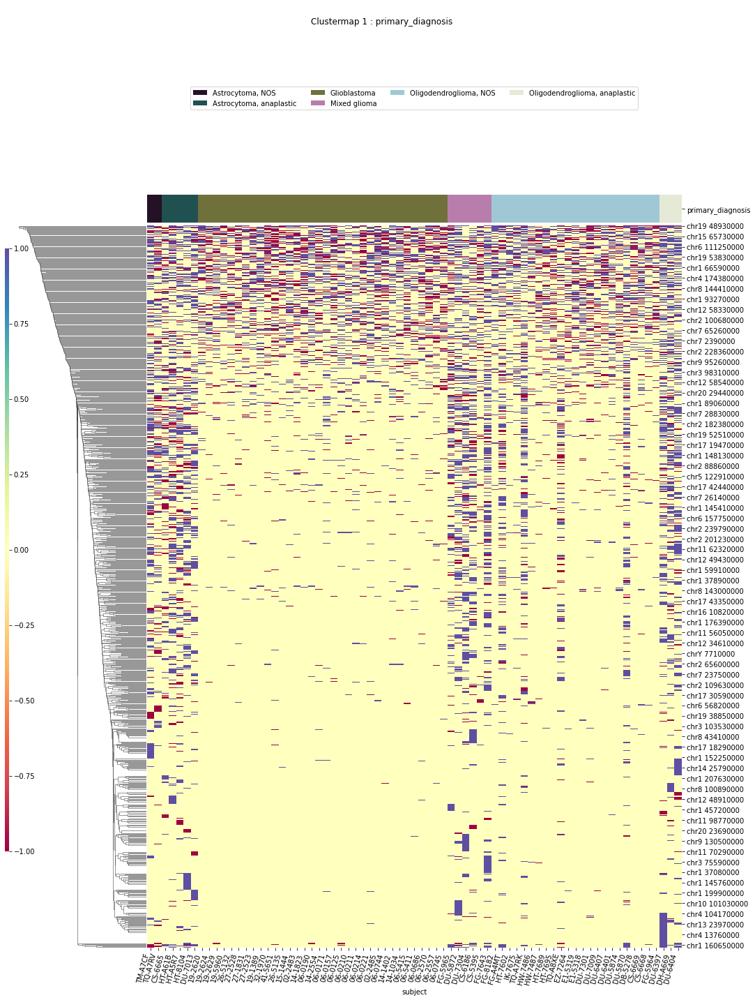

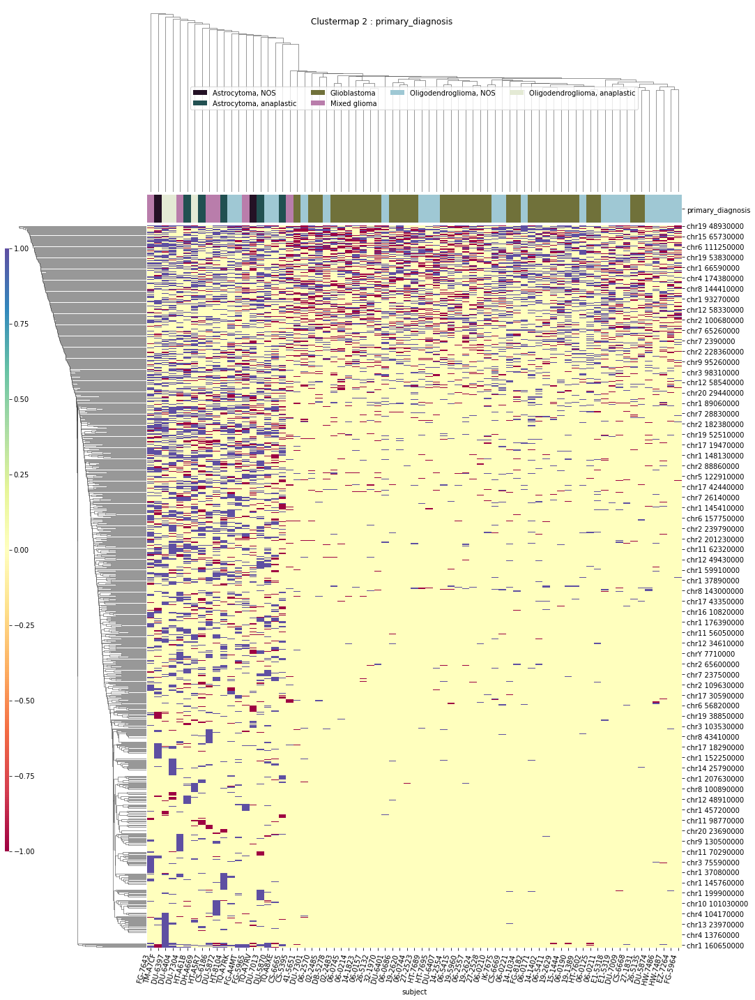

IDH
T-Testing
Boxplotting
Clustermapping
['IDH' 'chr1 13350000' 'chr1 1400000' 'chr1 1410000' 'chr1 145930000'
 'chr1 152450000' 'chr1 166600000' 'chr1 229930000' 'chr1 236420000'
 'chr1 246080000' 'chr1 39230000' 'chr1 59910000' 'chr1 73130000'
 'chr1 75380000' 'chr1 77980000' 'chr10 102390000' 'chr10 102450000'
 'chr10 130620000' 'chr10 19510000' 'chr10 26890000' 'chr10 3060000'
 'chr10 41710000' 'chr10 65400000' 'chr10 65410000' 'chr10 6830000'
 'chr10 86030000' 'chr10 99820000' 'chr11 105260000' 'chr11 118720000'
 'chr11 3390000' 'chr11 56610000' 'chr11 60620000' 'chr11 62850000'
 'chr11 67750000' 'chr11 75400000' 'chr11 8520000' 'chr12 107820000'
 'chr12 121630000' 'chr12 19340000' 'chr12 37730000' 'chr12 58330000'
 'chr13 18250000' 'chr13 22810000' 'chr13 24950000' 'chr14 105270000'
 'chr14 105550000' 'chr14 33980000' 'chr14 77630000' 'chr15 101860000'
 'chr15 58830000' 'chr15 78220000' 'chr16 35950000' 'chr16 57200000'
 'chr16 5750000' 'chr16 74800000' 'chr16 83870000' 'chr17 15

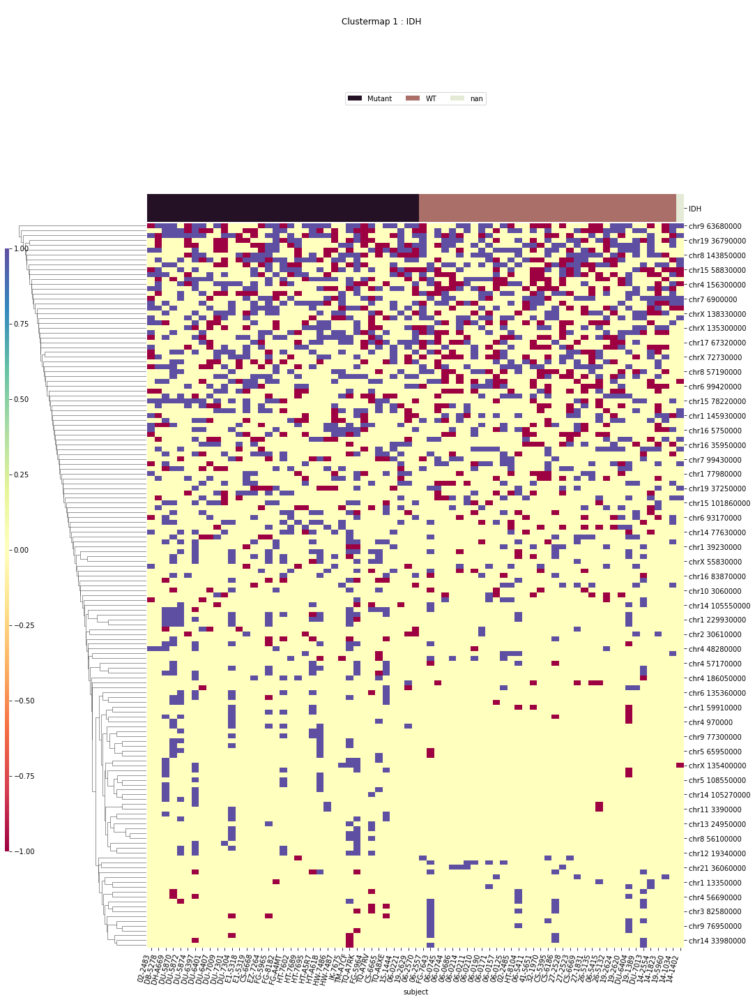

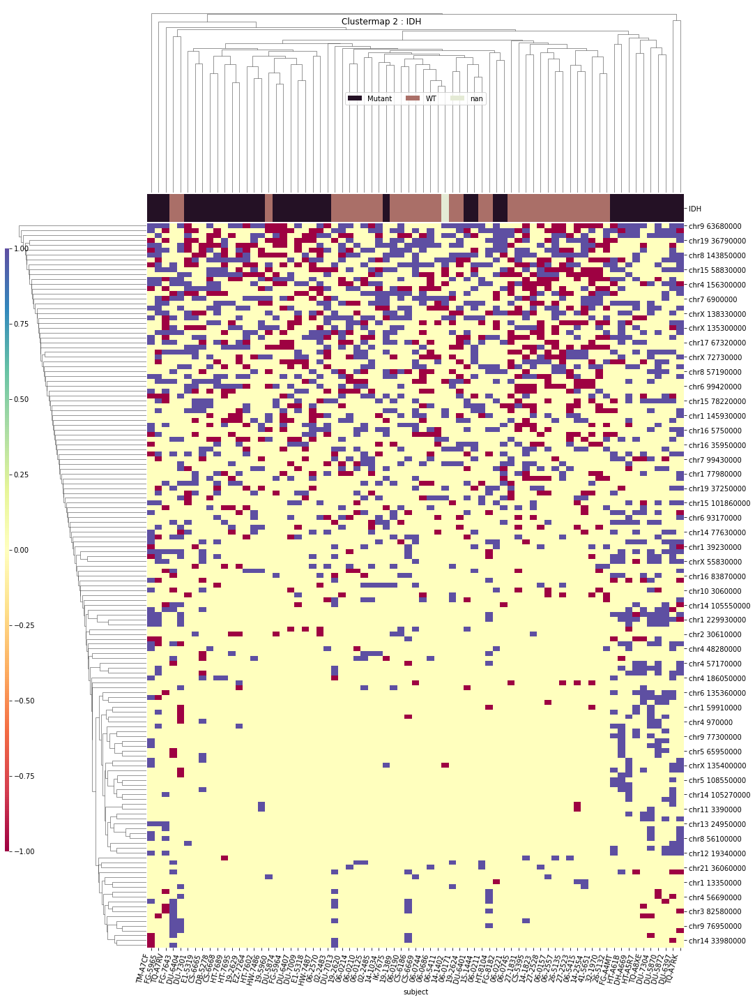

x1p19q
T-Testing
Boxplotting
Clustermapping
['chr1 114050000' 'chr1 145930000' 'chr1 15130000' 'chr1 151870000'
 'chr1 152450000' 'chr1 15370000' 'chr1 154280000' 'chr1 225960000'
 'chr1 227710000' 'chr1 237660000' 'chr1 27850000' 'chr1 37890000'
 'chr1 45510000' 'chr1 45520000' 'chr1 46320000' 'chr1 54630000'
 'chr1 66590000' 'chr1 70460000' 'chr1 79700000' 'chr1 89060000'
 'chr1 9000000' 'chr10 102390000' 'chr10 110760000' 'chr10 130620000'
 'chr10 34970000' 'chr10 41710000' 'chr10 65400000' 'chr10 67690000'
 'chr10 70400000' 'chr10 71870000' 'chr10 73710000' 'chr10 78070000'
 'chr10 97410000' 'chr11 105260000' 'chr11 2960000' 'chr11 5930000'
 'chr11 60450000' 'chr11 71530000' 'chr11 91060000' 'chr12 105470000'
 'chr12 122350000' 'chr12 29930000' 'chr12 34180000' 'chr12 37730000'
 'chr12 56780000' 'chr12 75440000' 'chr12 7580000' 'chr13 18250000'
 'chr13 18720000' 'chr13 40900000' 'chr13 42710000' 'chr13 43410000'
 'chr14 105270000' 'chr14 38110000' 'chr14 45210000' 'chr15 101860000'

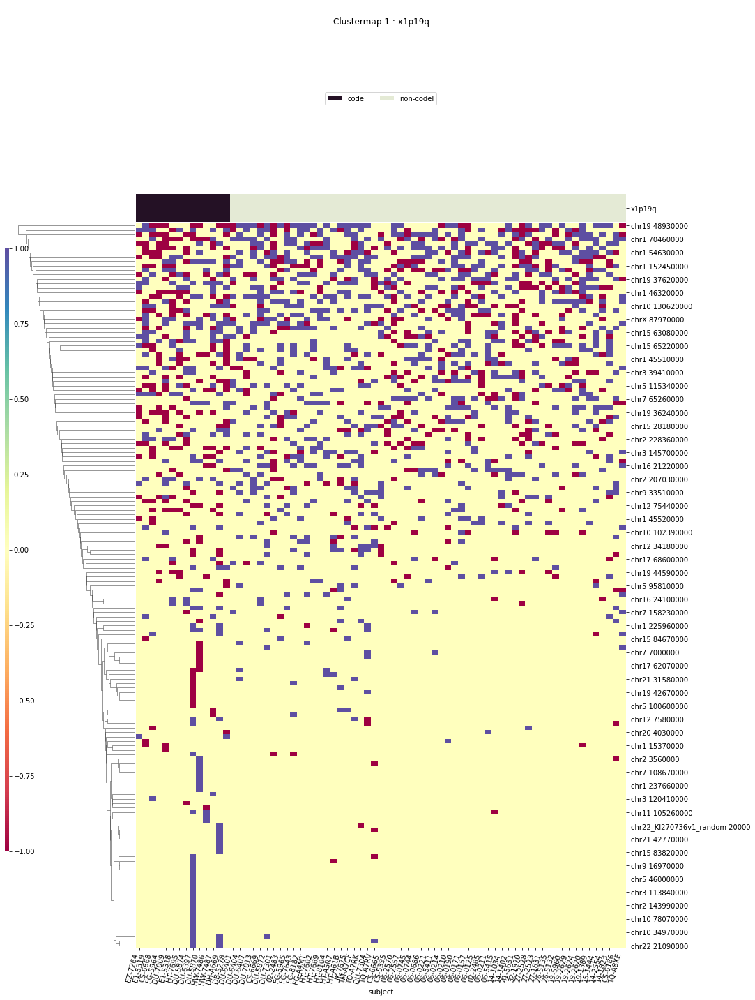

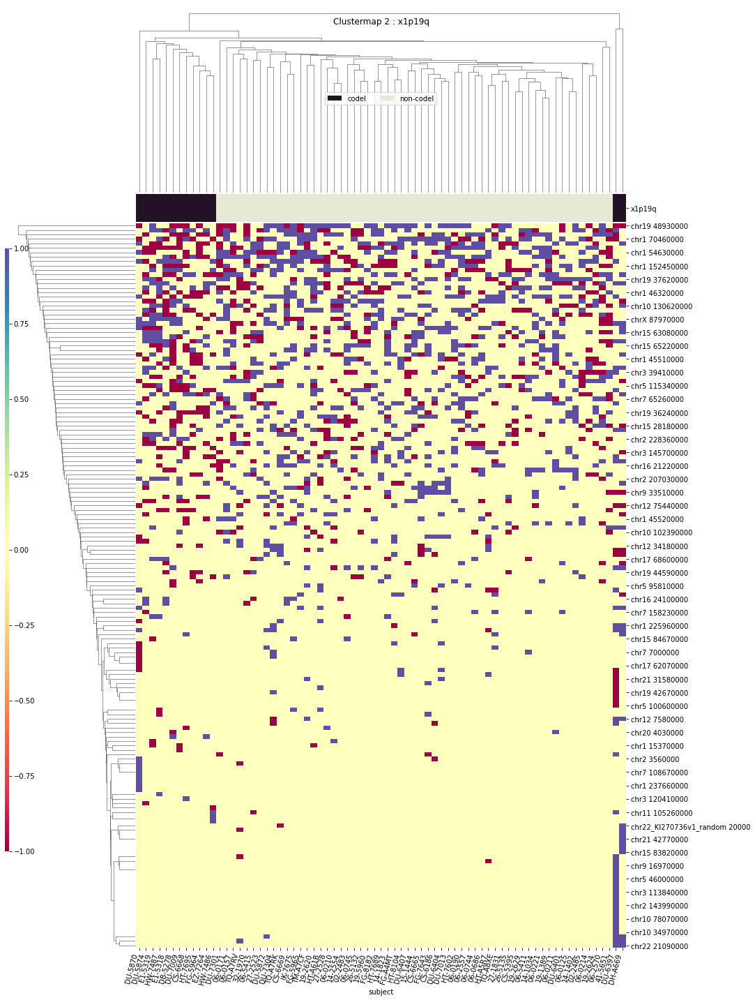

TERT
T-Testing
Boxplotting
Clustermapping
['TERT' 'chr1 10420000' 'chr1 114050000' 'chr1 120420000' 'chr1 147730000'
 'chr1 148130000' 'chr1 151870000' 'chr1 160690000' 'chr1 161430000'
 'chr1 21050000' 'chr1 211220000' 'chr1 246080000' 'chr1 27820000'
 'chr1 66420000' 'chr1 66590000' 'chr1 70460000' 'chr1 73130000'
 'chr1 75370000' 'chr1 77980000' 'chr1 99830000' 'chr10 101030000'
 'chr10 19510000' 'chr10 3060000' 'chr10 41710000' 'chr10 42130000'
 'chr10 45390000' 'chr10 4900000' 'chr10 65410000' 'chr10 68520000'
 'chr10 86030000' 'chr11 118720000' 'chr11 200000' 'chr11 56610000'
 'chr11 59580000' 'chr11 62320000' 'chr11 62350000' 'chr11 62380000'
 'chr11 71530000' 'chr11 79190000' 'chr11 82180000' 'chr11 8520000'
 'chr12 105470000' 'chr12 107820000' 'chr12 108650000' 'chr12 19340000'
 'chr12 34180000' 'chr12 58330000' 'chr13 22810000' 'chr13 24950000'
 'chr14 23970000' 'chr14 77630000' 'chr14 77740000' 'chr14 94620000'
 'chr15 28180000' 'chr15 50150000' 'chr15 58830000' 'chr15 74880

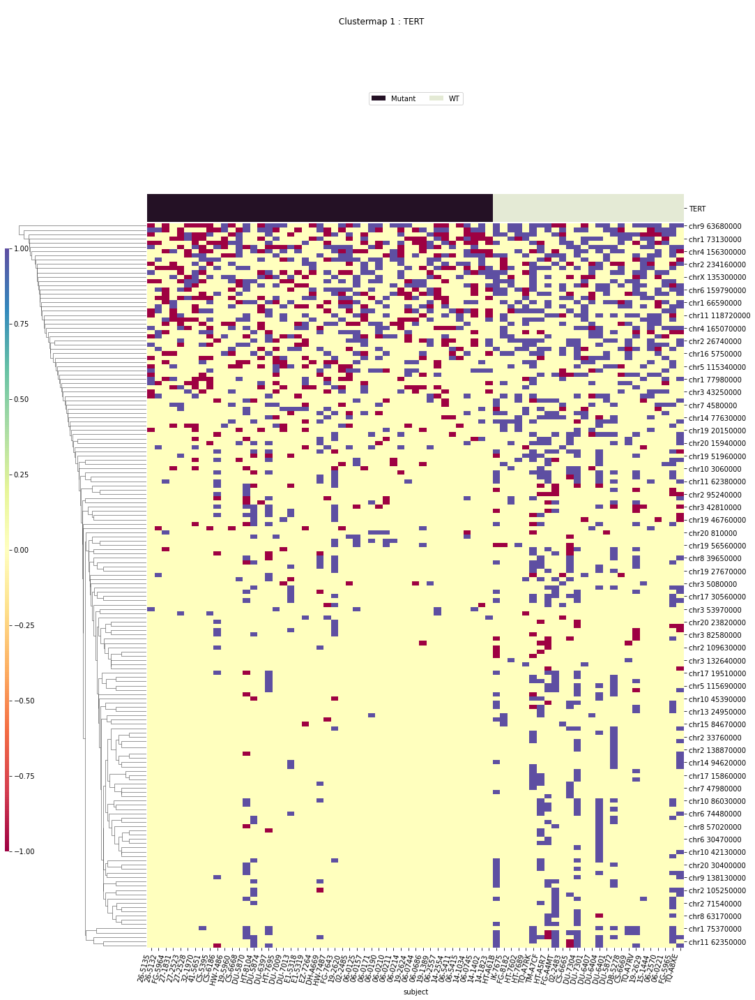

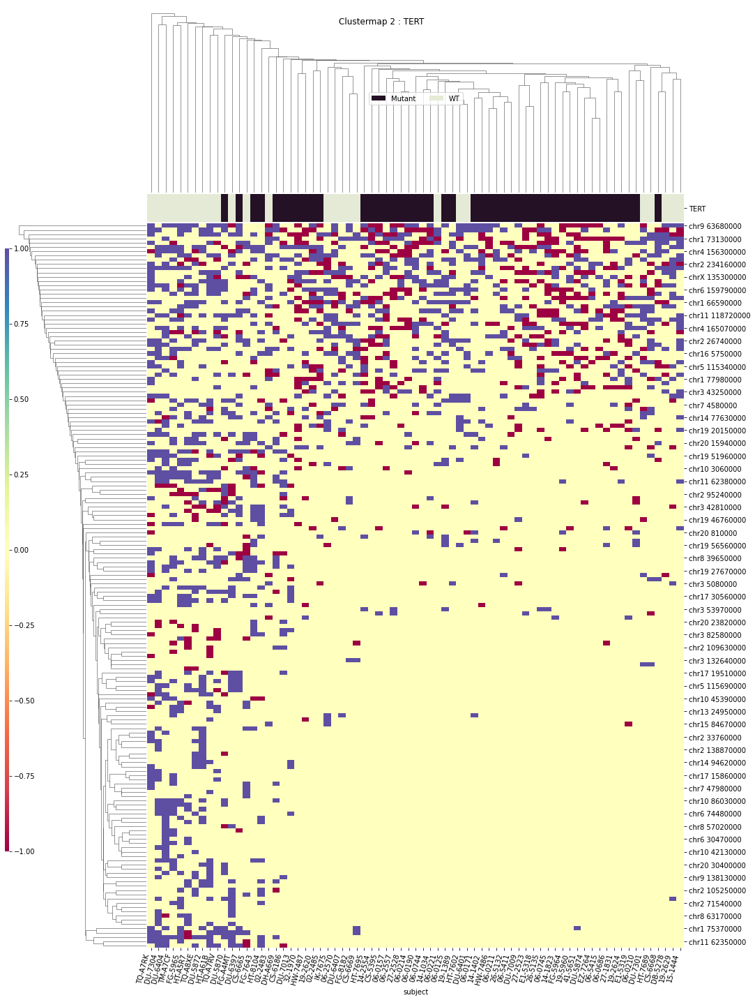

disease_type
T-Testing
Boxplotting
Clustermapping
['chr1 105470000' 'chr1 109760000' 'chr1 111800000' 'chr1 13350000'
 'chr1 1400000' 'chr1 143700000' 'chr1 148130000' 'chr1 150630000'
 'chr1 152470000' 'chr1 155630000' 'chr1 160650000' 'chr1 160930000'
 'chr1 161010000' 'chr1 166600000' 'chr1 209120000' 'chr1 211220000'
 'chr1 229930000' 'chr1 246080000' 'chr1 33060000' 'chr1 45510000'
 'chr1 73130000' 'chr1 75370000' 'chr1 89060000' 'chr1 99790000'
 'chr1 99830000' 'chr10 102390000' 'chr10 130620000' 'chr10 19510000'
 'chr10 41710000' 'chr10 4900000' 'chr10 65400000' 'chr10 6830000'
 'chr10 70630000' 'chr10 86030000' 'chr10 97700000' 'chr10 99250000'
 'chr10 99820000' 'chr11 105260000' 'chr11 118720000' 'chr11 3390000'
 'chr11 56050000' 'chr11 60620000' 'chr11 61650000' 'chr11 62320000'
 'chr11 62350000' 'chr11 62380000' 'chr11 67750000' 'chr11 8520000'
 'chr12 123490000' 'chr12 19340000' 'chr12 37730000' 'chr12 49110000'
 'chr12 53120000' 'chr12 73000000' 'chr13 113860000' 'chr13 11

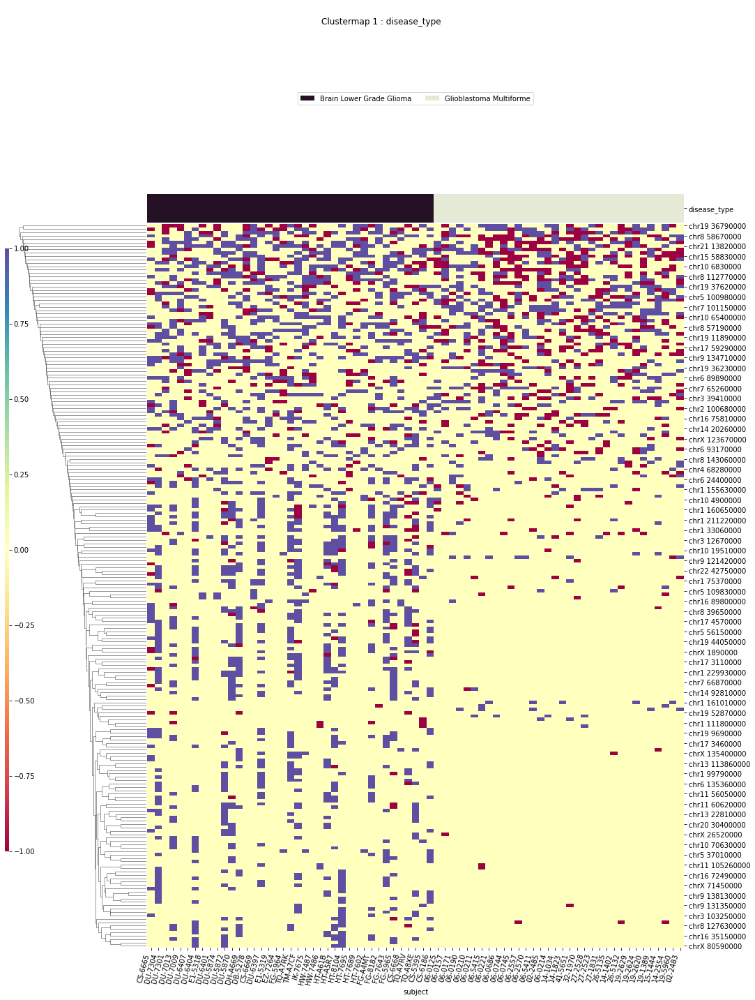

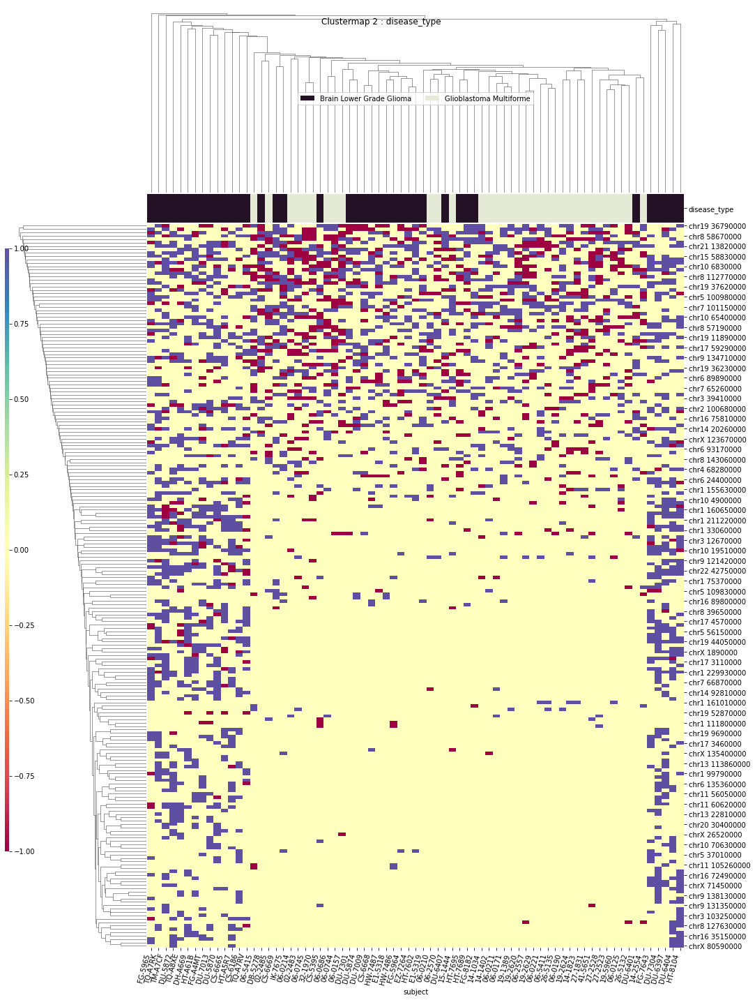

IDH_1p19q_status
T-Testing


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['IDH_1p19q_status' 'chr1 10420000' 'chr1 108150000' 'chr1 108510000'
 'chr1 114050000' 'chr1 1400000' 'chr1 1410000' 'chr1 145930000'
 'chr1 148130000' 'chr1 15130000' 'chr1 151870000' 'chr1 152450000'
 'chr1 15370000' 'chr1 160650000' 'chr1 160690000' 'chr1 161430000'
 'chr1 166600000' 'chr1 209140000' 'chr1 21050000' 'chr1 211220000'
 'chr1 225960000' 'chr1 227710000' 'chr1 246080000' 'chr1 45520000'
 'chr1 46320000' 'chr1 54630000' 'chr1 59910000' 'chr1 66420000'
 'chr1 66590000' 'chr1 70460000' 'chr1 73130000' 'chr1 75380000'
 'chr1 77980000' 'chr1 79700000' 'chr1 89060000' 'chr1 9000000'
 'chr10 102390000' 'chr10 130620000' 'chr10 19510000' 'chr10 26890000'
 'chr10 3060000' 'chr10 41710000' 'chr10 65400000' 'chr10 65410000'
 'chr10 6830000' 'chr10 68520000' 'chr10 70630000' 'chr10 86030000'
 'chr10 97410000' 'chr10 99820000' 'chr11 101690000' 'chr11 105260000'
 'chr11 18900000' 'chr11 200000' 'chr11 56610000' 'chr11 59580000'
 'chr11 60450000' 'chr11 60

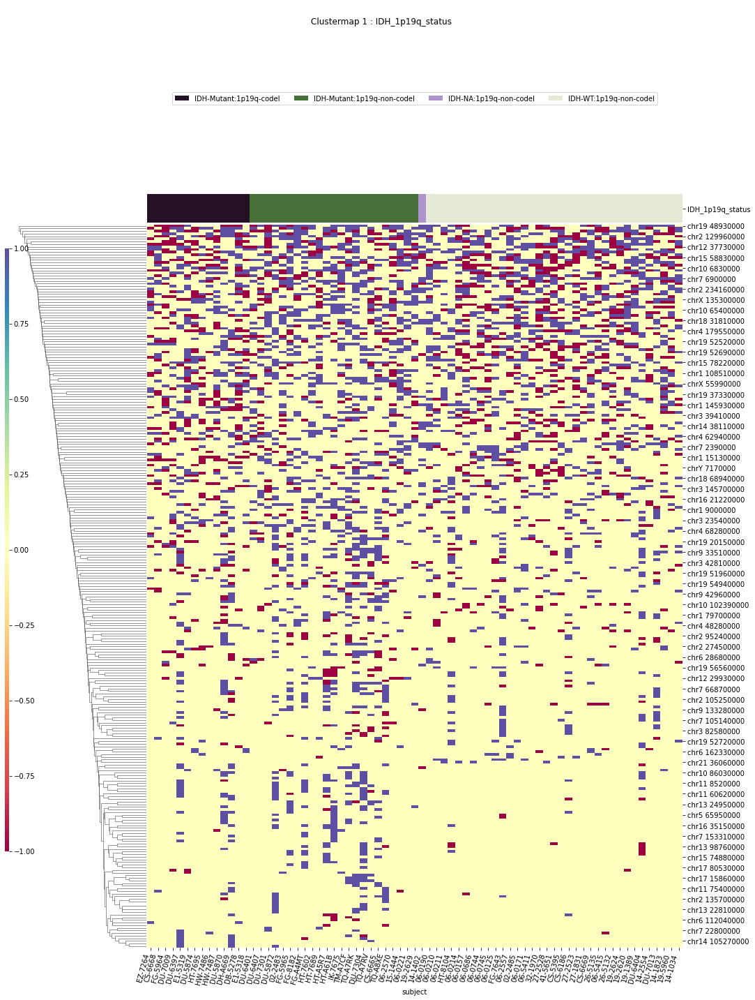

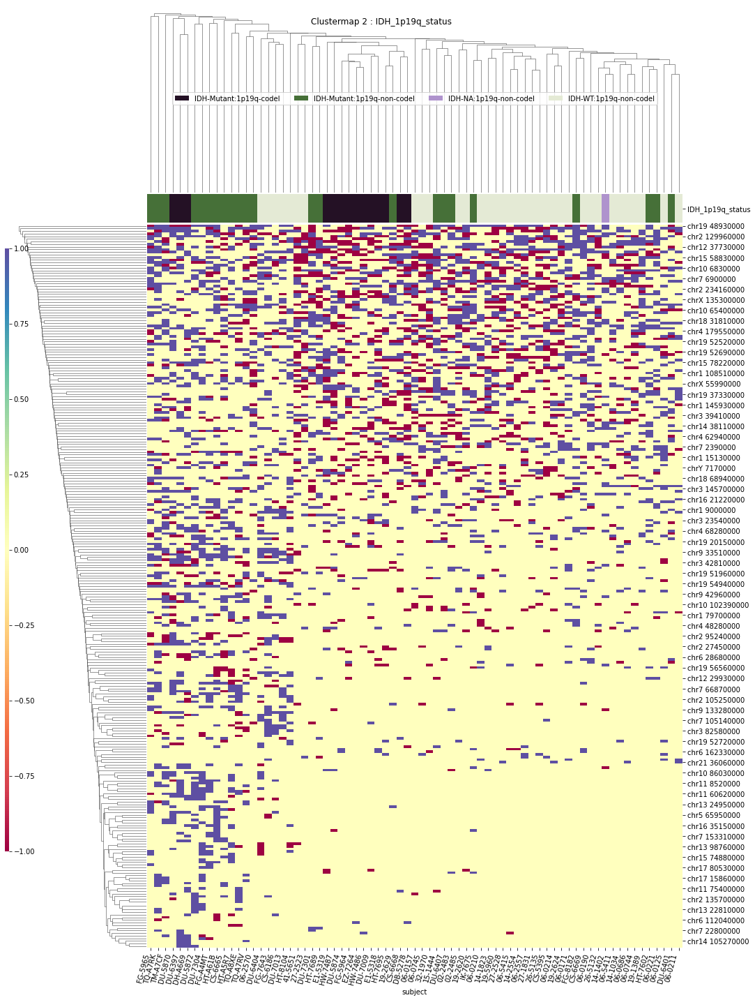

WHO_groups
T-Testing
Boxplotting
Clustermapping
['WHO_groups' 'chr1 10020000' 'chr1 104130000' ... 'chrY 7180000'
 'chrY 7710000' 'subject']


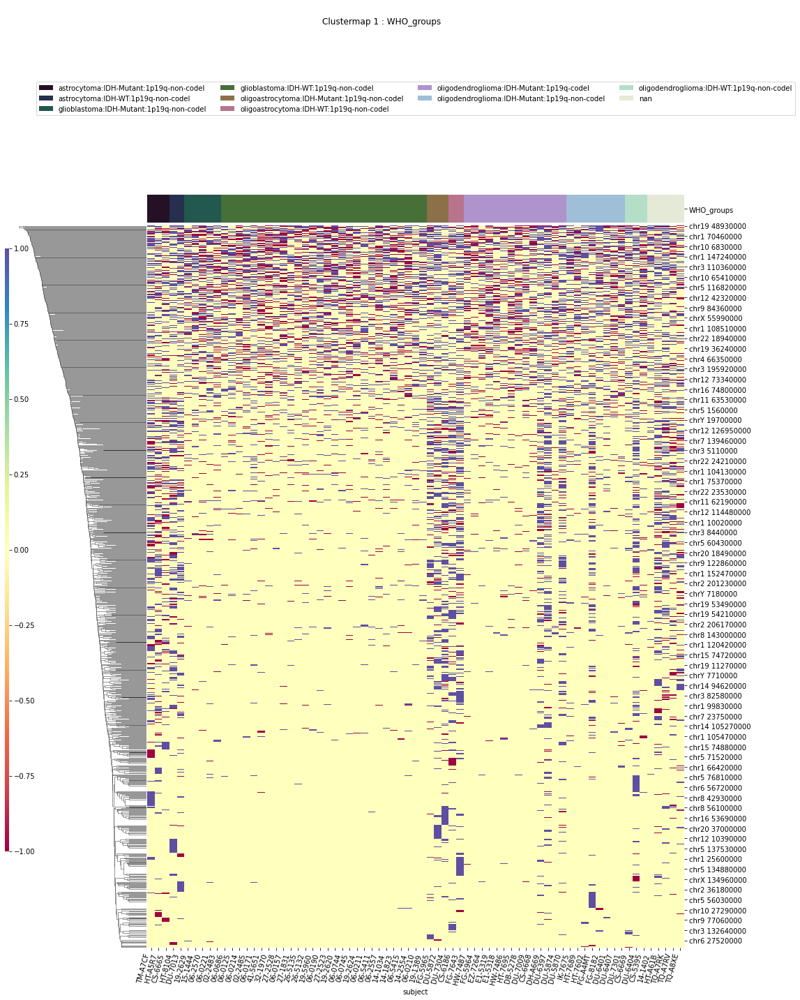

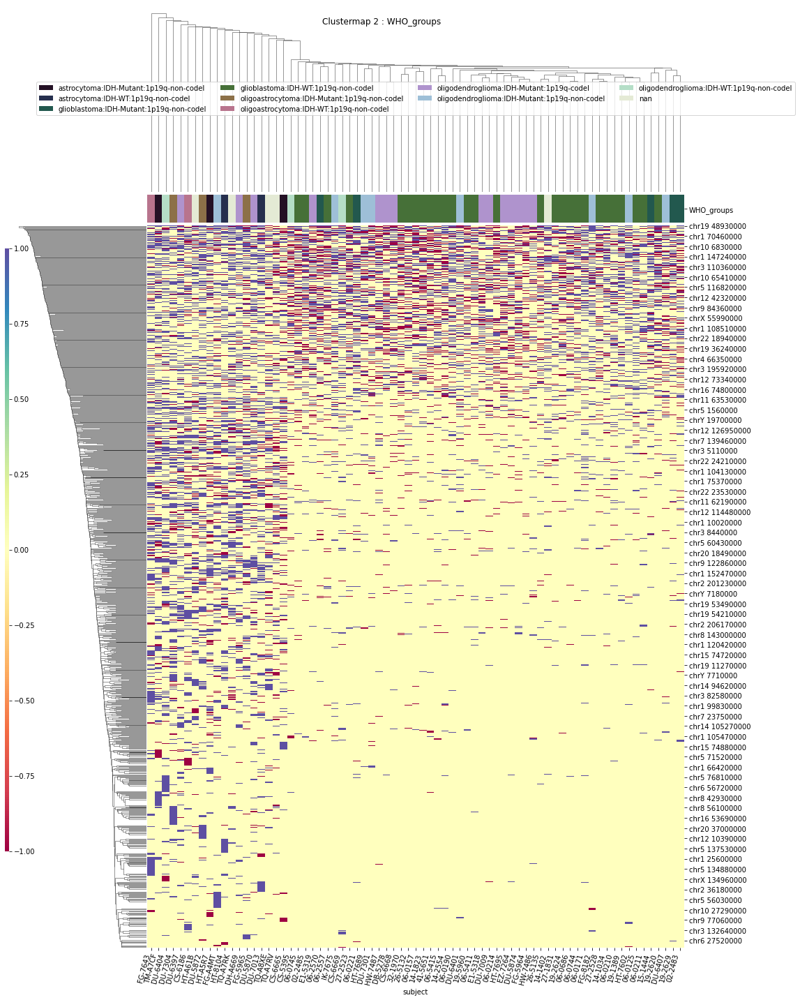

Triple_group
T-Testing
Boxplotting
Clustermapping
['Triple_group' 'chr1 10420000' 'chr1 108150000' 'chr1 108510000'
 'chr1 109760000' 'chr1 111360000' 'chr1 114050000' 'chr1 120420000'
 'chr1 1400000' 'chr1 1410000' 'chr1 145410000' 'chr1 145930000'
 'chr1 147730000' 'chr1 148130000' 'chr1 149090000' 'chr1 15130000'
 'chr1 151870000' 'chr1 152450000' 'chr1 15370000' 'chr1 156320000'
 'chr1 160650000' 'chr1 160690000' 'chr1 160930000' 'chr1 161430000'
 'chr1 166600000' 'chr1 197400000' 'chr1 209140000' 'chr1 21050000'
 'chr1 211220000' 'chr1 225960000' 'chr1 227270000' 'chr1 227710000'
 'chr1 229930000' 'chr1 236420000' 'chr1 246080000' 'chr1 27820000'
 'chr1 33060000' 'chr1 42750000' 'chr1 45520000' 'chr1 46320000'
 'chr1 54630000' 'chr1 5570000' 'chr1 59910000' 'chr1 64410000'
 'chr1 66420000' 'chr1 66590000' 'chr1 70460000' 'chr1 73130000'
 'chr1 75370000' 'chr1 77980000' 'chr1 79700000' 'chr1 81030000'
 'chr1 89060000' 'chr1 9000000' 'chr1 99830000' 'chr10 101030000'
 'chr10 1023900

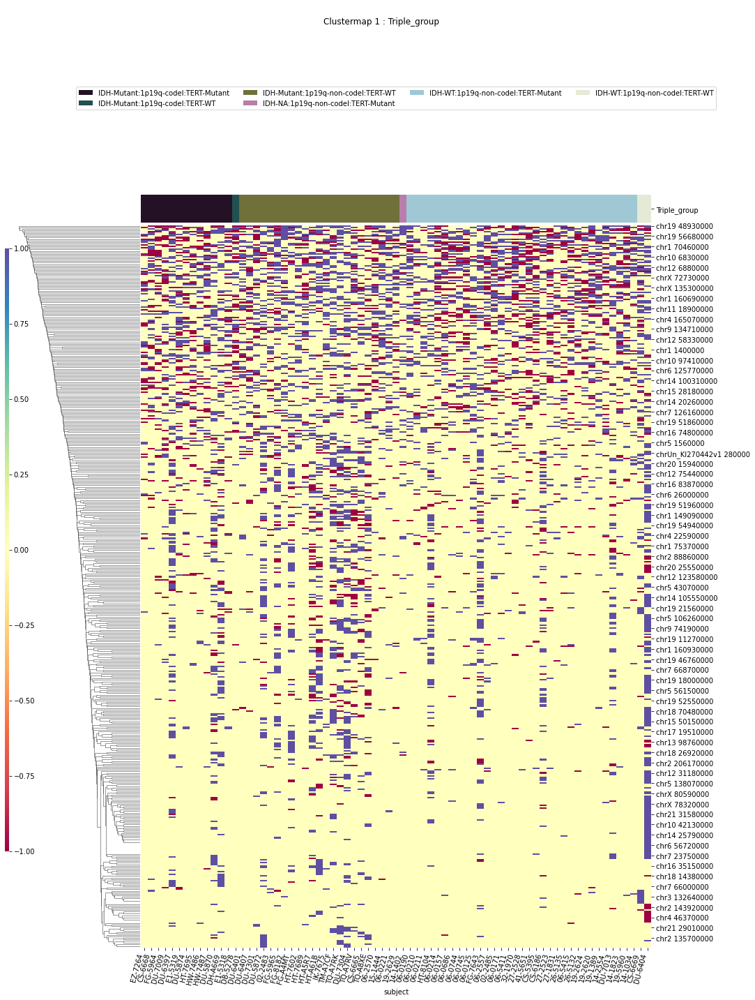

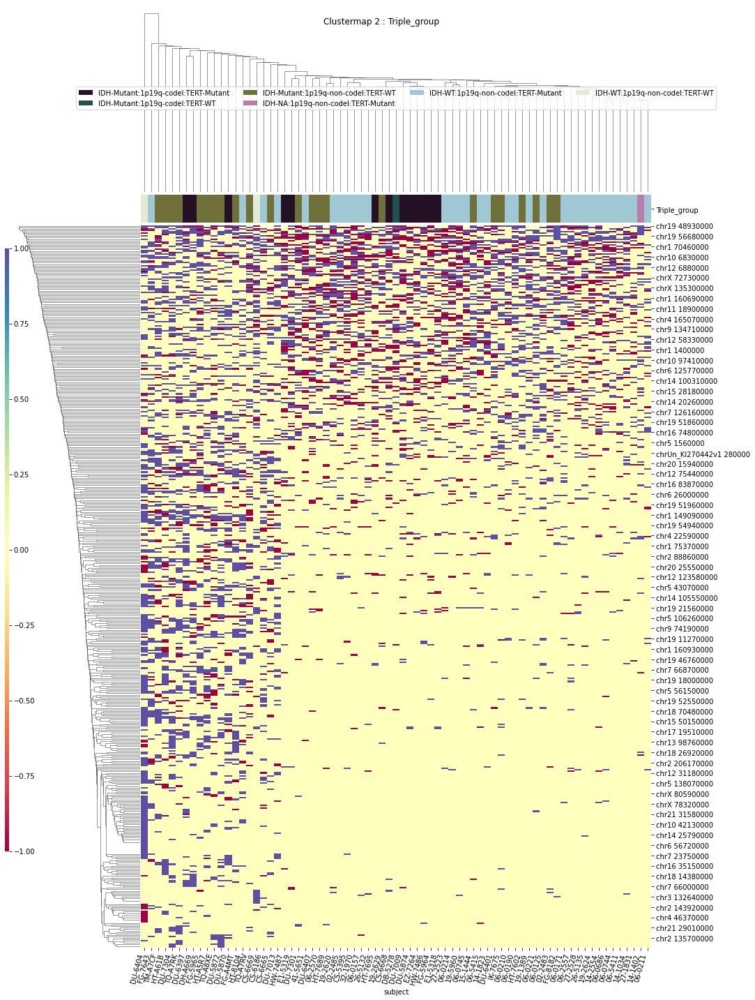

MGMT
T-Testing
Boxplotting
Clustermapping
['MGMT' 'chr1 13350000' 'chr1 1410000' 'chr1 152450000' 'chr1 160930000'
 'chr1 161010000' 'chr1 166600000' 'chr1 224330000' 'chr1 227270000'
 'chr1 236420000' 'chr1 54630000' 'chr1 59910000' 'chr1 70460000'
 'chr10 65400000' 'chr10 65410000' 'chr10 6830000' 'chr11 63530000'
 'chr12 107820000' 'chr12 121630000' 'chr12 32090000' 'chr12 32100000'
 'chr12 58330000' 'chr13 34540000' 'chr13 98760000' 'chr14 100310000'
 'chr14 31430000' 'chr14 33980000' 'chr14 55020000' 'chr14 77630000'
 'chr14 77660000' 'chr15 101860000' 'chr15 23080000' 'chr15 74720000'
 'chr15 78520000' 'chr16 35620000' 'chr16 57200000' 'chr16 5750000'
 'chr16 74790000' 'chr16 74800000' 'chr16 89800000' 'chr17 16310000'
 'chr17 68600000' 'chr17 7150000' 'chr18 14380000' 'chr18 4910000'
 'chr19 18000000' 'chr19 21560000' 'chr19 23720000' 'chr19 36790000'
 'chr19 39680000' 'chr19 41030000' 'chr19 44640000' 'chr19 54940000'
 'chr19 56680000' 'chr2 232420000' 'chr2 239790000' 'chr2 26

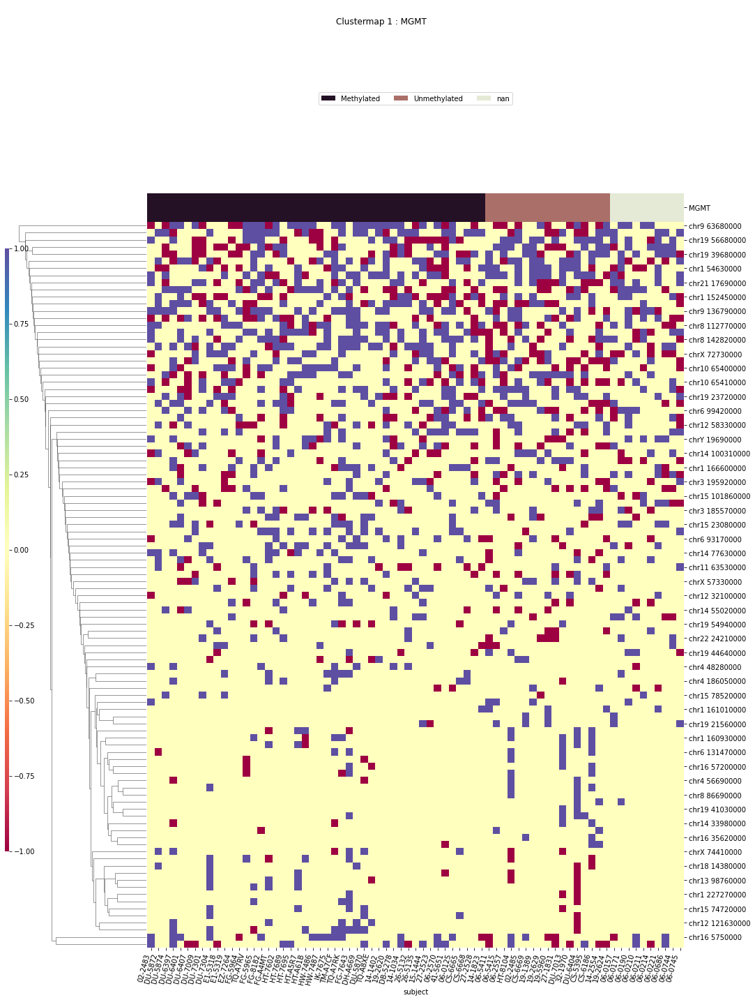

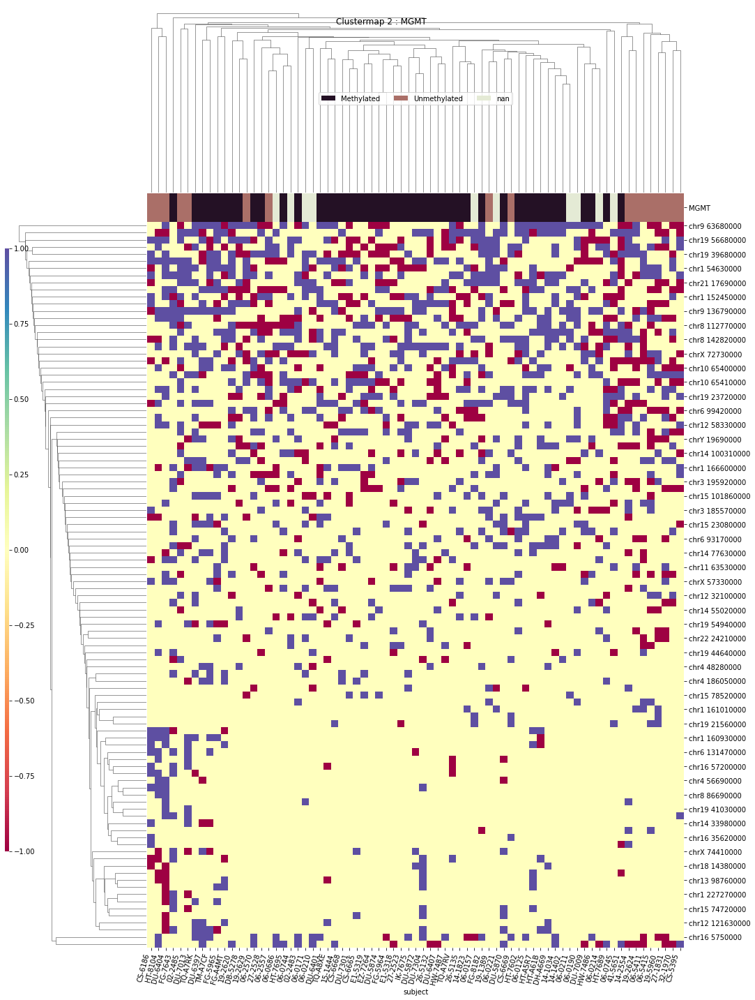

gender1
T-Testing
Boxplotting
Clustermapping
['chr1 143700000' 'chr1 150630000' 'chr1 152450000' 'chr1 155620000'
 'chr1 211220000' 'chr1 225960000' 'chr1 29330000' 'chr1 37890000'
 'chr1 46320000' 'chr1 89060000' 'chr1 99830000' 'chr10 130620000'
 'chr10 6160000' 'chr10 80800000' 'chr11 101690000' 'chr11 10390000'
 'chr11 33040000' 'chr11 37930000' 'chr11 59130000' 'chr11 60200000'
 'chr11 62850000' 'chr11 63530000' 'chr11 64700000' 'chr11 67860000'
 'chr11 75870000' 'chr11 76710000' 'chr11 86730000' 'chr12 10570000'
 'chr12 21640000' 'chr12 34610000' 'chr12 49430000' 'chr12 49860000'
 'chr12 59100000' 'chr12 73000000' 'chr12 85460000' 'chr13 19600000'
 'chr13 24590000' 'chr13 34540000' 'chr14 105550000' 'chr14 23980000'
 'chr14 59050000' 'chr14 77410000' 'chr14 77740000' 'chr15 50150000'
 'chr15 75870000' 'chr15 84670000' 'chr15 88540000' 'chr16 35200000'
 'chr16 75810000' 'chr17 16090000' 'chr17 18290000' 'chr17 28600000'
 'chr17 30590000' 'chr17 3460000' 'chr17 42440000' 'chr17 542

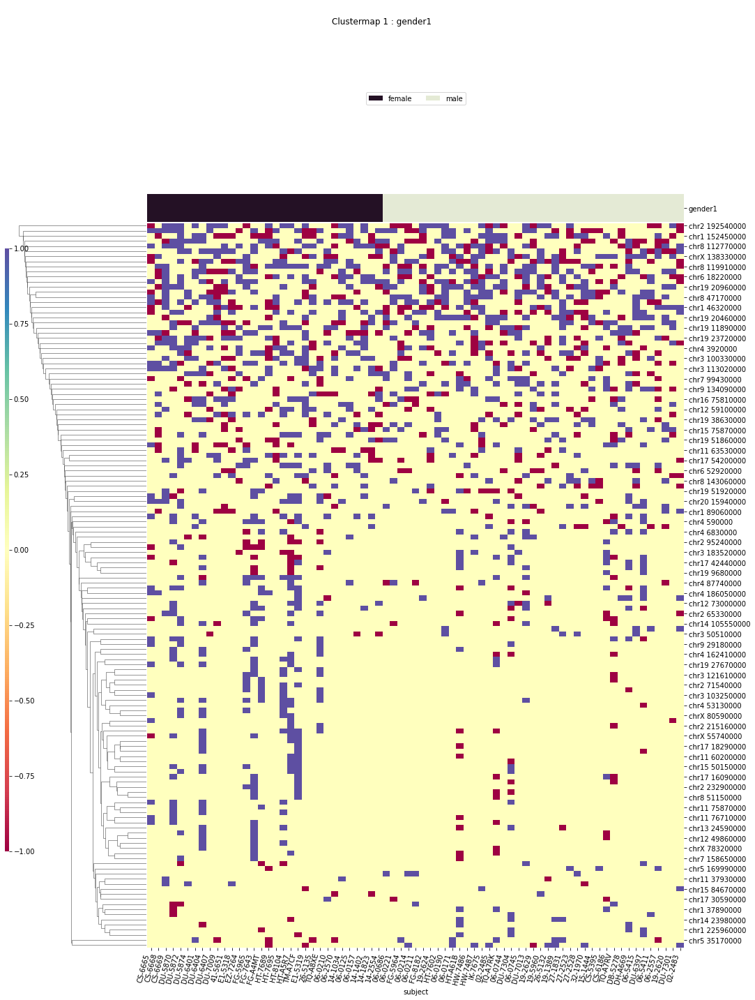

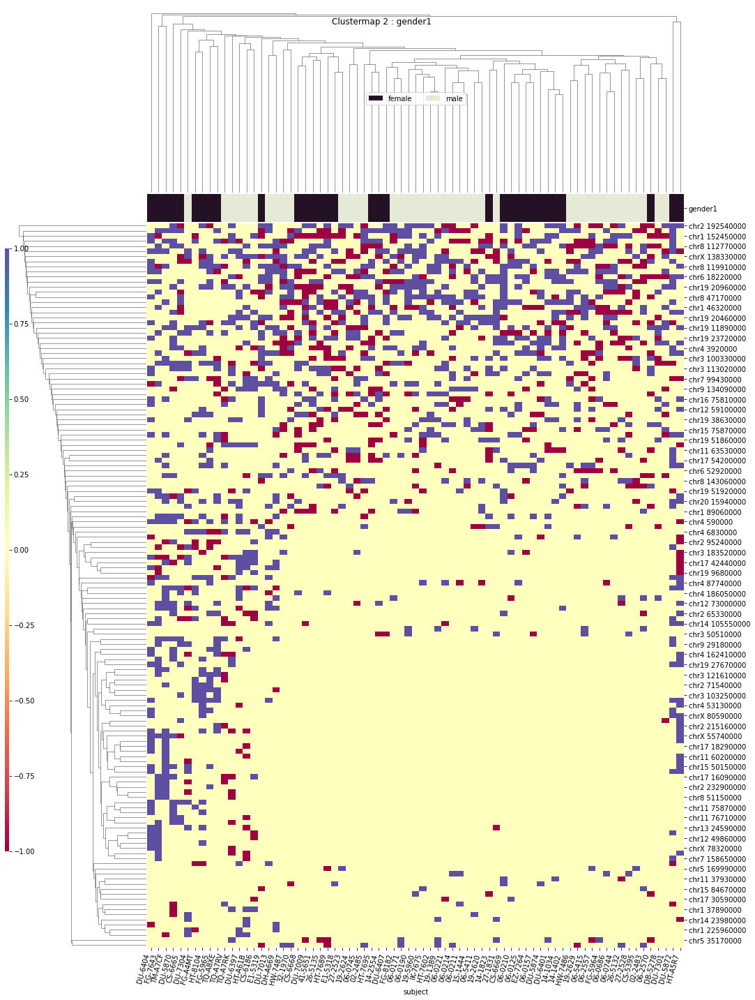

In [116]:
for column in 'race','ethnicity','primary_diagnosis','IDH','x1p19q','TERT','disease_type','IDH_1p19q_status','WHO_groups','Triple_group','MGMT','gender1':
    print(column)
    ttests_boxplots_and_heatmaps(compdf[compdf['hkle']==hkle],
        compdf.columns[compdf.columns.str.contains("^chr")],column,box_p=1e-10,heat_p=0.1)

In [117]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210525 21:17:37'

race
T-Testing
Boxplotting
Clustermapping
['chr1 160910000' 'chr1 168830000' 'chr1 77980000' 'chr1 86890000'
 'chr10 19500000' 'chr10 80530000' 'chr12 10390000' 'chr12 4720000'
 'chr12 51450000' 'chr12 58330000' 'chr12 93070000' 'chr14 64970000'
 'chr14_KI270724v1_random 10000' 'chr2 43670000' 'chr2 62630000'
 'chr3 27530000' 'chr4 3530000' 'chr5 150990000' 'chr5 169990000'
 'chr6 27520000' 'chr8 143840000' 'chr9 123050000' 'chr9 63680000' 'race'
 'subject']


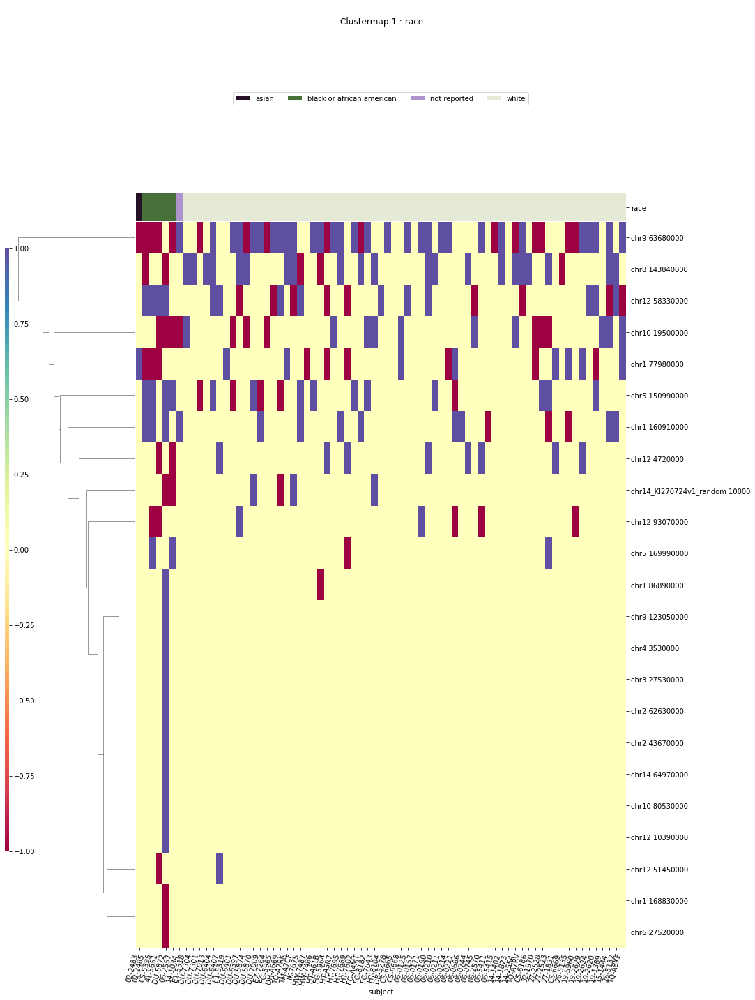

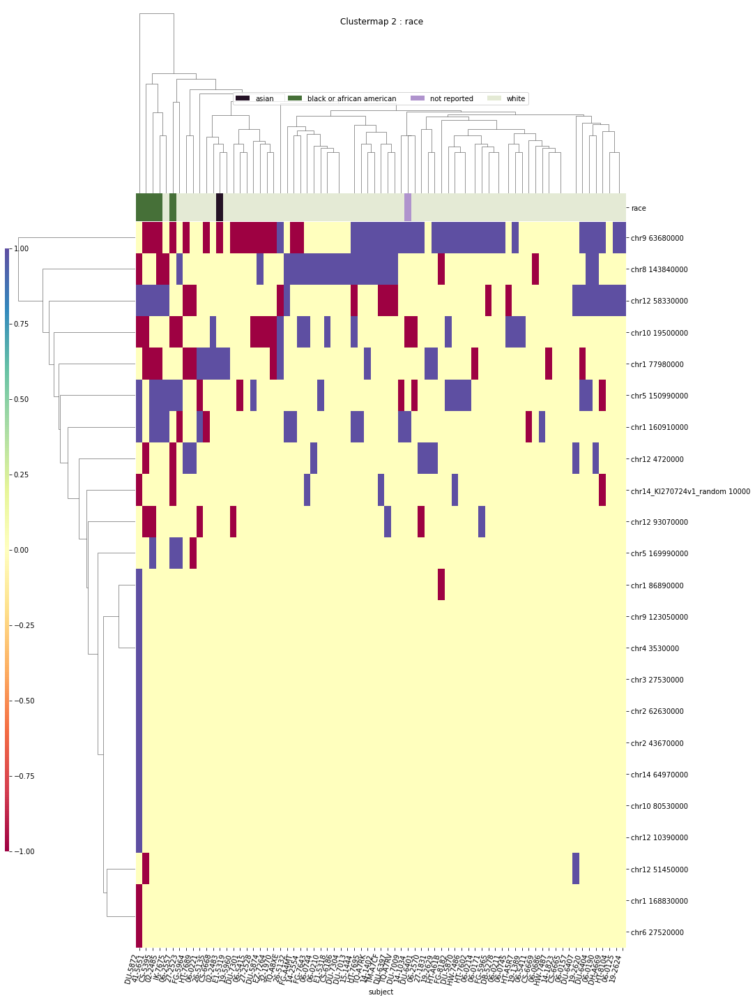

ethnicity
T-Testing
Boxplotting
Clustermapping
['chr1 10020000' 'chr1 108530000' 'chr1 109170000' 'chr1 109760000'
 'chr1 179130000' 'chr1 213150000' 'chr1 224330000' 'chr1 227130000'
 'chr1 234010000' 'chr1 245770000' 'chr1 247010000' 'chr1 29350000'
 'chr1 30340000' 'chr1 40000000' 'chr1 40470000' 'chr1 65130000'
 'chr1 99790000' 'chr10 42130000' 'chr10 43330000' 'chr10 45330000'
 'chr11 200000' 'chr11 37930000' 'chr11 67470000' 'chr11 91060000'
 'chr12 121630000' 'chr12 122350000' 'chr12 19340000' 'chr12 34180000'
 'chr12 42320000' 'chr12 48500000' 'chr12 68480000' 'chr12 75440000'
 'chr12 9950000' 'chr13 22810000' 'chr13 22850000' 'chr13 43410000'
 'chr13 52060000' 'chr14 105550000' 'chr14 105670000' 'chr14 34410000'
 'chr14 57330000' 'chr14 59050000' 'chr15 90340000' 'chr16 1930000'
 'chr16 21220000' 'chr16 2920000' 'chr16 53690000' 'chr16 57200000'
 'chr16 8170000' 'chr17 16090000' 'chr17 16400000' 'chr17 17910000'
 'chr17 19470000' 'chr17 49150000' 'chr17 67320000' 'chr17 777700

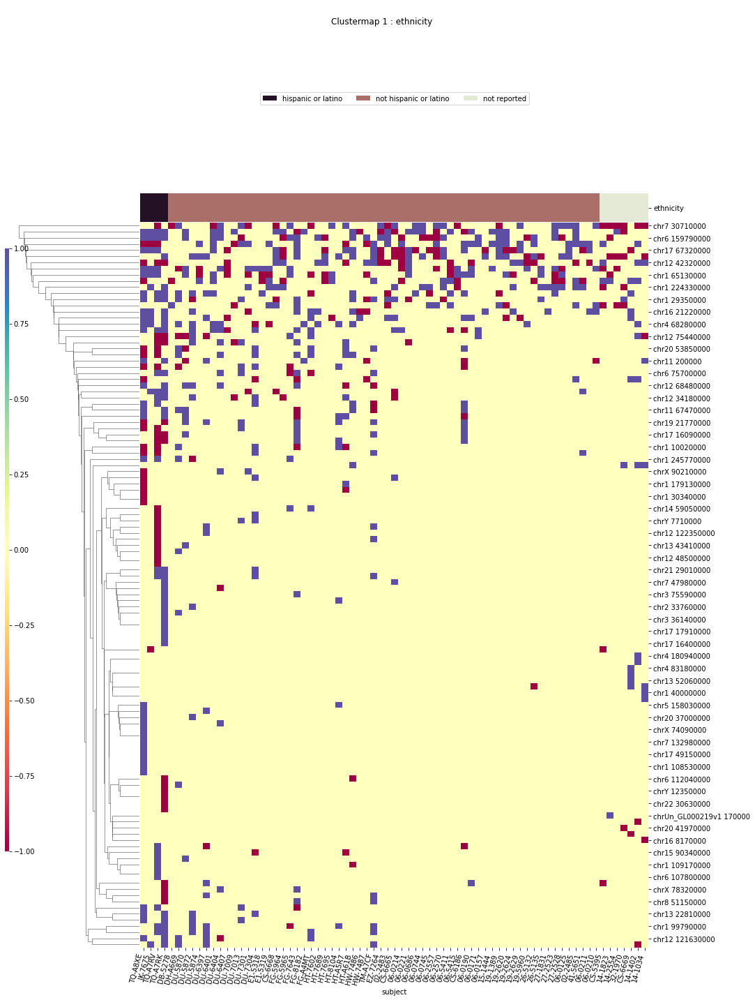

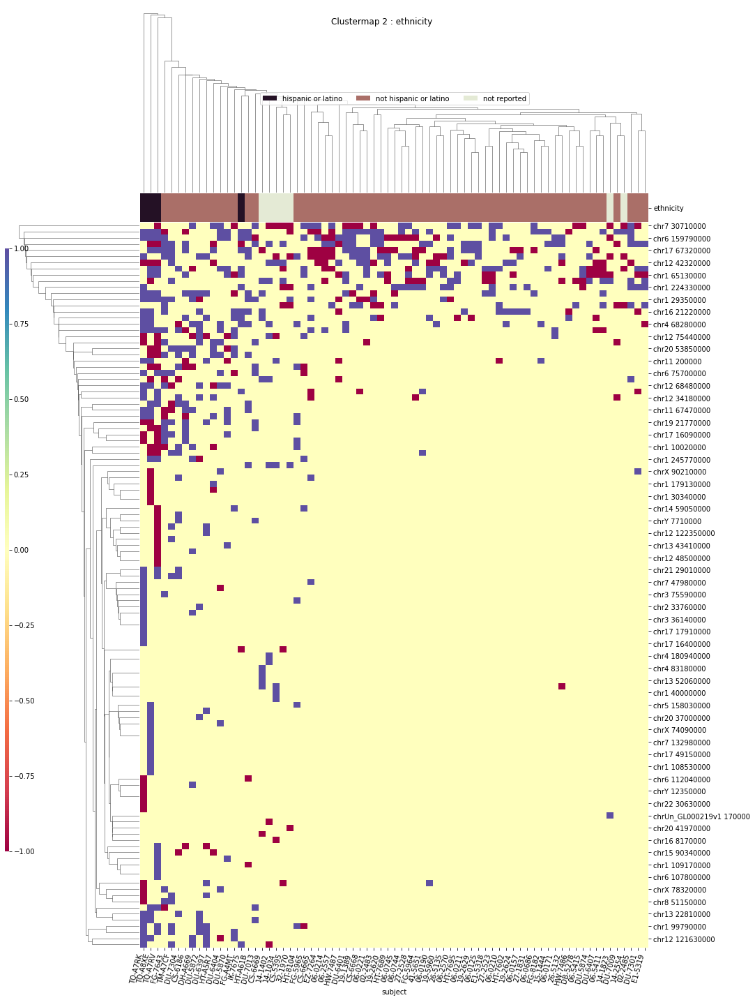

primary_diagnosis
T-Testing
Boxplotting
 p : 2.948014870353662e-15  ( t : 12.708265027138834 ) :  chr19 38360000


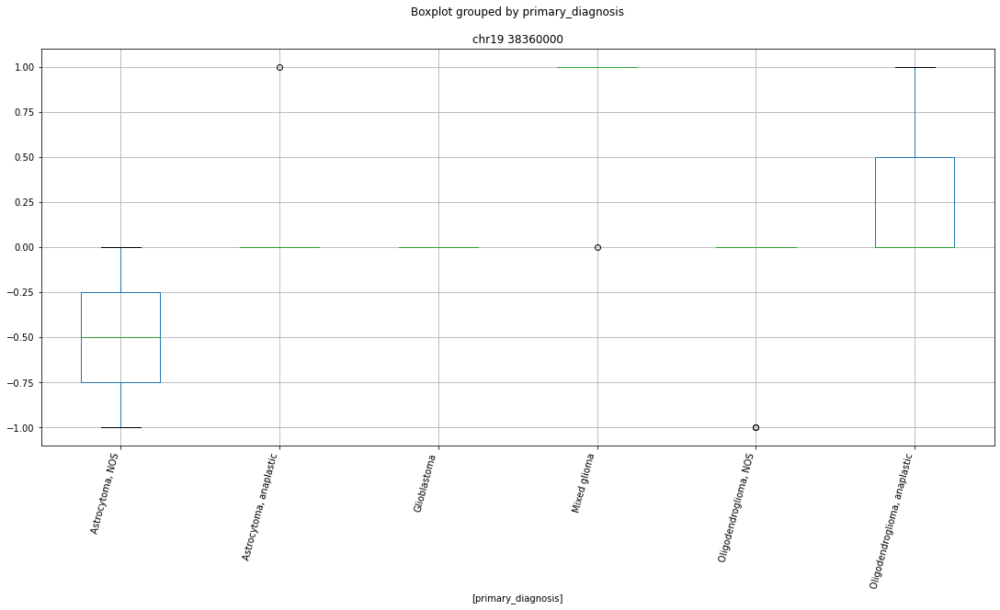

 p : 1.2735213637763784e-13  ( t : 11.358945418727963 ) :  chr1 148130000


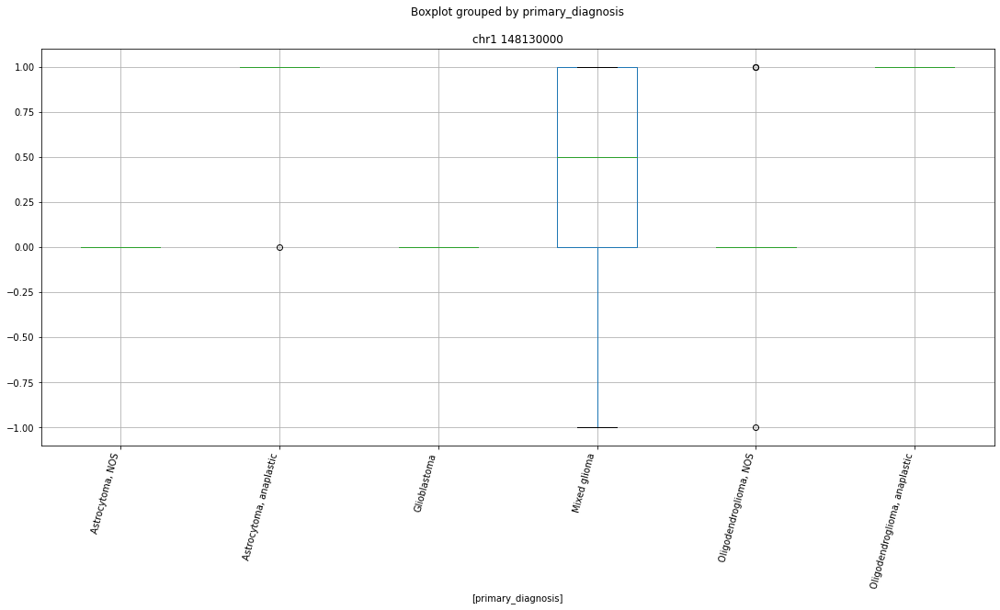

 p : 1.2735213637763784e-13  ( t : 11.358945418727963 ) :  chr20 30850000


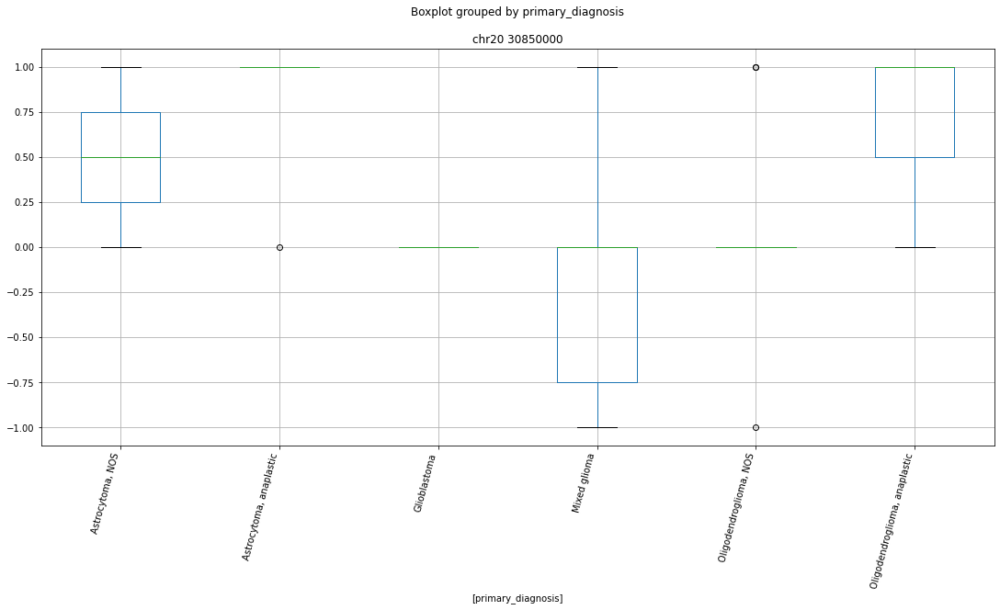

 p : 4.271448158247069e-12  ( t : 10.263721564032236 ) :  chr6 80630000


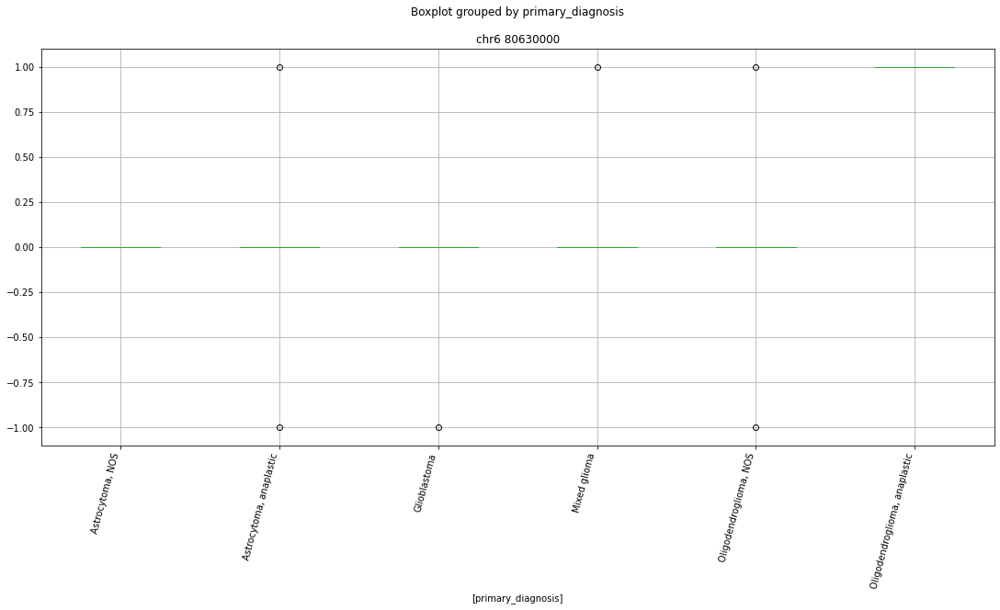

 p : 1.9864071913231304e-11  ( t : 9.677223188944682 ) :  chr15 100770000


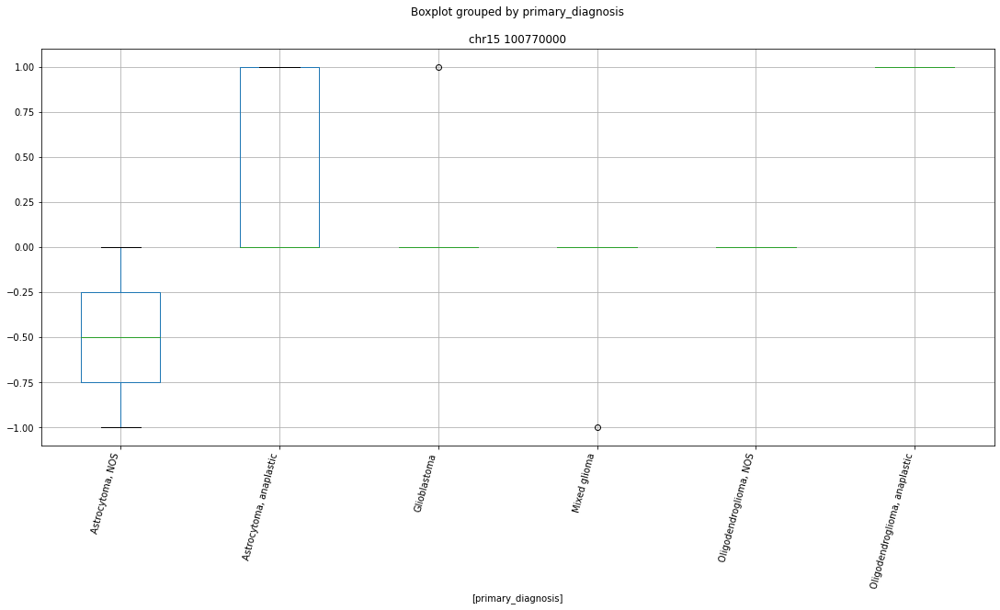

 p : 6.936790260584568e-11  ( t : 8.942327291667665 ) :  chr10 19510000


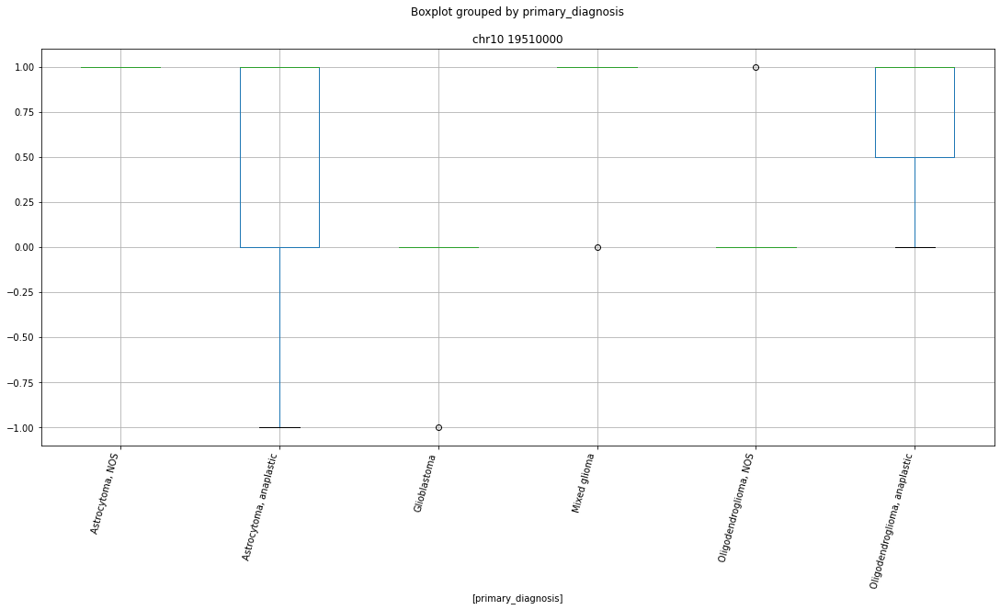

Clustermapping
['chr1 10020000' 'chr1 108150000' 'chr1 109170000' 'chr1 111360000'
 'chr1 111520000' 'chr1 111800000' 'chr1 114790000' 'chr1 120420000'
 'chr1 13360000' 'chr1 143630000' 'chr1 143700000' 'chr1 144450000'
 'chr1 145410000' 'chr1 145760000' 'chr1 146940000' 'chr1 148130000'
 'chr1 149090000' 'chr1 151870000' 'chr1 152250000' 'chr1 152470000'
 'chr1 153580000' 'chr1 154280000' 'chr1 155620000' 'chr1 156320000'
 'chr1 160650000' 'chr1 160930000' 'chr1 161410000' 'chr1 161430000'
 'chr1 166600000' 'chr1 176390000' 'chr1 179130000' 'chr1 188750000'
 'chr1 197400000' 'chr1 199900000' 'chr1 202190000' 'chr1 207630000'
 'chr1 208650000' 'chr1 209120000' 'chr1 213150000' 'chr1 225960000'
 'chr1 227130000' 'chr1 227270000' 'chr1 227710000' 'chr1 229930000'
 'chr1 231120000' 'chr1 232330000' 'chr1 234010000' 'chr1 23500000'
 'chr1 245770000' 'chr1 246080000' 'chr1 247220000' 'chr1 25600000'
 'chr1 27820000' 'chr1 29350000' 'chr1 31170000' 'chr1 33060000'
 'chr1 37890000' 'chr1 4275

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


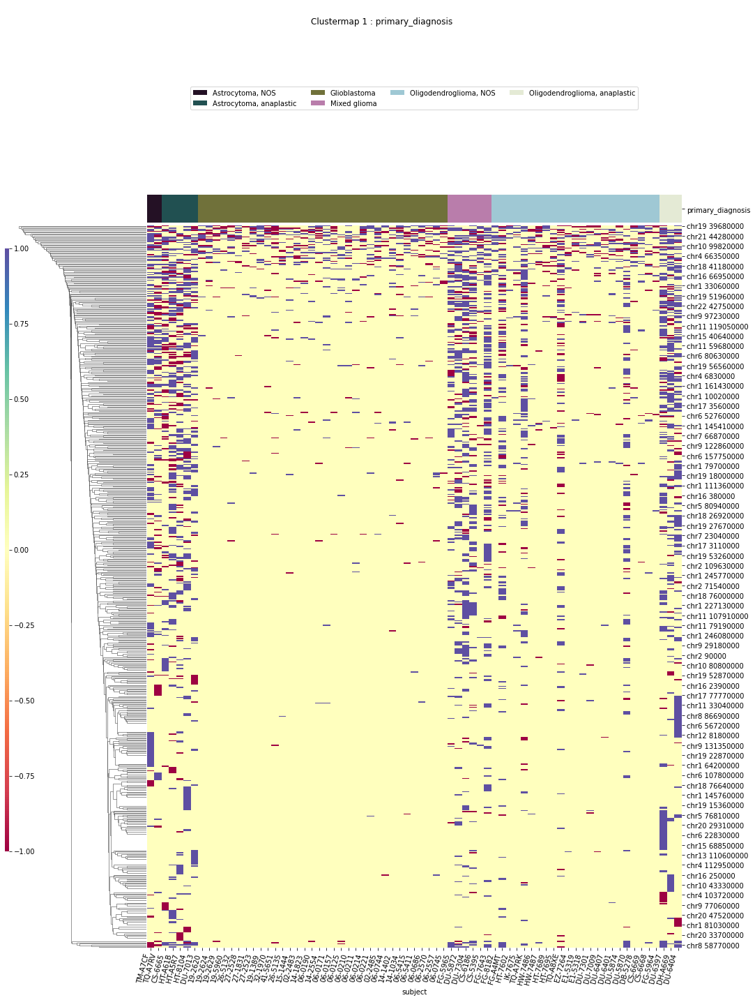

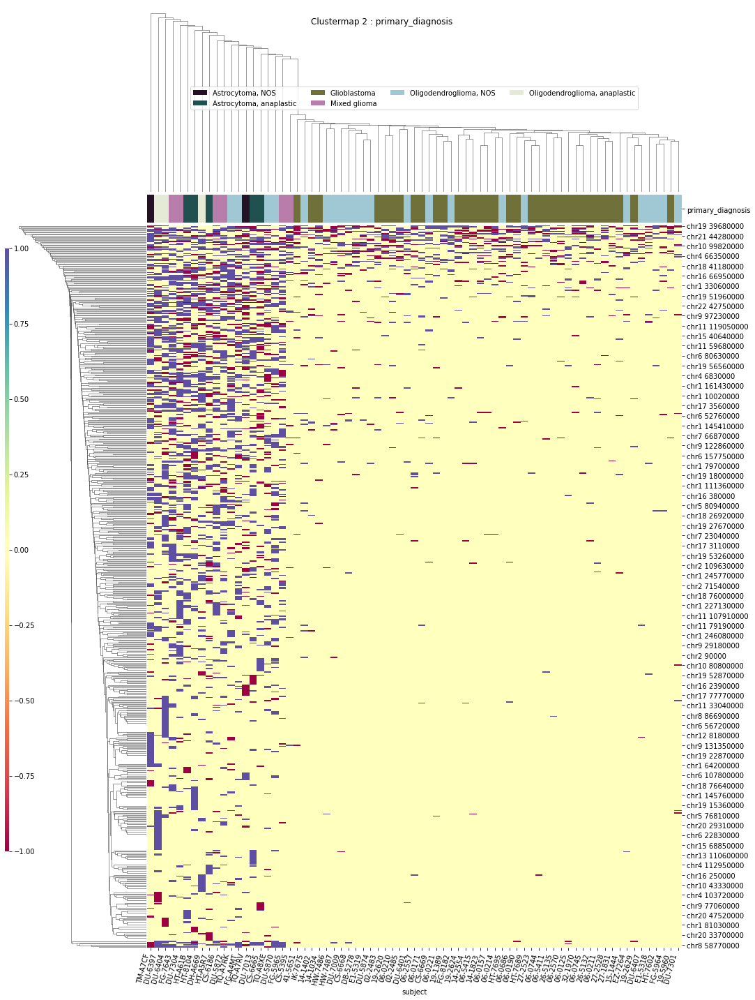

IDH
T-Testing
Boxplotting
Clustermapping
['IDH' 'chr10 130620000' 'chr10 65400000' 'chr12 58330000'
 'chr14 77630000' 'chr19 20280000' 'chr19 37620000' 'chr19 39680000'
 'chr2 169500000' 'chr4 186050000' 'chr6 99420000' 'chr8 144410000'
 'subject']


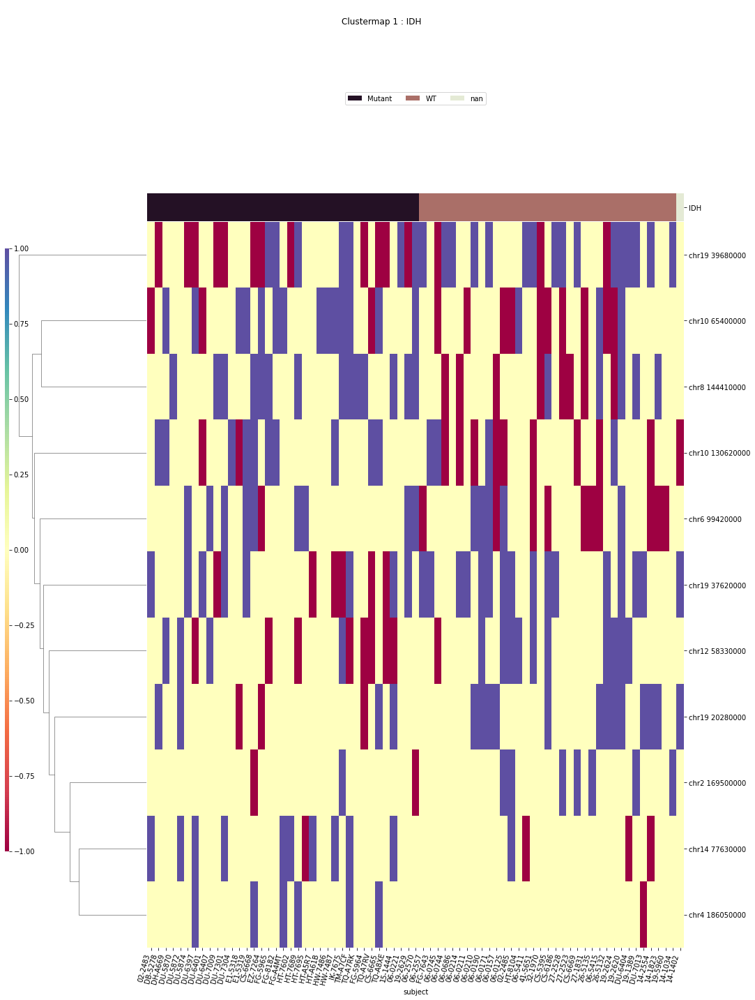

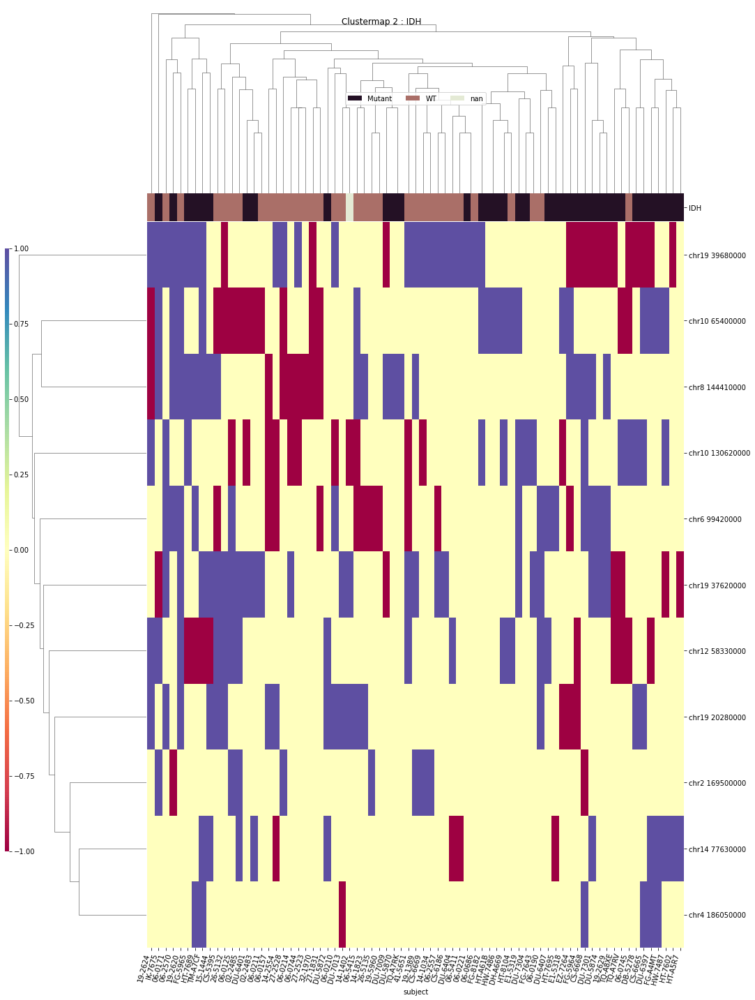

x1p19q
T-Testing
Boxplotting
Clustermapping
['chr1 145930000' 'chr1 15130000' 'chr1 66590000' 'chr1 70460000'
 'chr1 89060000' 'chr10 65400000' 'chr11 105260000' 'chr11 60450000'
 'chr16 21220000' 'chr19 20150000' 'chr19 20280000' 'chr19 28690000'
 'chr19 36240000' 'chr19 36790000' 'chr19 39680000' 'chr19 48930000'
 'chr2 207030000' 'chr22 21090000' 'subject' 'x1p19q']


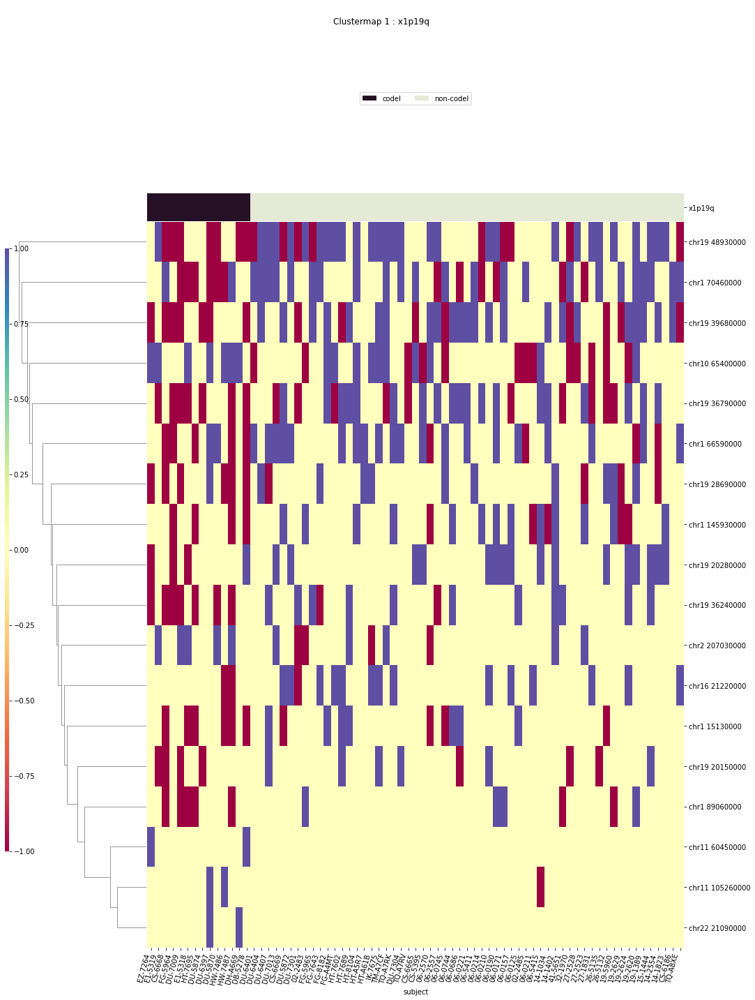

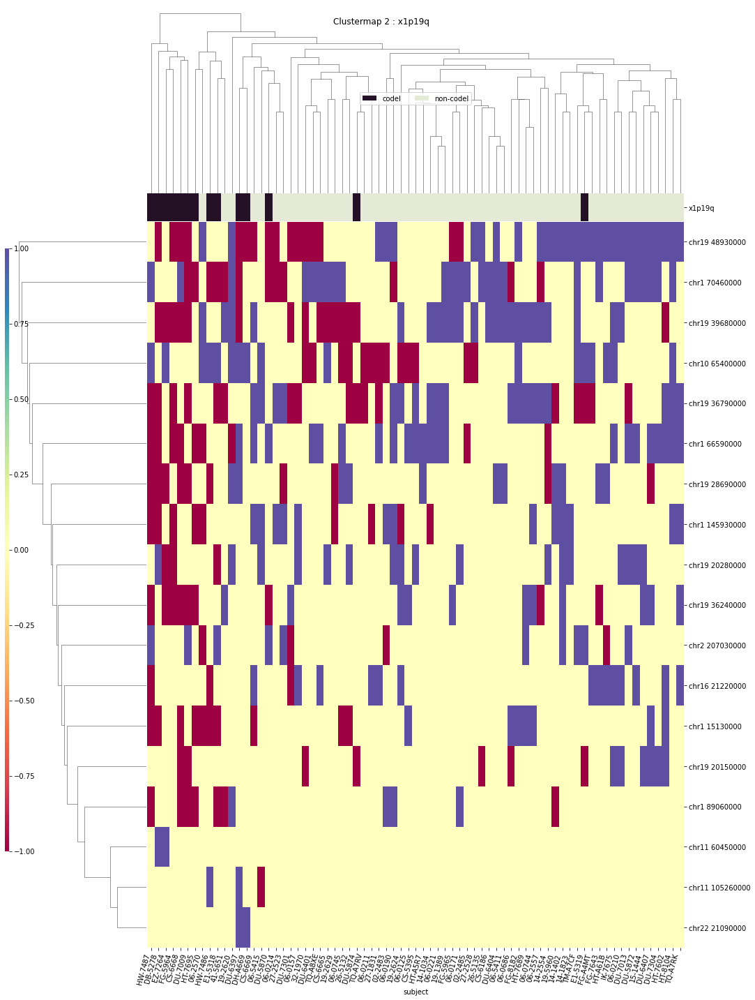

TERT
T-Testing
Boxplotting
Clustermapping
['TERT' 'chr1 73130000' 'chr10 19510000' 'chr13 22810000' 'chr19 20150000'
 'chr2 26740000' 'chr2 95240000' 'chr3 113020000' 'chr4 87740000'
 'chr5 100980000' 'chr5 115340000' 'chr6 24400000' 'chr8 12560000'
 'chr8 56100000' 'chr9 77300000' 'subject']


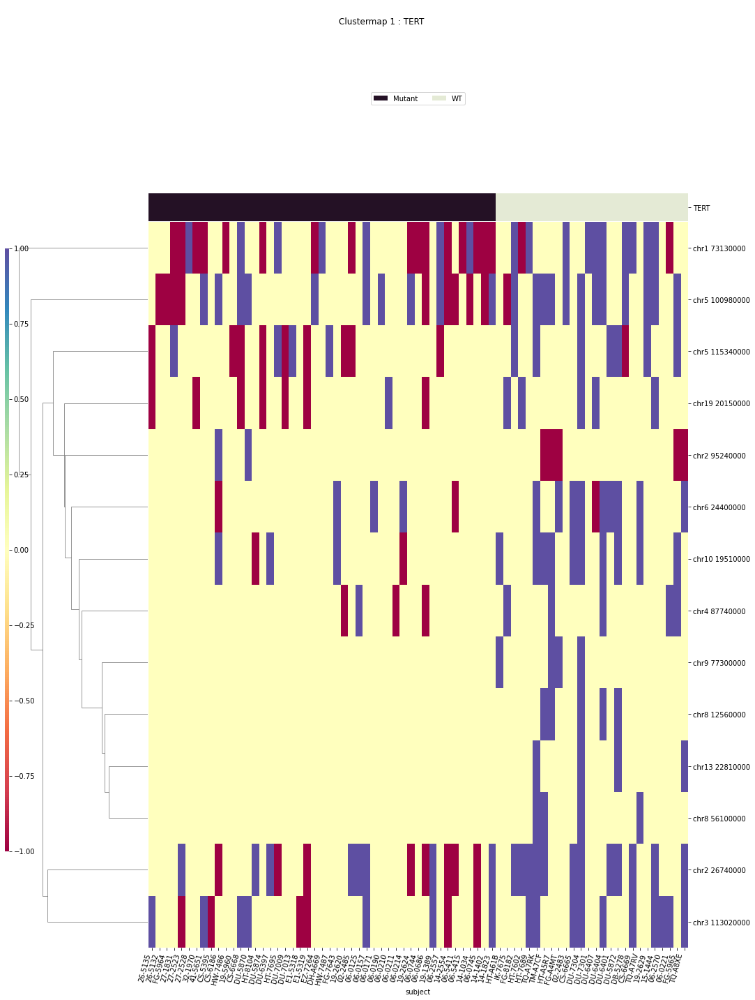

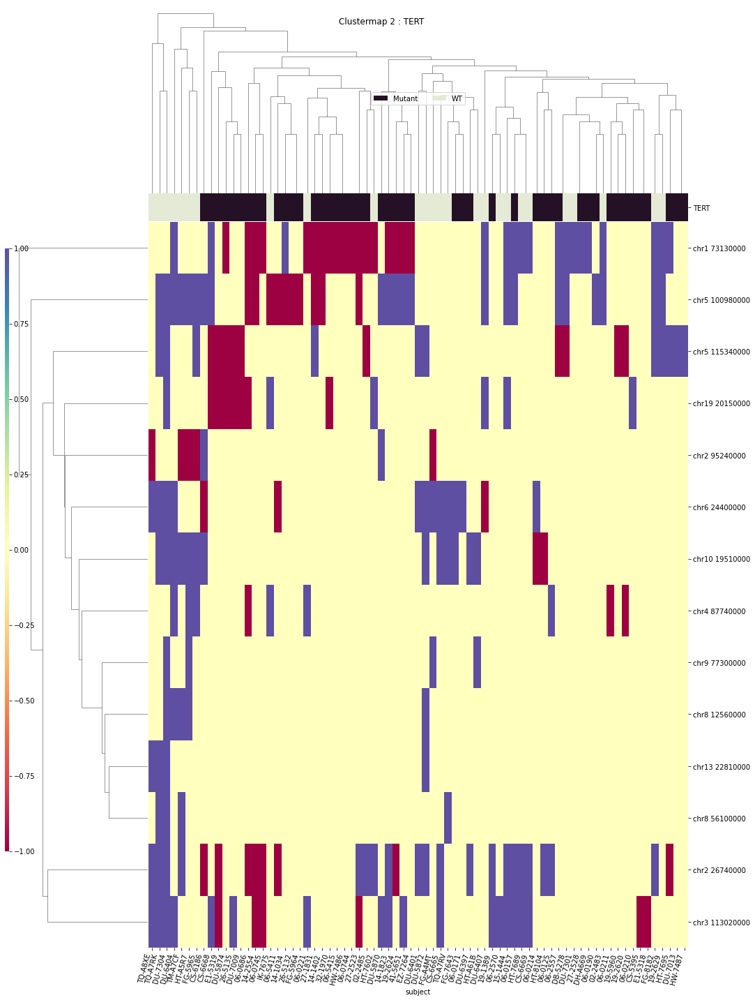

disease_type
T-Testing
Boxplotting
Clustermapping
['chr1 148130000' 'chr1 229930000' 'chr10 130620000' 'chr10 19510000'
 'chr10 41710000' 'chr10 65400000' 'chr10 6830000' 'chr10 86030000'
 'chr11 67750000' 'chr12 123490000' 'chr14 23970000' 'chr14 92810000'
 'chr15 58830000' 'chr15 78220000' 'chr16 35920000' 'chr17 30560000'
 'chr19 20280000' 'chr19 37620000' 'chr2 100680000' 'chr2 194500000'
 'chr2 228360000' 'chr20 15940000' 'chr21 39150000' 'chr22 23540000'
 'chr3 23540000' 'chr7 32750000' 'chr7 66870000' 'chr8 143060000'
 'chr8 32090000' 'chr8 57070000' 'chr8 58770000' 'chrX 55830000'
 'disease_type' 'subject']


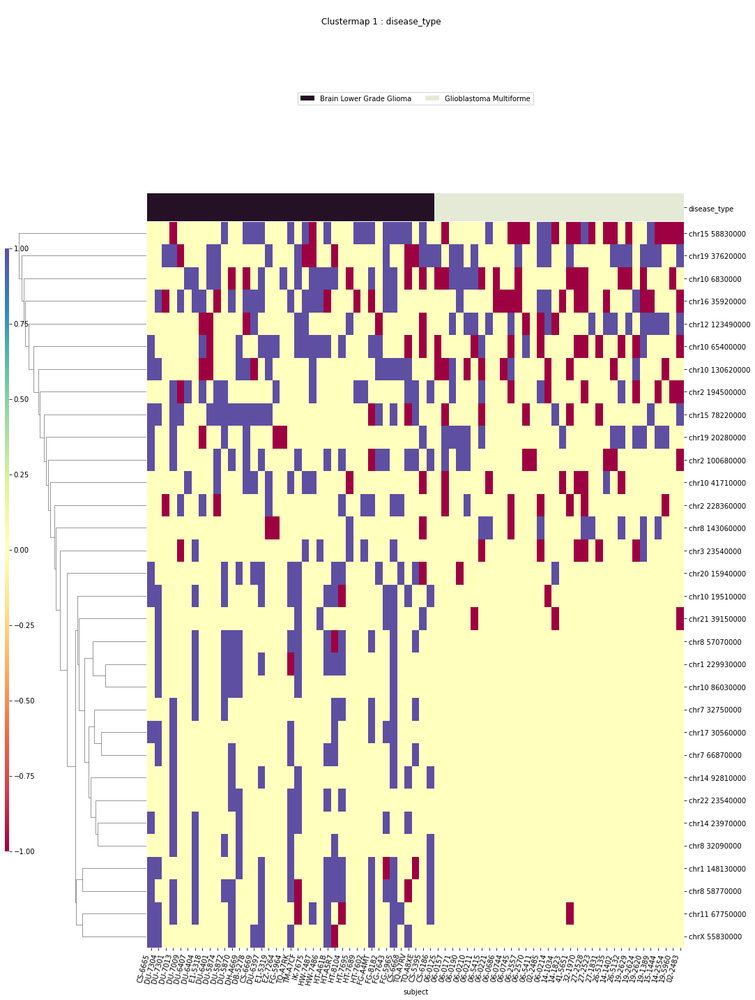

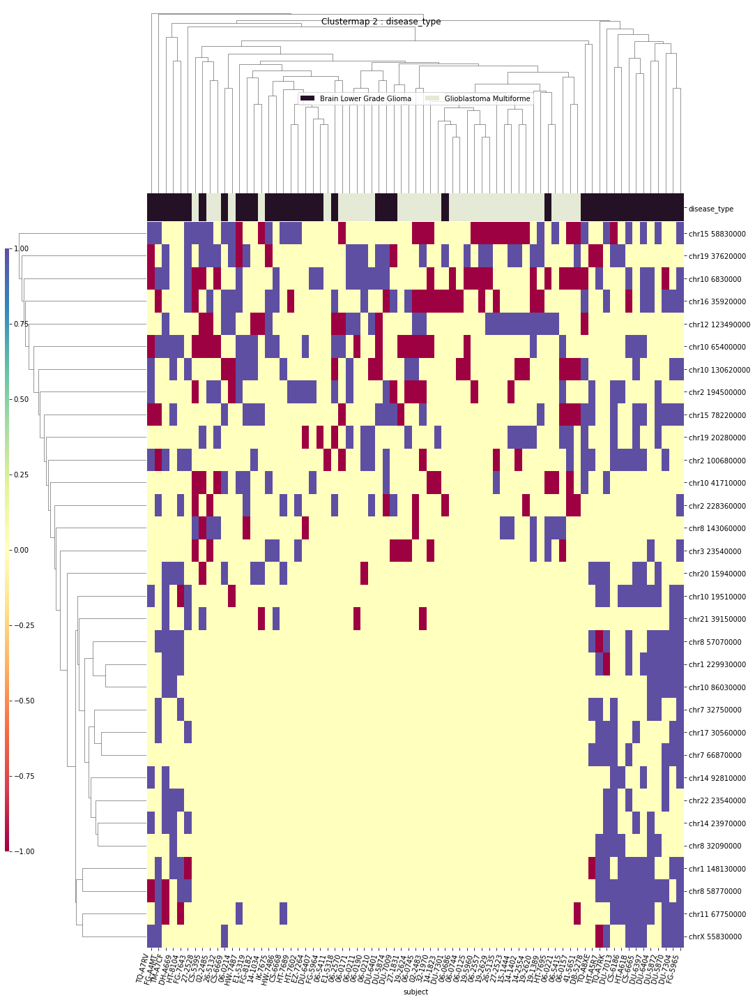

IDH_1p19q_status
T-Testing


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['IDH_1p19q_status' 'chr1 145930000' 'chr1 15130000' 'chr1 227710000'
 'chr1 66590000' 'chr1 70460000' 'chr1 89060000' 'chr10 19510000'
 'chr10 65400000' 'chr11 56610000' 'chr11 8520000' 'chr12 19340000'
 'chr13 22810000' 'chr14 77630000' 'chr15 78220000' 'chr16 21220000'
 'chr18 4910000' 'chr19 20150000' 'chr19 20280000' 'chr19 28690000'
 'chr19 36240000' 'chr19 36790000' 'chr19 37250000' 'chr19 39680000'
 'chr19 48930000' 'chr2 129960000' 'chr2 207030000' 'chr2 26740000'
 'chr2 95240000' 'chr3 98310000' 'chr4 150000' 'chr4 186050000'
 'chr5 115340000' 'chr7 66870000' 'chr8 144410000' 'chr8 56100000'
 'chr8 63170000' 'chr9 136780000' 'chr9 77300000' 'subject']


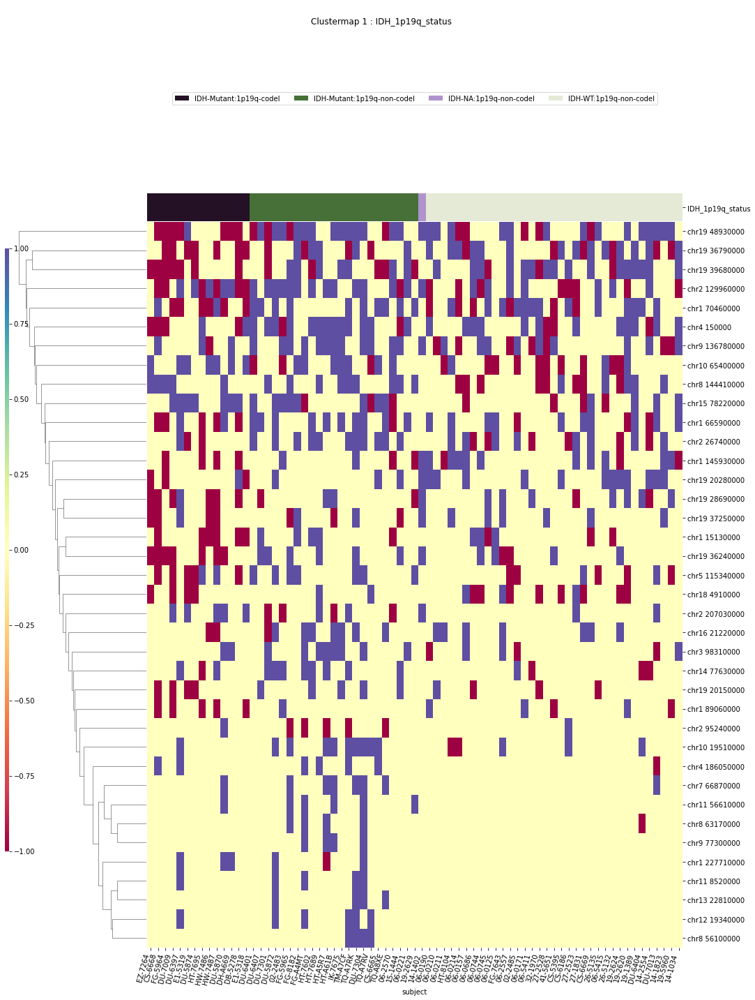

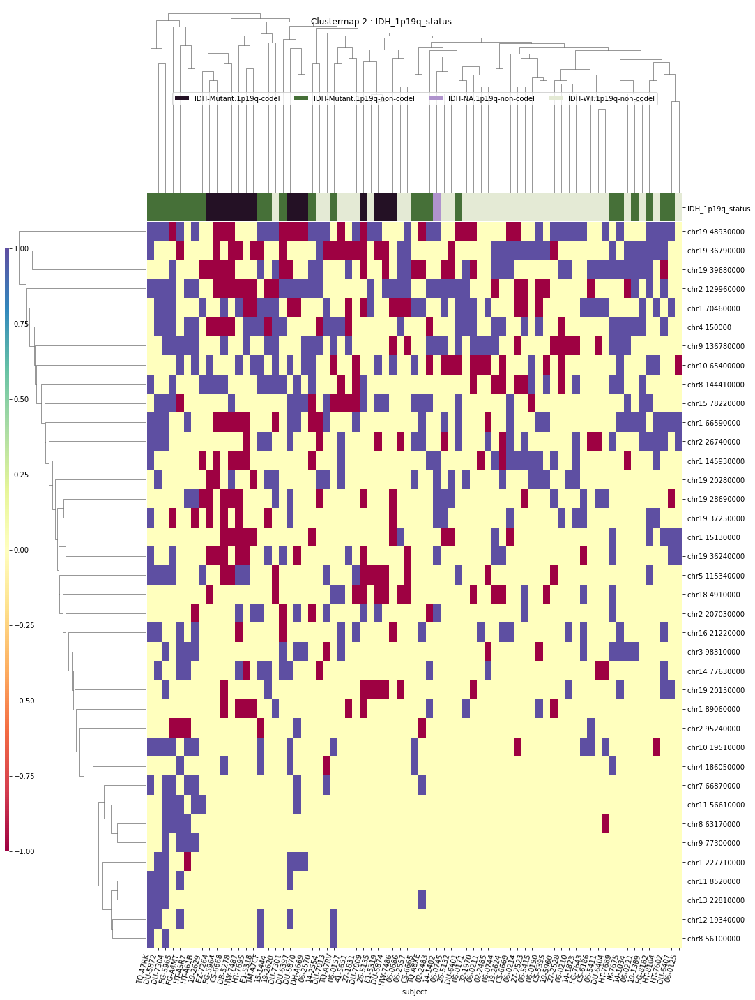

WHO_groups
T-Testing
Boxplotting
Clustermapping
['WHO_groups' 'chr1 10020000' 'chr1 108150000' 'chr1 111360000'
 'chr1 111520000' 'chr1 111800000' 'chr1 112810000' 'chr1 114790000'
 'chr1 120420000' 'chr1 13360000' 'chr1 143630000' 'chr1 143700000'
 'chr1 144450000' 'chr1 145410000' 'chr1 145760000' 'chr1 146940000'
 'chr1 148130000' 'chr1 149090000' 'chr1 15130000' 'chr1 152250000'
 'chr1 152470000' 'chr1 153580000' 'chr1 154280000' 'chr1 155620000'
 'chr1 156320000' 'chr1 160650000' 'chr1 160930000' 'chr1 161410000'
 'chr1 161430000' 'chr1 166600000' 'chr1 168830000' 'chr1 176390000'
 'chr1 179130000' 'chr1 188750000' 'chr1 199900000' 'chr1 207630000'
 'chr1 208650000' 'chr1 209120000' 'chr1 209140000' 'chr1 21050000'
 'chr1 211220000' 'chr1 225960000' 'chr1 227130000' 'chr1 227270000'
 'chr1 227710000' 'chr1 229930000' 'chr1 231120000' 'chr1 232330000'
 'chr1 234010000' 'chr1 237120000' 'chr1 246080000' 'chr1 247220000'
 'chr1 25600000' 'chr1 27820000' 'chr1 29350000' 'chr1 31170000

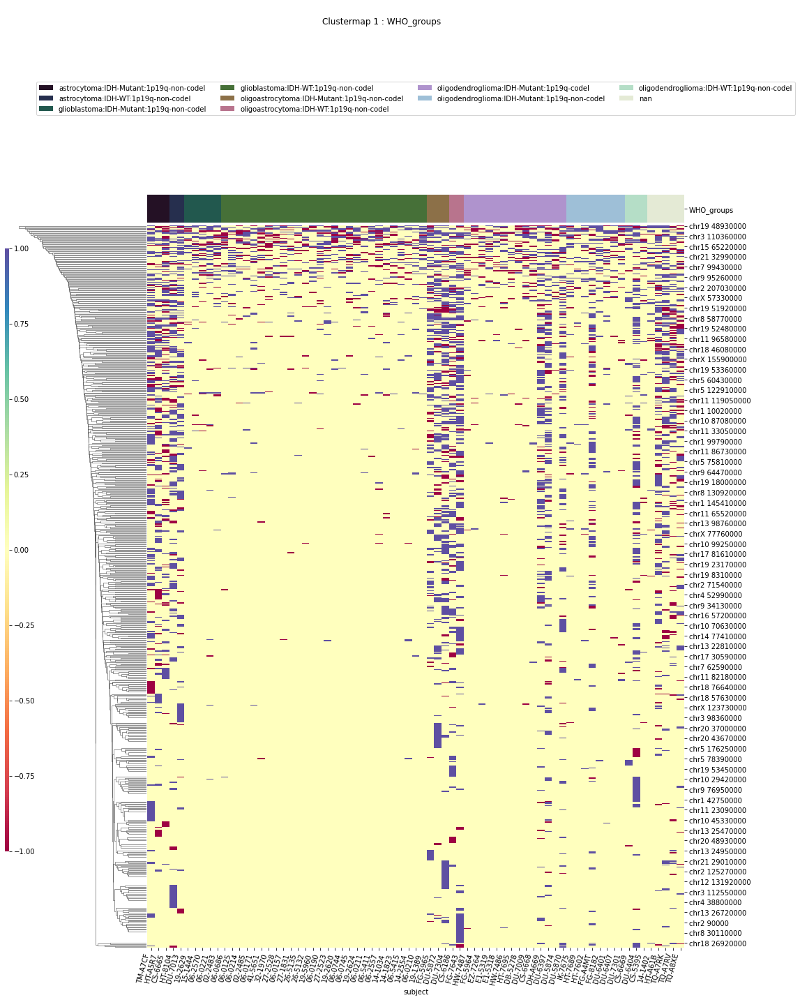

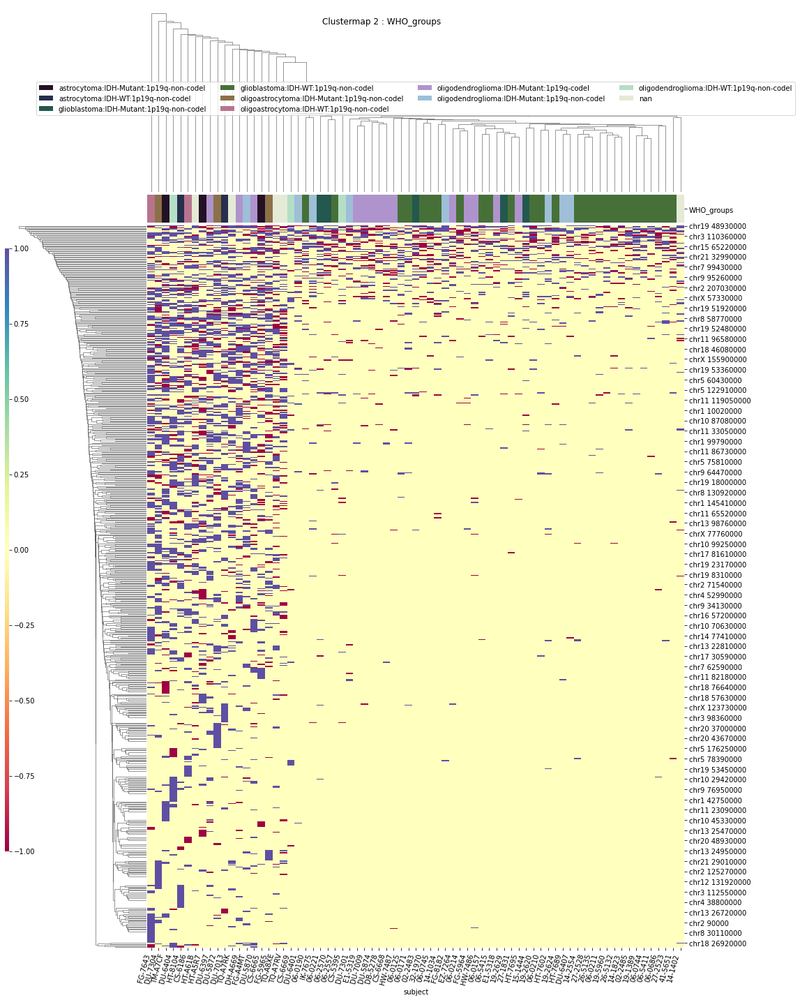

Triple_group
T-Testing
Boxplotting
Clustermapping
['Triple_group' 'chr1 111360000' 'chr1 120420000' 'chr1 15130000'
 'chr1 156320000' 'chr1 160930000' 'chr1 197400000' 'chr1 227270000'
 'chr1 227710000' 'chr1 229930000' 'chr1 236420000' 'chr1 27820000'
 'chr1 33060000' 'chr1 42750000' 'chr1 59910000' 'chr1 64410000'
 'chr1 70460000' 'chr1 75370000' 'chr1 81030000' 'chr1 89060000'
 'chr1 99830000' 'chr10 101030000' 'chr10 107800000' 'chr10 19510000'
 'chr10 26890000' 'chr10 29420000' 'chr10 42130000' 'chr10 45390000'
 'chr10 65400000' 'chr10 70630000' 'chr10 86030000' 'chr10 87080000'
 'chr10 99250000' 'chr11 19850000' 'chr11 33040000' 'chr11 37930000'
 'chr11 56610000' 'chr11 62320000' 'chr11 62350000' 'chr11 65450000'
 'chr11 65520000' 'chr11 75870000' 'chr12 108650000' 'chr12 121630000'
 'chr12 19340000' 'chr12 31180000' 'chr12 48910000' 'chr12 49860000'
 'chr12 53120000' 'chr12 56820000' 'chr12 68480000' 'chr12 8180000'
 'chr12 8260000' 'chr12 9950000' 'chr13 18250000' 'chr13 239700

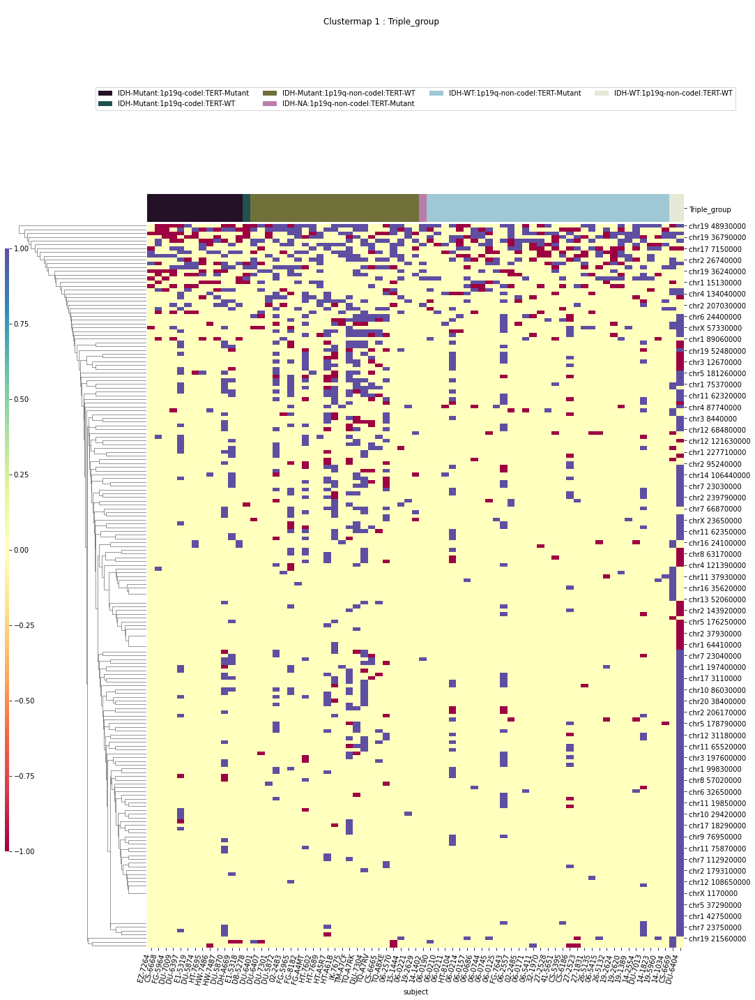

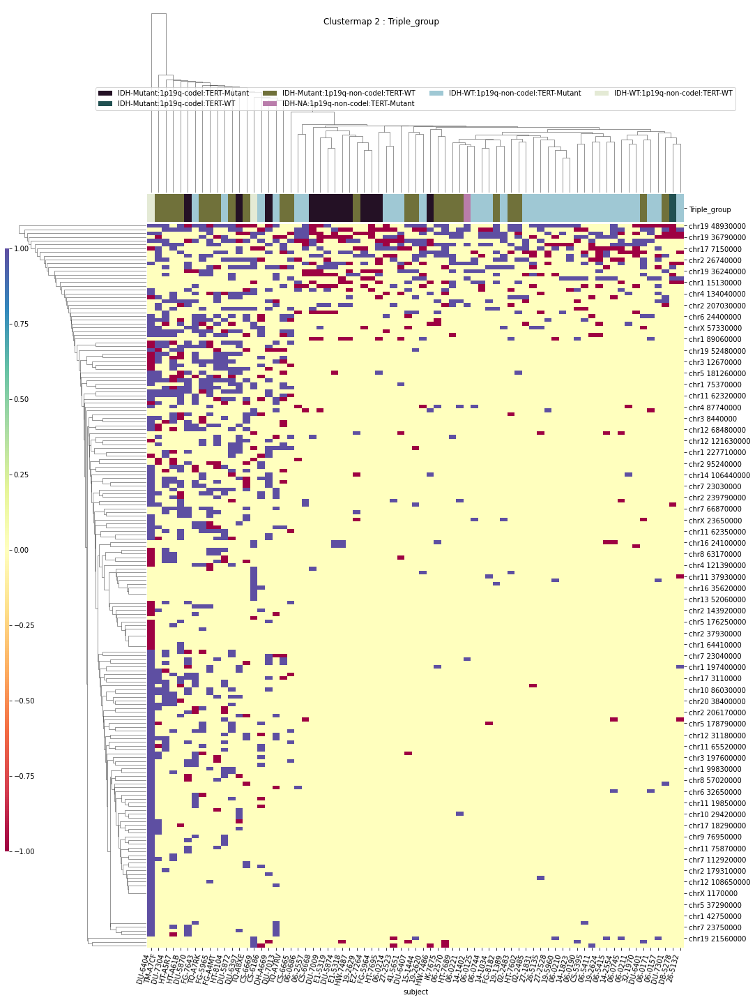

MGMT
T-Testing
Boxplotting
Clustermapping
['MGMT' 'chr1 152450000' 'chr12 107820000' 'chr17 7150000'
 'chr19 56680000' 'chr22 24210000' 'chr3 98310000' 'chr6 99420000'
 'chr8 142820000' 'subject']


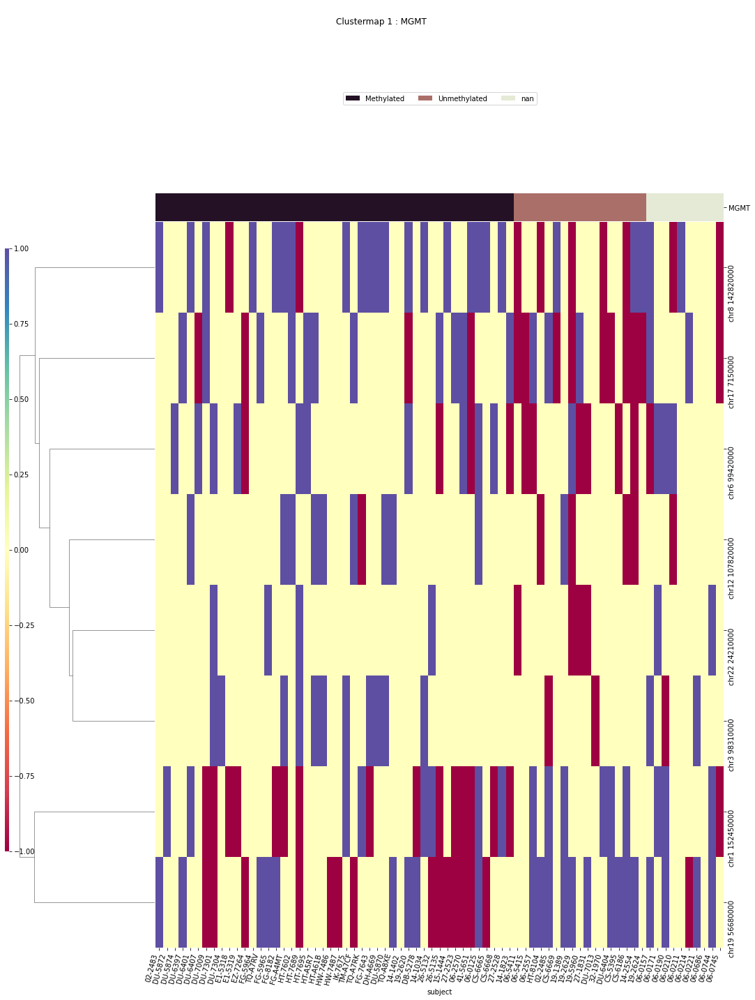

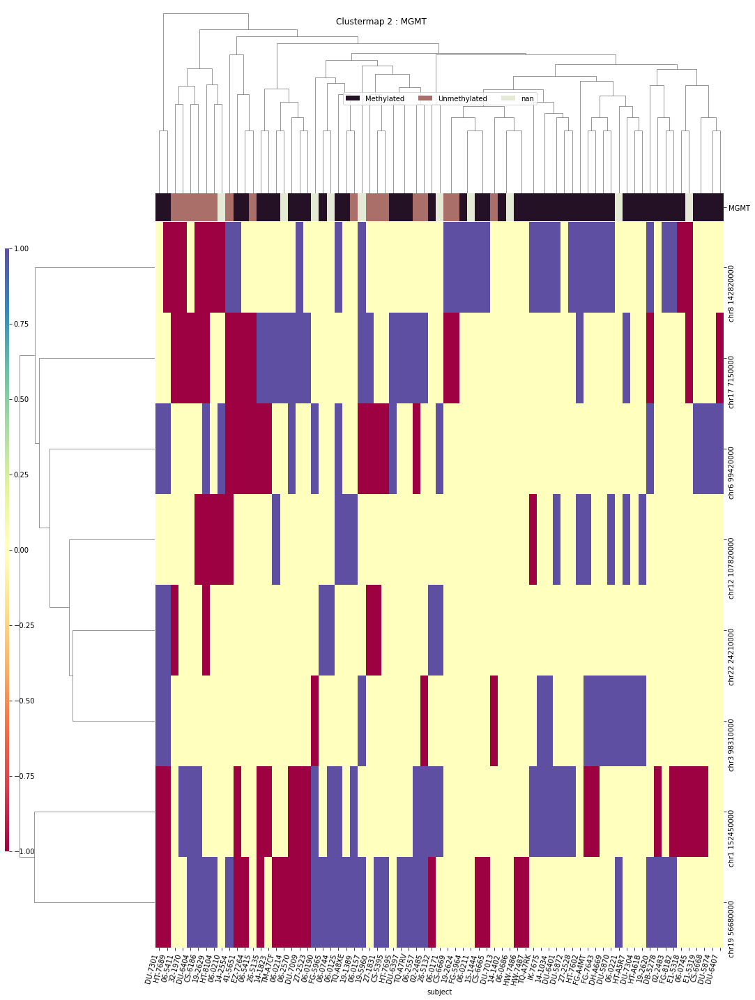

gender1
T-Testing
Boxplotting
Clustermapping
['chr1 150630000' 'chr11 59130000' 'chr12 10570000' 'chr2 65330000'
 'chr3 50510000' 'chr3 8440000' 'chr4 162410000' 'chr7 32750000'
 'chr8 143280000' 'chrX 138330000' 'gender1' 'subject']


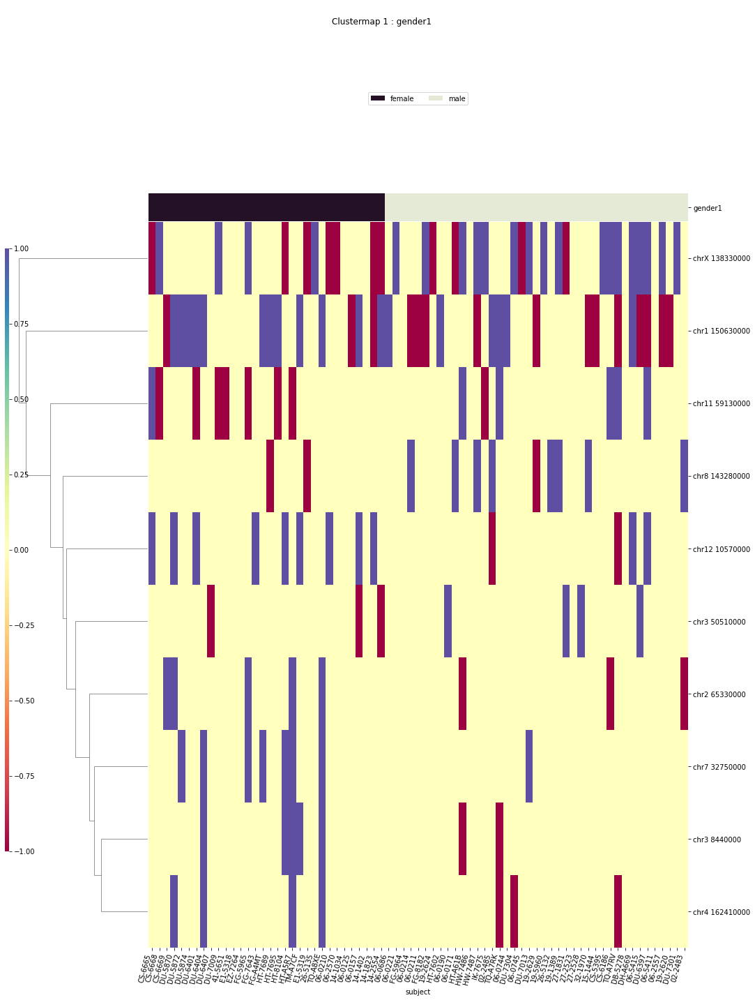

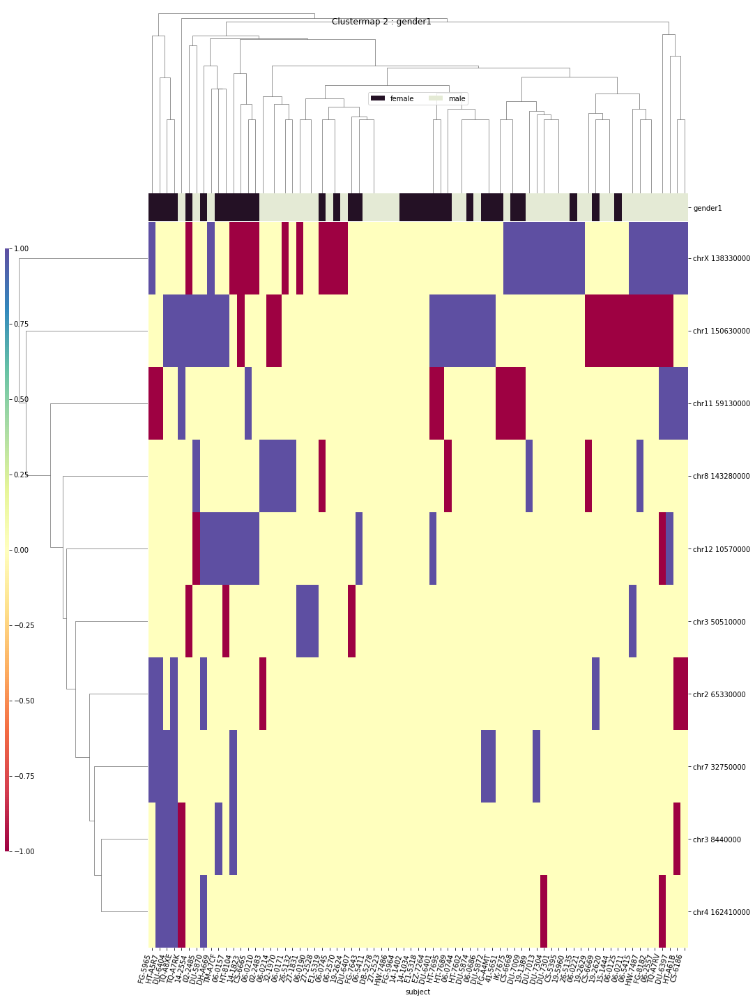

In [118]:
for column in 'race','ethnicity','primary_diagnosis','IDH','x1p19q','TERT','disease_type','IDH_1p19q_status','WHO_groups','Triple_group','MGMT','gender1':
    print(column)
    ttests_boxplots_and_heatmaps(compdf[compdf['hkle']==hkle],
        compdf.columns[compdf.columns.str.contains("^chr")],column,box_p=1e-10,heat_p=0.01)

In [119]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210525 21:35:11'

In [120]:
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [121]:
pd.set_option('display.max_columns', default_max_columns)

In [122]:
pd.set_option('display.max_rows',default_max_rows)

In [123]:
pd.set_option('display.precision', default_precision)